# Entrenando LSTM y GRU para la predicción en el sector A

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn

from math import inf
from torch.optim.lr_scheduler import StepLR, CosineAnnealingLR

data = pd.read_csv('/kaggle/input/sector-data/sector_data.csv')
data.timestamp = pd.to_datetime(data.timestamp)
data.set_index('timestamp', inplace=True)
data.head(12)

,A,B,C,D,hour,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
timestamp,,,,,,,,,,,,
2023-01-01 00:15:00,11.0,6.0,12.0,7.0,0,6,1,1,2023,1,1,52
2023-01-01 00:30:00,11.0,6.0,12.0,7.0,0,6,1,1,2023,1,1,52
2023-01-01 00:45:00,11.0,6.0,12.0,7.0,0,6,1,1,2023,1,1,52
2023-01-01 01:00:00,11.0,6.0,12.0,7.0,1,6,1,1,2023,1,1,52
2023-01-01 01:15:00,11.0,6.0,12.0,7.0,1,6,1,1,2023,1,1,52
2023-01-01 01:30:00,11.0,6.0,12.0,7.0,1,6,1,1,2023,1,1,52
2023-01-01 01:45:00,11.0,6.0,12.0,7.0,1,6,1,1,2023,1,1,52
2023-01-01 02:00:00,11.0,6.0,12.0,7.0,2,6,1,1,2023,1,1,52
2023-01-01 02:15:00,11.0,6.0,12.0,7.0,2,6,1,1,2023,1,1,52


Para acelerar el entrenamiento se utiliza una GPU de NVIDIA en Kaggle

In [9]:
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
device

'cuda:0'

El modelo observará los 7 valores anteriores para hacer su predicción, luego se preparan los datos añadiendo columnas extra y eliminando las que resulten ser nulas. Dada la correlación observada en el análisis entre las cantidades de distintos sectores se usarán los valores de los que no estén siendo usados como salida como feature del modelo

In [10]:
from copy import deepcopy as dc

def prepare_dataframe_for_lstm(df, n_steps):
    df = dc(df)
    
    for s in [*'ABCD']:
        for i in range(1, n_steps+1):
            df[f'{s}(t-{i})'] = df[f'{s}'].shift(i)

    df.dropna(inplace=True)

    return df

lookback = 7
shifted_df = prepare_dataframe_for_lstm(data, lookback)

shifted_df_as_np = shifted_df.to_numpy()

shifted_df_as_np.shape, shifted_df.shape

((35454, 40), (35454, 40))

Se obtienen los timestamps para uso posterior en la graficación 

In [11]:
shifted_timestamps = shifted_df.index
shifted_timestamps

DatetimeIndex(['2023-01-01 02:00:00', '2023-01-01 02:15:00',
               '2023-01-01 02:30:00', '2023-01-01 02:45:00',
               '2023-01-01 03:00:00', '2023-01-01 03:15:00',
               '2023-01-01 03:30:00', '2023-01-01 03:45:00',
               '2023-01-01 04:00:00', '2023-01-01 04:15:00',
               ...
               '2024-01-01 11:45:00', '2024-01-01 12:00:00',
               '2024-01-01 12:15:00', '2024-01-01 12:30:00',
               '2024-01-01 12:45:00', '2024-01-01 13:00:00',
               '2024-01-01 13:15:00', '2024-01-01 13:30:00',
               '2024-01-01 13:45:00', '2024-01-01 14:00:00'],
              dtype='datetime64[ns]', name='timestamp', length=35454, freq=None)

In [12]:
# from sklearn.preprocessing import MinMaxScaler

# scaler = MinMaxScaler(feature_range=(-1, 1))
# shifted_df_as_np = scaler.fit_transform(shifted_df_as_np)

Se realiza un volteo de los datos garantizando que queden en la forma esperada por los modelos.

In [13]:
flipped_sample = dc(np.flip(shifted_df_as_np[0:2], axis=1))[0]

X = shifted_df_as_np[:, 1:]
X = dc(np.flip(X, axis=1))
y = shifted_df_as_np[:, 0]

X.shape, y.shape

((35454, 39), (35454,))

Se utiliza el 95% de los datos para entrenar y el resto para inferencia

In [14]:
split_index = int(len(X) * 0.95)

X_train = X[:split_index]
X_test = X[split_index:]

y_train = y[:split_index]
y_test = y[split_index:]

train_ts = shifted_timestamps[:split_index]
test_ts = shifted_timestamps[split_index:]

split_index, X_train.shape, X_test.shape, y_train.shape, y_test.shape, train_ts.shape, test_ts.shape

(33681, (33681, 39), (1773, 39), (33681,), (1773,), (33681,), (1773,))

Garantizando que el volteo fue correcto

In [15]:
X_train[0] == flipped_sample[:-1]

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True])

Añadiendo la dimensión extra requerida por PyTorch

In [16]:
X_train = X_train.reshape((-1, X_train.shape[1], 1))
X_test = X_test.reshape((-1, X_train.shape[1], 1))

y_train = y_train.reshape((-1, 1))
y_test = y_test.reshape((-1, 1))

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((33681, 39, 1), (1773, 39, 1), (33681, 1), (1773, 1))

Convirtiendo de ```np.array``` a ```torch.tensor```

In [17]:
X_train = torch.tensor(X_train).float()
y_train = torch.tensor(y_train).float()
X_test = torch.tensor(X_test).float()
y_test = torch.tensor(y_test).float()

X_train.shape, X_test.shape, y_train.shape, y_test.shape

(torch.Size([33681, 39, 1]),
 torch.Size([1773, 39, 1]),
 torch.Size([33681, 1]),
 torch.Size([1773, 1]))

Creando la clase del dataset de serie de tiempo la cual requiere que sean implementados los métodos ```__len__``` y ```__getitem__```, así como que se asignen las propiedades ```X``` y ```y``` al momento de ser inicializado el objeto.
Seguido a esto se crea un objeto ```DataLoader``` encargado de crear los lotes de datos del tamaño de ```batch_size```.

In [18]:
from torch.utils.data import Dataset, DataLoader

class TimeSeriesDataset(Dataset):
    def __init__(self, X, y):
        self.X = X
        self.y = y

    def __len__(self):
        return len(self.X)

    def __getitem__(self, i):
        return self.X[i], self.y[i]
batch_size = 16
    
train_dataset = TimeSeriesDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

test_dataset = TimeSeriesDataset(X_test, y_test)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [19]:
train_dataset

In [20]:
for _, batch in enumerate(train_loader):
    x_batch, y_batch = batch[0].to(device), batch[1].to(device)# 1773,
    print(x_batch.shape, y_batch.shape)
    break

torch.Size([16, 39, 1]) torch.Size([16, 1])


Se crean las clases para cada uno de las arquitecturas (```LSTM``` y ```GRU```). Estos heredan de la clase ```nn.Module``` e implementan el método ```forward``` que se encarga de hacer la predicción pasando los datos por cada uno de las capas del modelo.

In [21]:
class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_stacked_layers):
        super().__init__()
        self.hidden_size = hidden_size
        self.num_stacked_layers = num_stacked_layers

        self.lstm = nn.LSTM(input_size, hidden_size, num_stacked_layers,
                            batch_first=True)

        self.fc = nn.Linear(hidden_size, 1)

    def forward(self, x):
        batch_size = x.size(0)
        h0 = torch.zeros(self.num_stacked_layers, batch_size, self.hidden_size).to(device)
        c0 = torch.zeros(self.num_stacked_layers, batch_size, self.hidden_size).to(device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out
    
class GRU(nn.Module):
    def __init__(self, input_size, hidden_size, num_stacked_layers):
        super().__init__()
        self.hidden_size = hidden_size
        self.num_stacked_layers = num_stacked_layers

        self.gru = nn.GRU(input_size, hidden_size, num_stacked_layers,
                            batch_first=True)

        self.fc = nn.Linear(hidden_size, 1)

    def forward(self, x):
        batch_size = x.size(0)
        h0 = torch.zeros(self.num_stacked_layers, batch_size, self.hidden_size).to(device)
#         c0 = torch.zeros(self.num_stacked_layers, batch_size, self.hidden_size).to(device)

        out, _ = self.gru(x, h0)
        out = self.fc(out[:, -1, :])
        return out

Funciones útiles durante el entrenamiento

In [22]:
def plot_datapoints(start,end, loss, m):
    """Plots datapoints from start to end in both the training and testing set"""
    fig, (ax_train, ax_test) = plt.subplots(2,1,figsize=(20,15))
    
    for ts_set, xset, yset, title,ax in zip([train_ts,test_ts],[X_train,X_test],[y_train,y_test], ['Train', 'Test'], [ax_train, ax_test]):
        with torch.no_grad():
            predicted = m(xset.to(device)).to('cpu').numpy()

        # datapoints = 250

        ax.plot(ts_set[start:end],yset[start:end], label='Actual Flow')
        ax.plot(ts_set[start:end],predicted[start:end], label='Predicted Flow')
        ax.set_xlabel('DateTIme')
        ax.set_ylabel('Count of airplanes')
        ax.set_title(f"Predictions on {title} for {loss}")
        ax.legend()

    #     fig.title(f"{d} Datapoints")
    plt.show()
    

def train_one_epoch(epoch, model):
    model.train(True)
    print(f'Epoch: {epoch + 1}')
    running_loss = 0.0

    for batch_index, batch in enumerate(train_loader):
        x_batch, y_batch = batch[0].to(device), batch[1].to(device)

        output = model(x_batch)
        loss = loss_function(output, y_batch)
        running_loss += loss.item()

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        avg_loss_across_batches = running_loss / len(train_loader)
    scheduler.step()
    print()
    
    return (model, avg_loss_across_batches)

def validate_one_epoch(model):
    model.train(False)
    running_loss = 0.0

    for batch_index, batch in enumerate(test_loader):
        x_batch, y_batch = batch[0].to(device), batch[1].to(device)

        with torch.no_grad():
            output = model(x_batch)
            loss = loss_function(output, y_batch)
            running_loss += loss.item()
            
    avg_loss_across_batches = running_loss / len(test_loader)
    
    return avg_loss_across_batches
    

Función encargadada de entrenar el modelo

In [23]:
def train_and_evaluate(model, num_epochs, start, end, min_loss=float('inf'), best_model=None):
    """
    Trains a model for a specified number of epochs, evaluates its performance,
    and keeps track of the best model based on validation loss.

    Args:
        model: The model to train.
        num_epochs: The number of epochs to train for.
        start: Starting epoch number (for plotting purposes).
        end: Ending epoch number (for plotting purposes).
        min_loss (optional): Initial minimum validation loss (default: infinity).
        best_model (optional): Best model found so far (default: None).

    Returns:
        A list of tuples containing (train_loss, val_loss) for each epoch, along with the best model
    """

    loss_history = []
    for epoch in range(num_epochs):
        m, train_loss = train_one_epoch(epoch, model)
        train_loss = round(train_loss, 3)
        val_loss = round(validate_one_epoch(model), 3)

        title = f'Train Loss {train_loss} | Val Loss: {val_loss}'
        print(title)

        if val_loss < min_loss:
            min_loss = val_loss
            best_model = model
            plot_datapoints(start, end, title, model)

        loss_history.append((train_loss, val_loss))
        print('\n' + '*' * len(title))

    return (loss_history,best_model)

Estableciendo los hiperparámetros comunes para el entrenamiento

In [24]:
learning_rate = 0.001
num_epochs = 500

Durante el entrenamiento de cada modelo se establecen:
- Función de pérdida -> Error Cuadrático Medio
- Optimizador -> Adam
- Planificador de Tasa de Aprendizaje -> Función Step (reduce a la mitad la tasa de aprendizaje cada 200 épocas)

LSTM(
  (lstm): LSTM(1, 4, batch_first=True)
  (fc): Linear(in_features=4, out_features=1, bias=True)
)

Epoch: 1

Train Loss 34.829 | Val Loss: 16.945


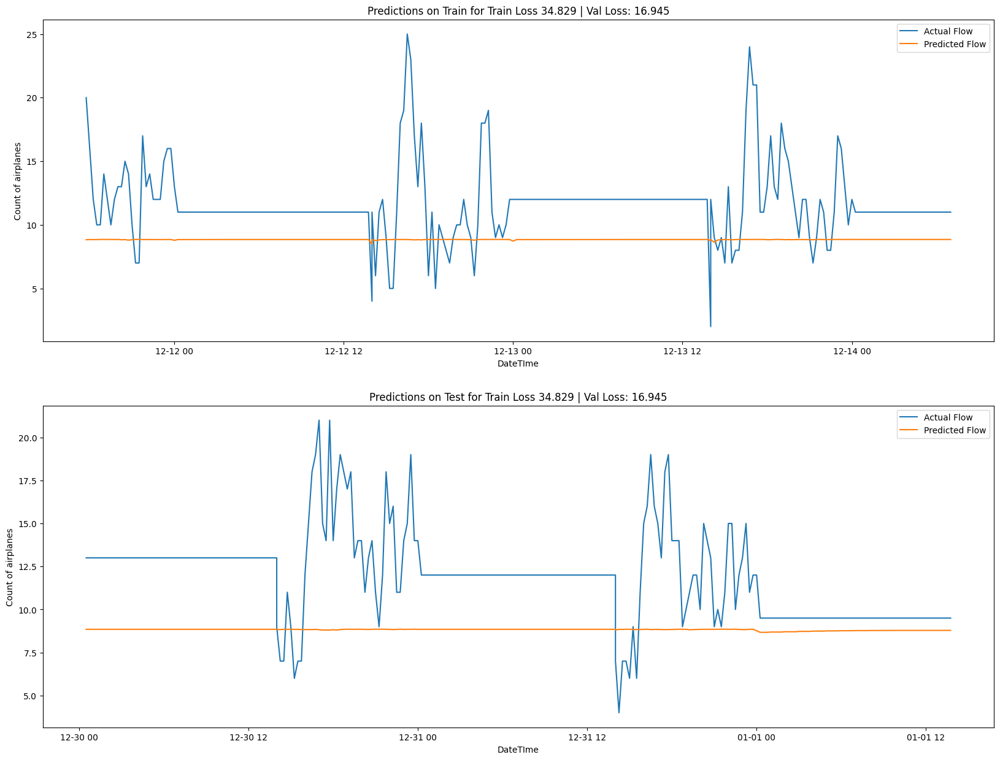


************************************
Epoch: 2

Train Loss 6.234 | Val Loss: 8.532


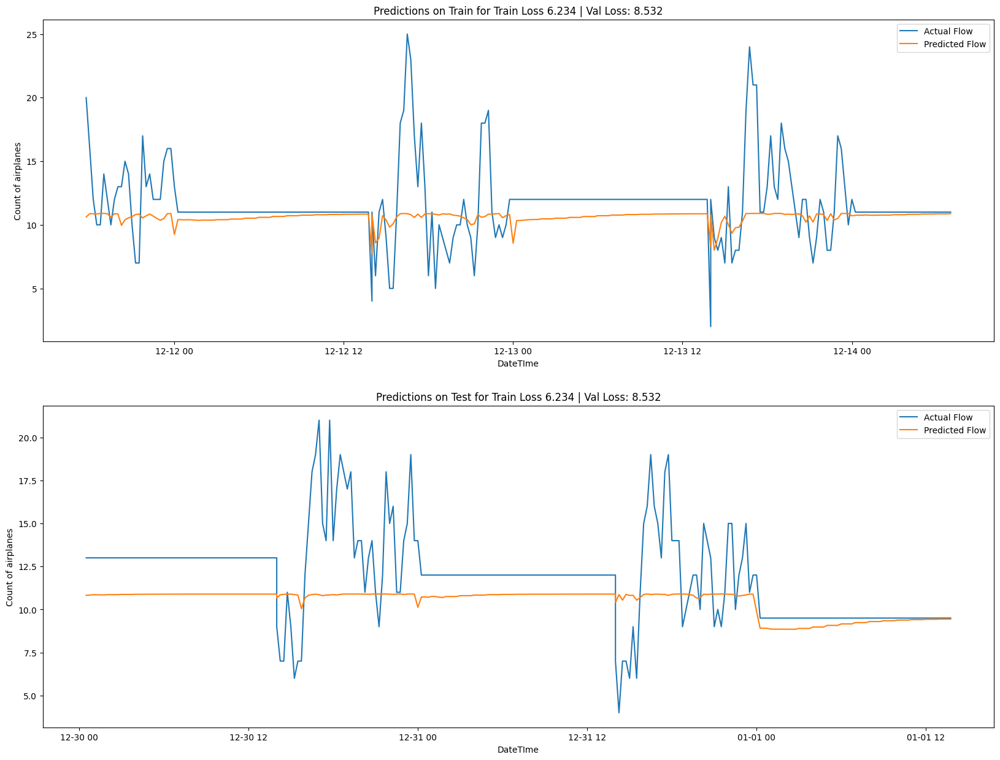


**********************************
Epoch: 3

Train Loss 5.433 | Val Loss: 6.933


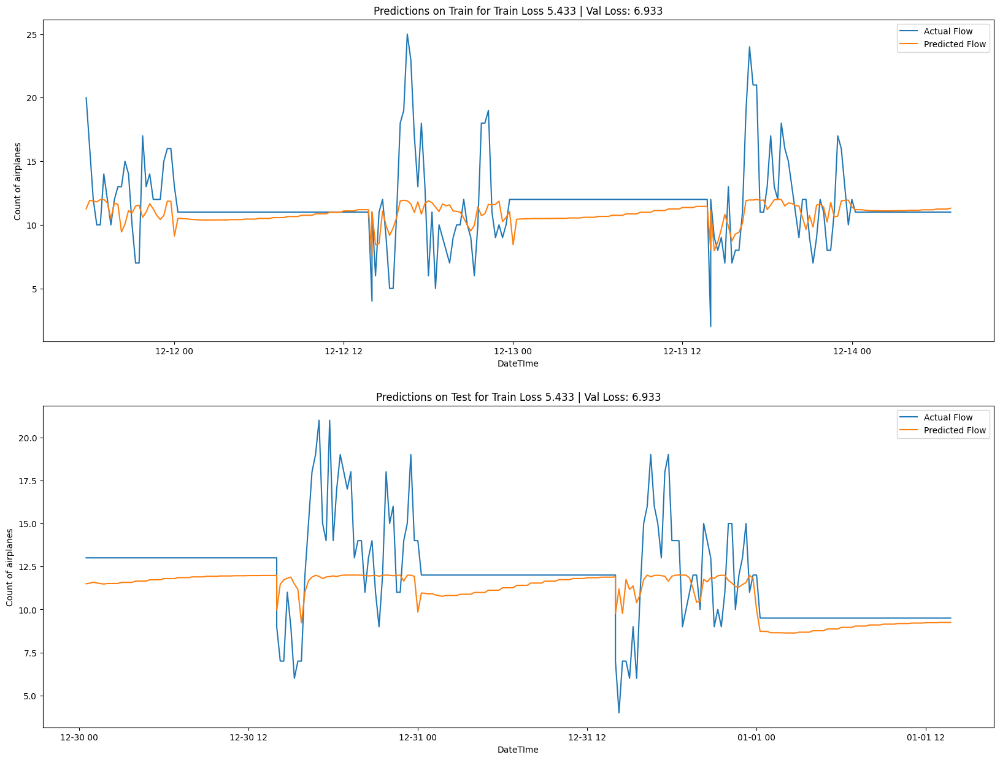


**********************************
Epoch: 4

Train Loss 5.275 | Val Loss: 6.506


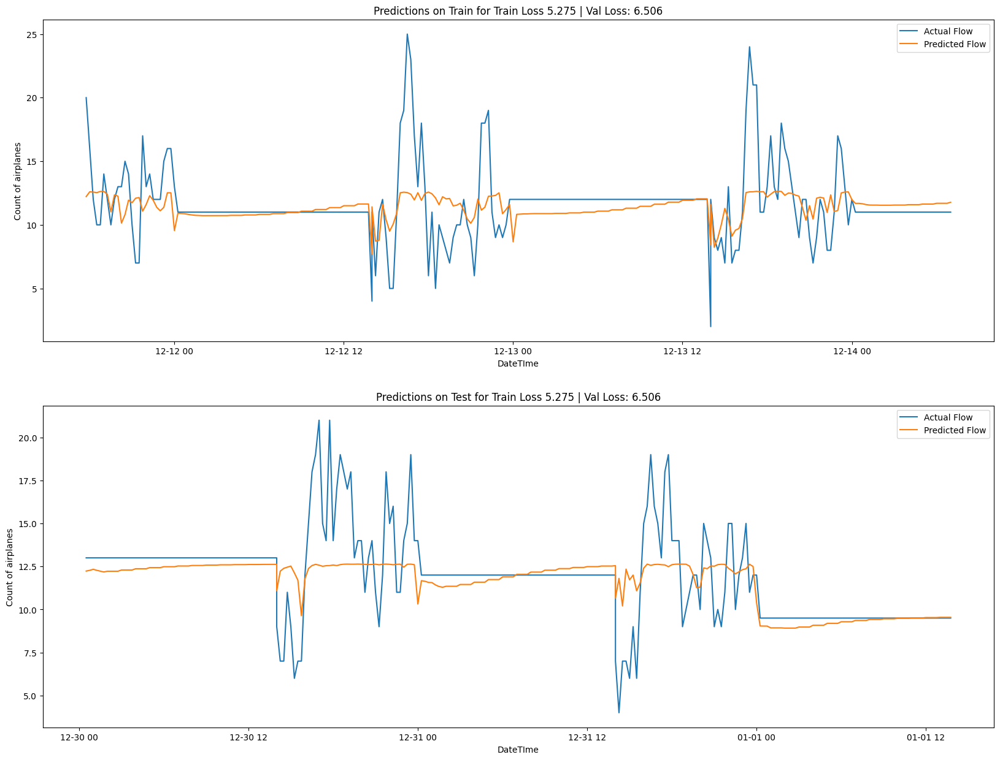


**********************************
Epoch: 5

Train Loss 5.223 | Val Loss: 6.349


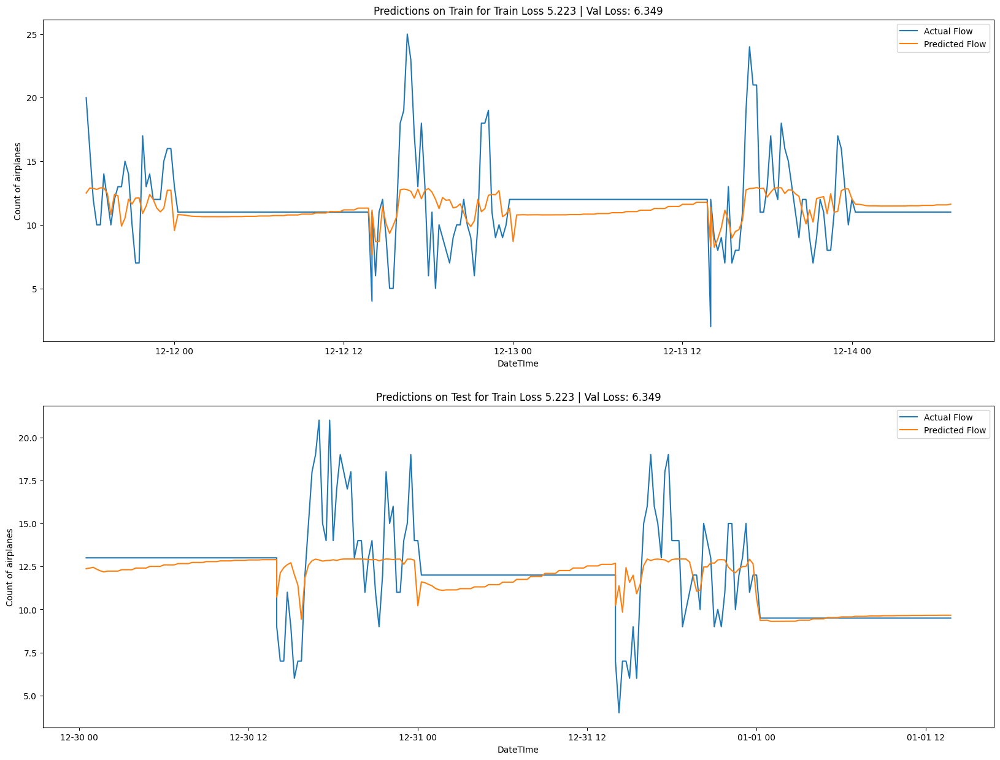


**********************************
Epoch: 6

Train Loss 5.183 | Val Loss: 6.279


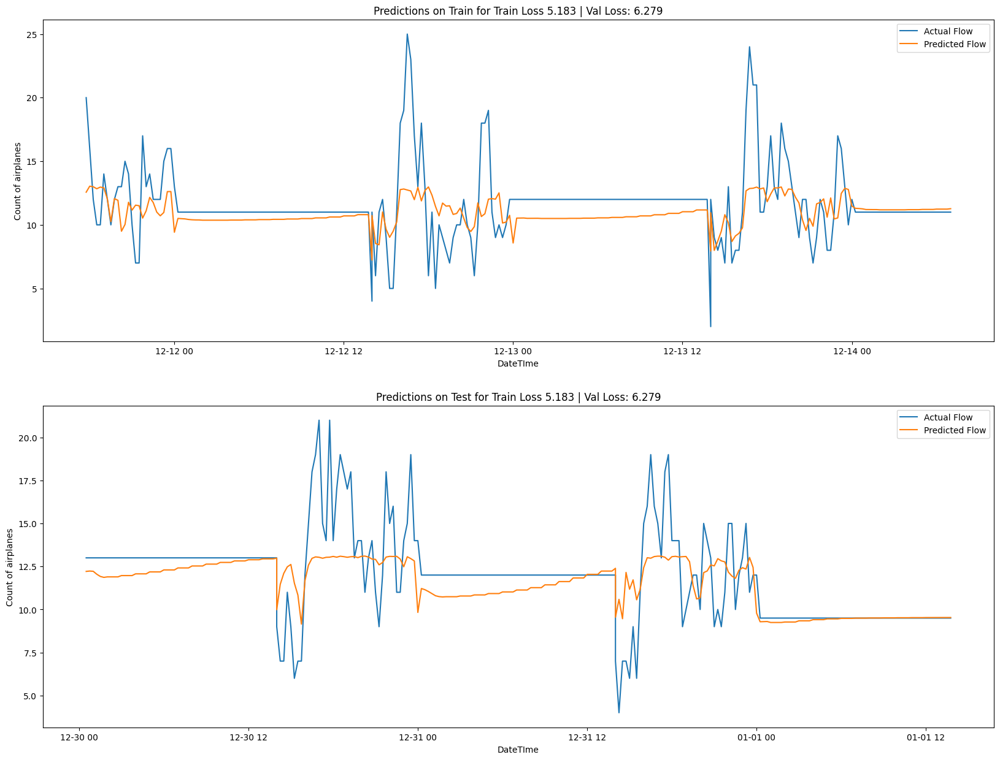


**********************************
Epoch: 7

Train Loss 5.158 | Val Loss: 6.193


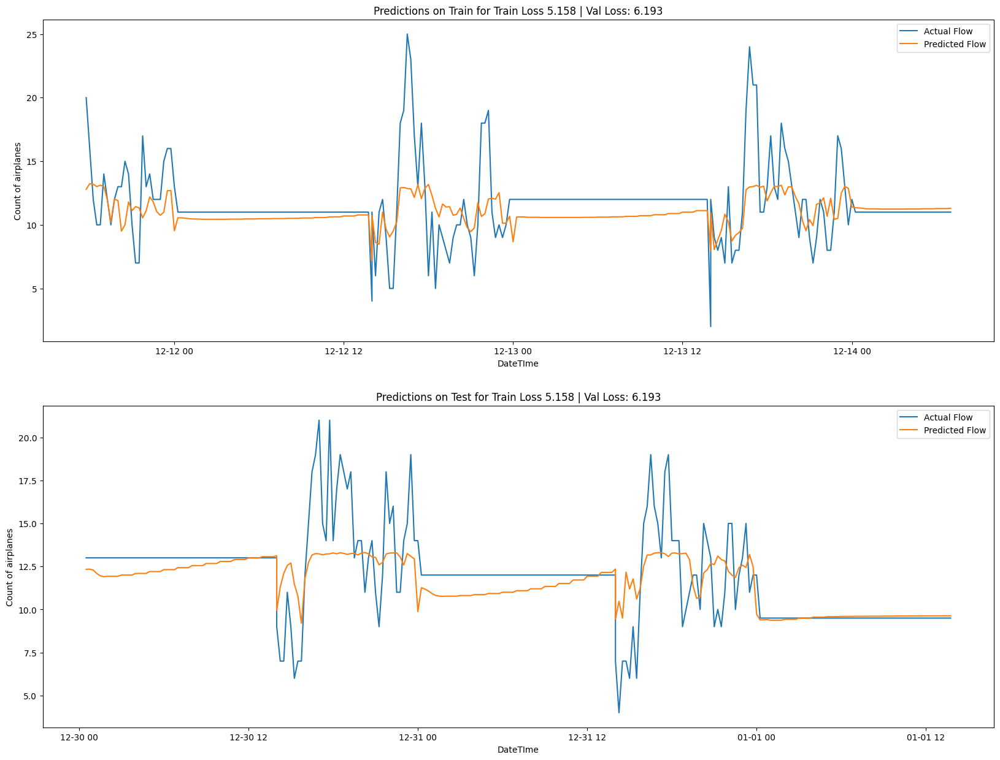


**********************************
Epoch: 8

Train Loss 5.13 | Val Loss: 6.162


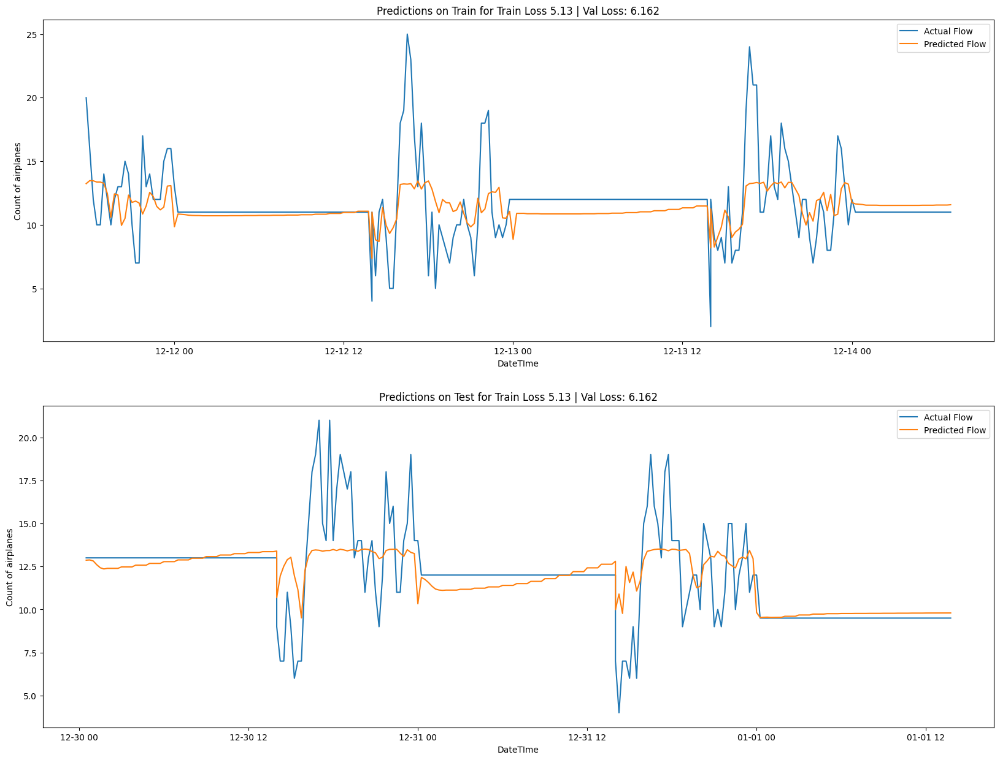


*********************************
Epoch: 9

Train Loss 5.117 | Val Loss: 6.147


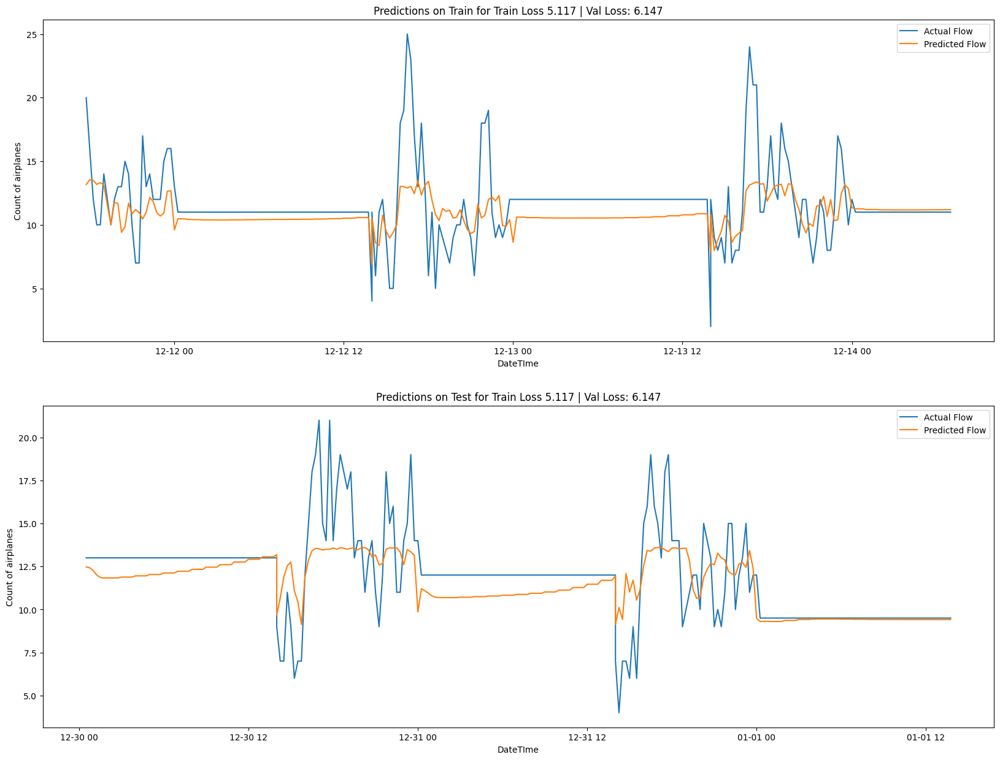


**********************************
Epoch: 10

Train Loss 5.107 | Val Loss: 6.08


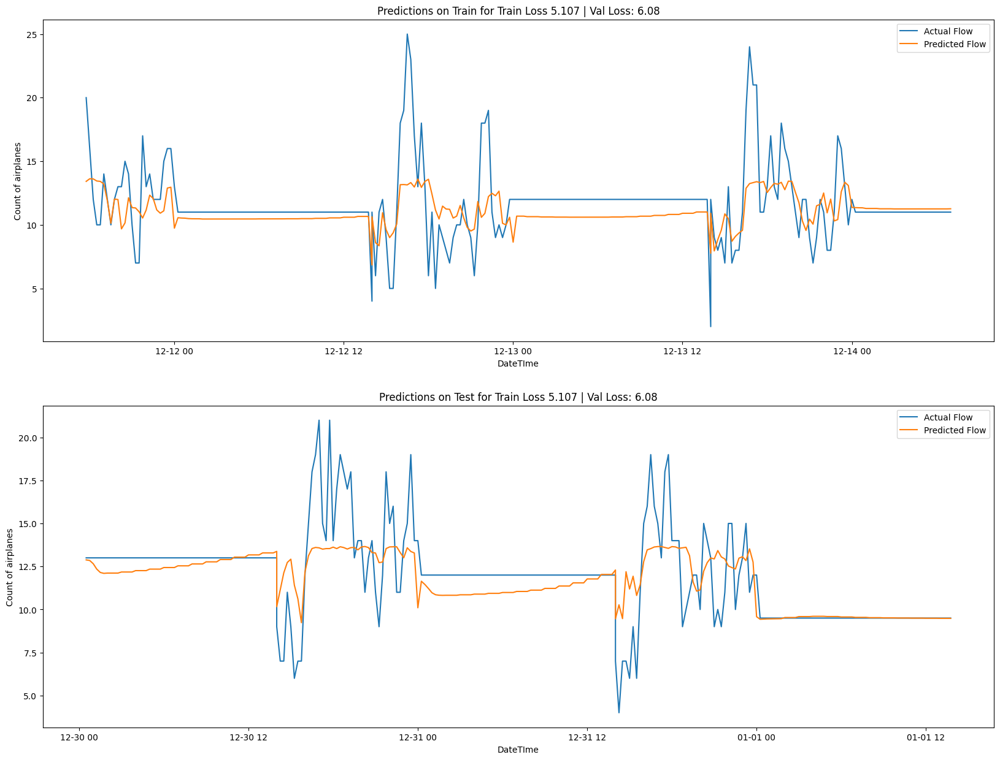


*********************************
Epoch: 11

Train Loss 5.099 | Val Loss: 6.064


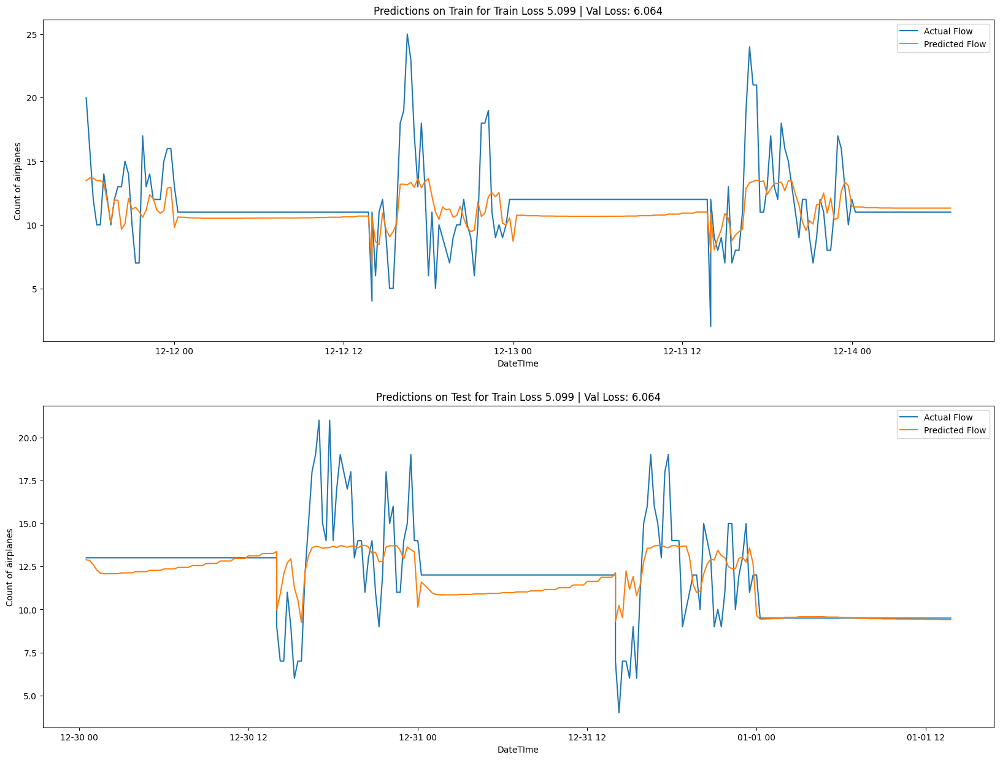


**********************************
Epoch: 12

Train Loss 5.086 | Val Loss: 6.041


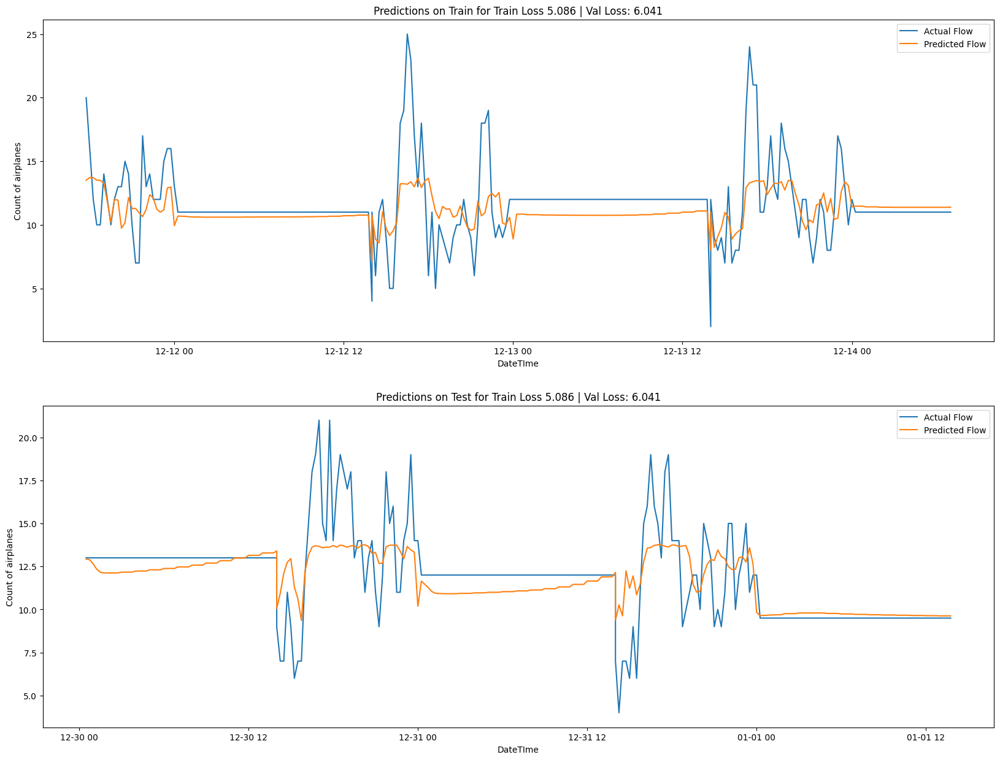


**********************************
Epoch: 13

Train Loss 5.086 | Val Loss: 6.082

**********************************
Epoch: 14

Train Loss 5.074 | Val Loss: 6.053

**********************************
Epoch: 15

Train Loss 5.07 | Val Loss: 6.068

*********************************
Epoch: 16

Train Loss 5.058 | Val Loss: 6.11

*********************************
Epoch: 17

Train Loss 5.053 | Val Loss: 6.09

*********************************
Epoch: 18

Train Loss 5.036 | Val Loss: 6.116

**********************************
Epoch: 19

Train Loss 5.032 | Val Loss: 6.114

**********************************
Epoch: 20

Train Loss 5.032 | Val Loss: 6.127

**********************************
Epoch: 21

Train Loss 5.022 | Val Loss: 6.125

**********************************
Epoch: 22

Train Loss 5.013 | Val Loss: 6.175

**********************************
Epoch: 23

Train Loss 5.01 | Val Loss: 6.205

*********************************
Epoch: 24

Train Loss 5.007 | Val Loss: 6.149

***********************

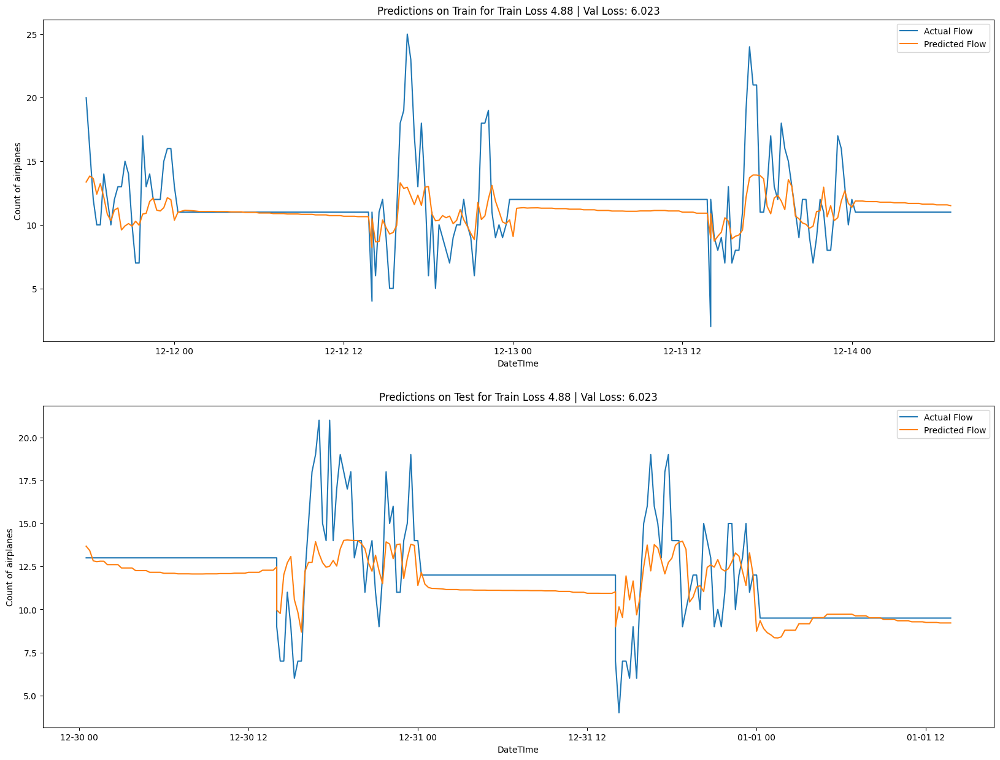


*********************************
Epoch: 54

Train Loss 4.87 | Val Loss: 6.052

*********************************
Epoch: 55

Train Loss 4.871 | Val Loss: 5.972


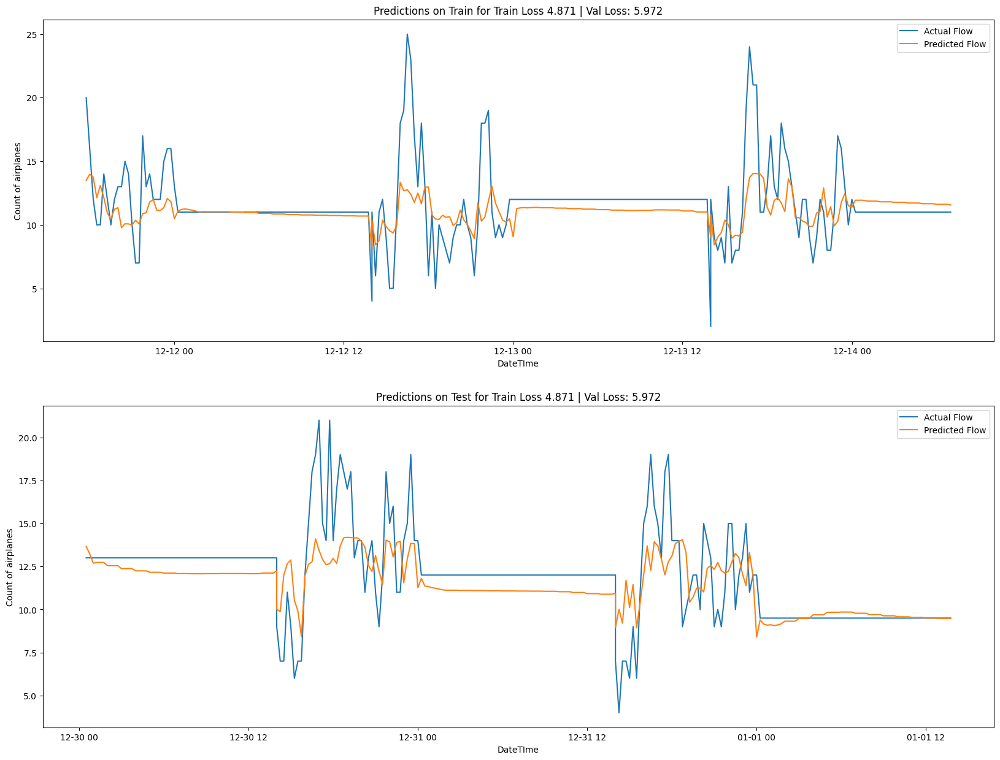


**********************************
Epoch: 56

Train Loss 4.865 | Val Loss: 5.974

**********************************
Epoch: 57

Train Loss 4.859 | Val Loss: 6.008

**********************************
Epoch: 58

Train Loss 4.848 | Val Loss: 5.987

**********************************
Epoch: 59

Train Loss 4.851 | Val Loss: 5.965


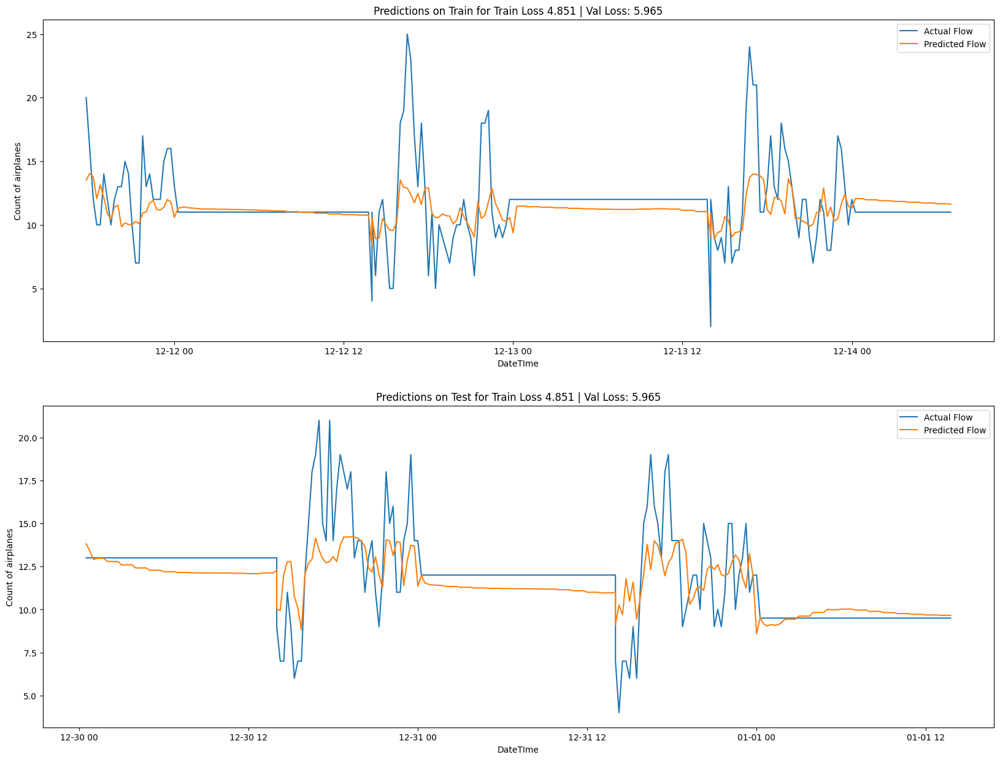


**********************************
Epoch: 60

Train Loss 4.839 | Val Loss: 5.944


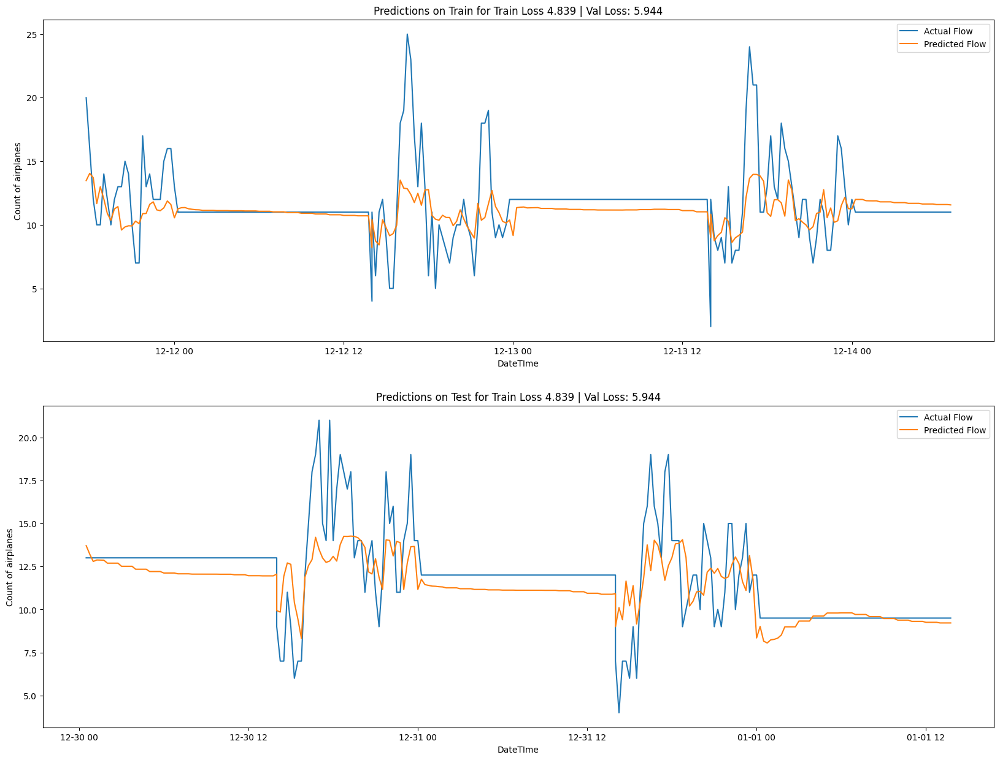


**********************************
Epoch: 61

Train Loss 4.83 | Val Loss: 5.924


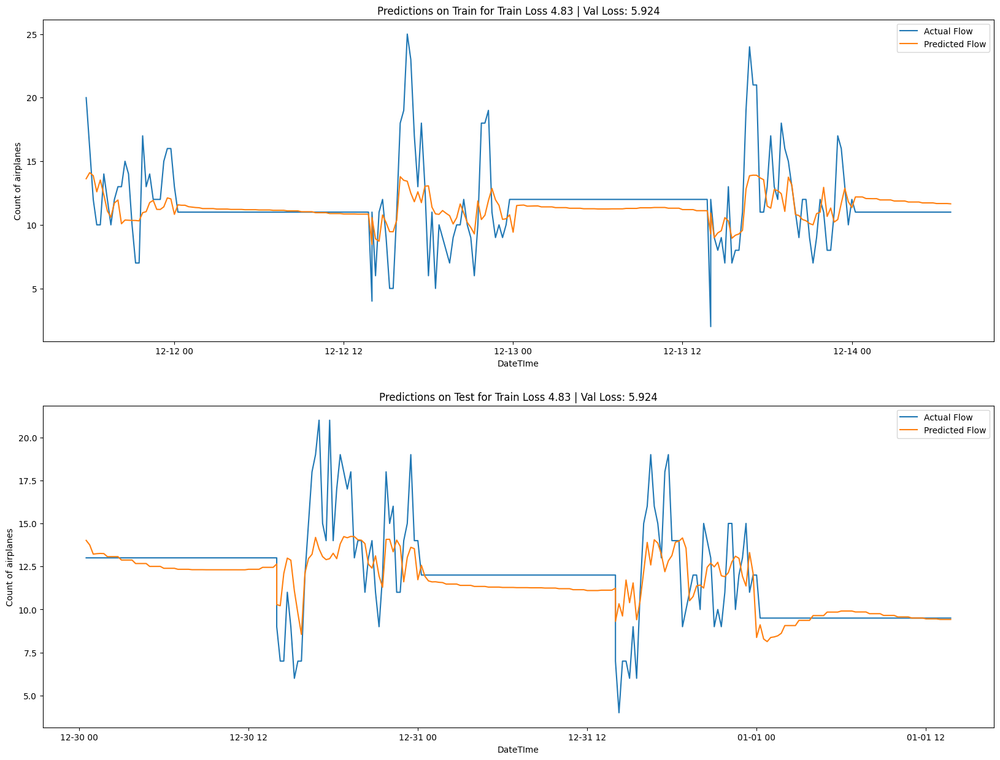


*********************************
Epoch: 62

Train Loss 4.845 | Val Loss: 5.982

**********************************
Epoch: 63

Train Loss 4.819 | Val Loss: 5.976

**********************************
Epoch: 64

Train Loss 4.805 | Val Loss: 5.933

**********************************
Epoch: 65

Train Loss 4.806 | Val Loss: 5.934

**********************************
Epoch: 66

Train Loss 4.795 | Val Loss: 6.034

**********************************
Epoch: 67

Train Loss 4.858 | Val Loss: 5.794


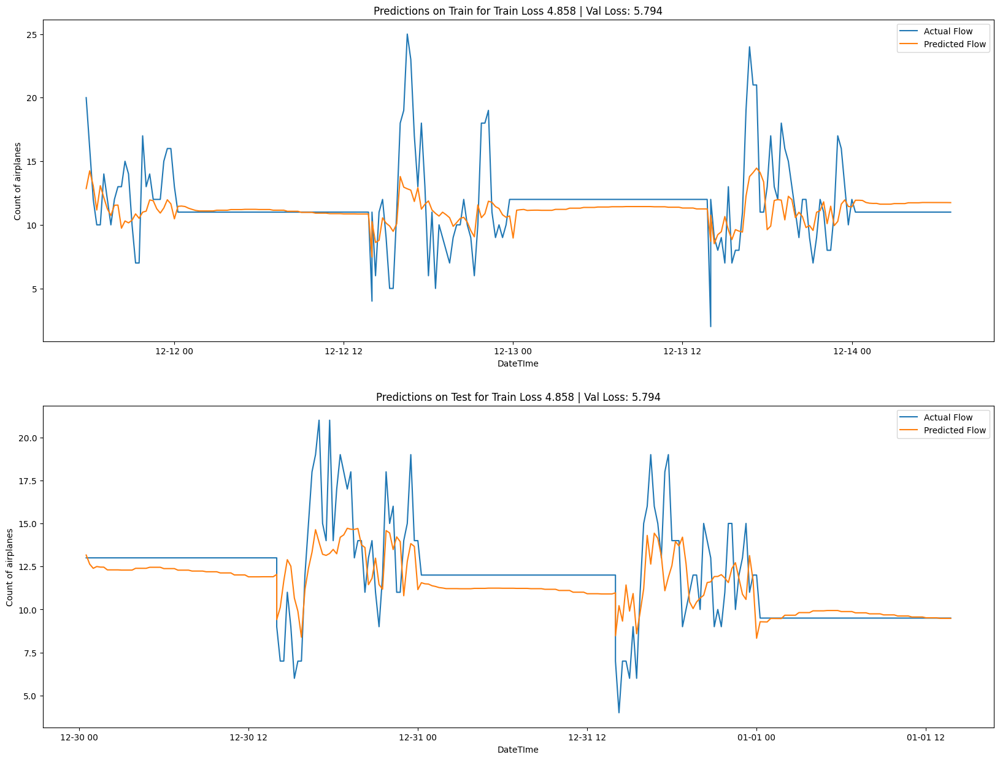


**********************************
Epoch: 68

Train Loss 4.801 | Val Loss: 5.756


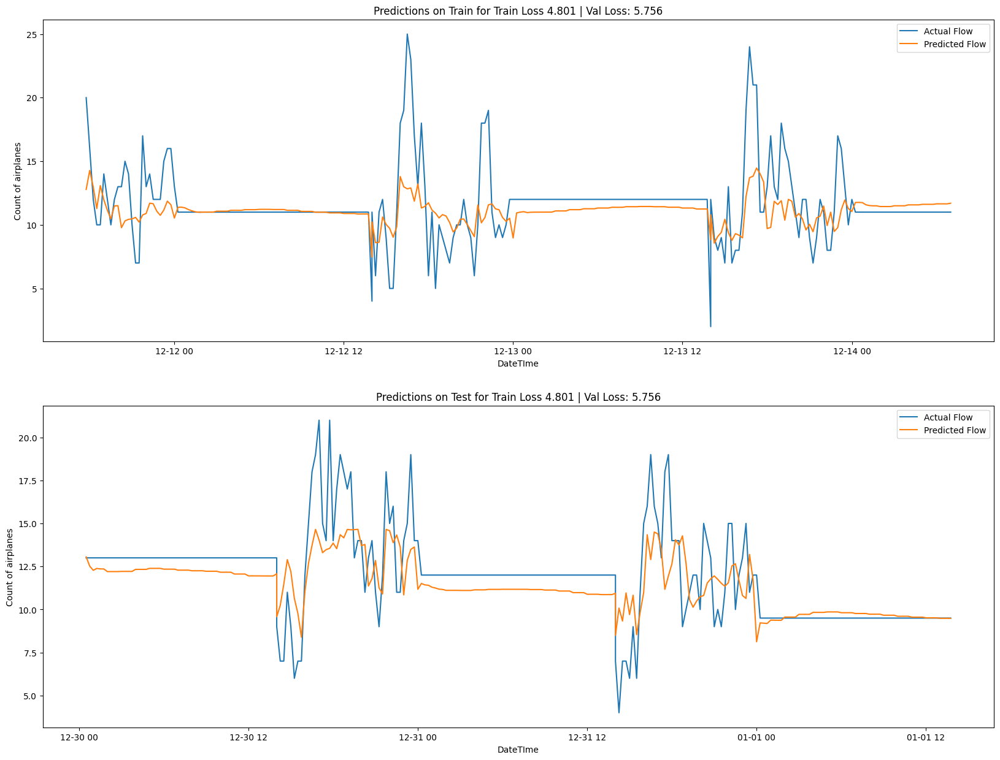


**********************************
Epoch: 69

Train Loss 4.744 | Val Loss: 5.717


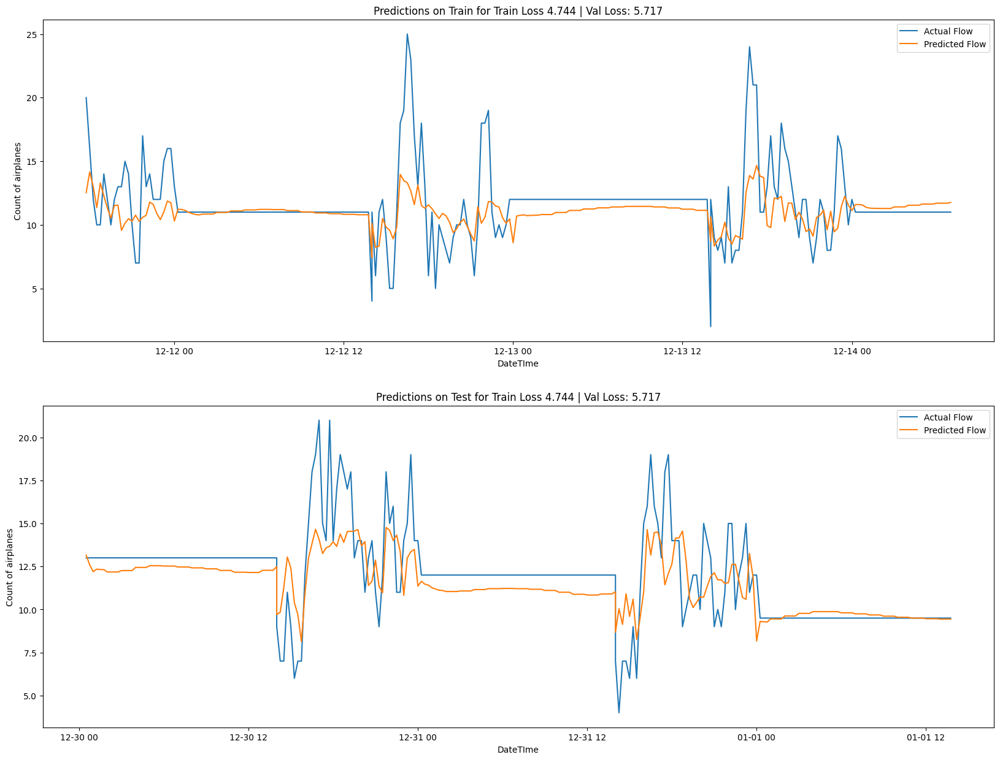


**********************************
Epoch: 70

Train Loss 4.724 | Val Loss: 5.701


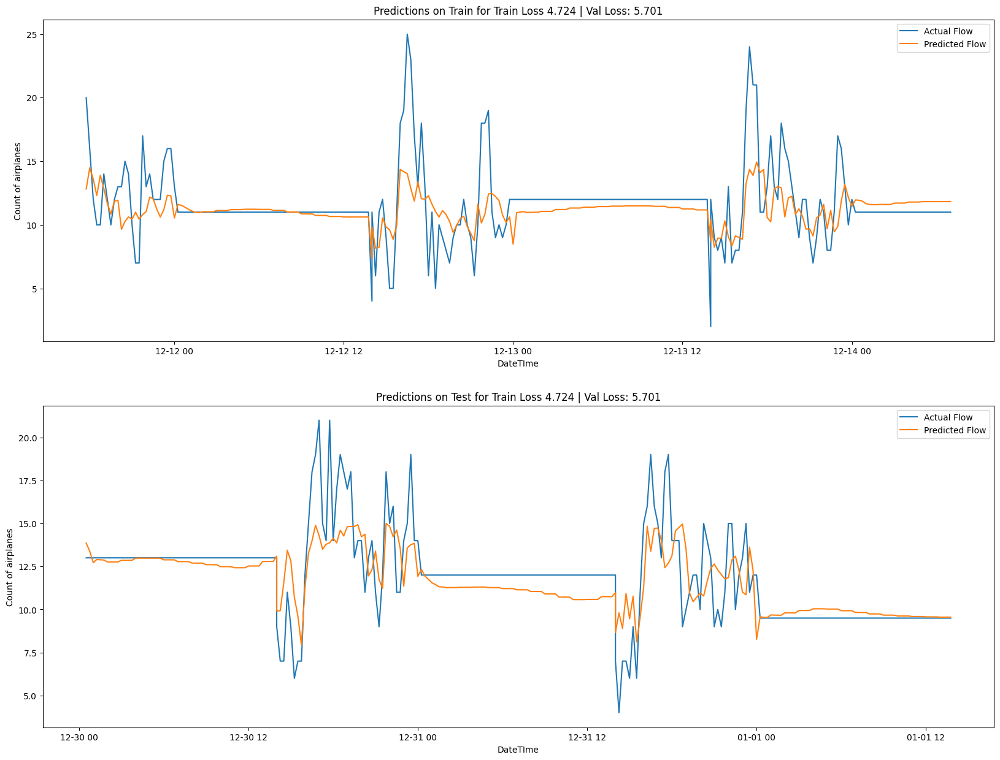


**********************************
Epoch: 71

Train Loss 4.702 | Val Loss: 5.786

**********************************
Epoch: 72

Train Loss 4.679 | Val Loss: 5.582


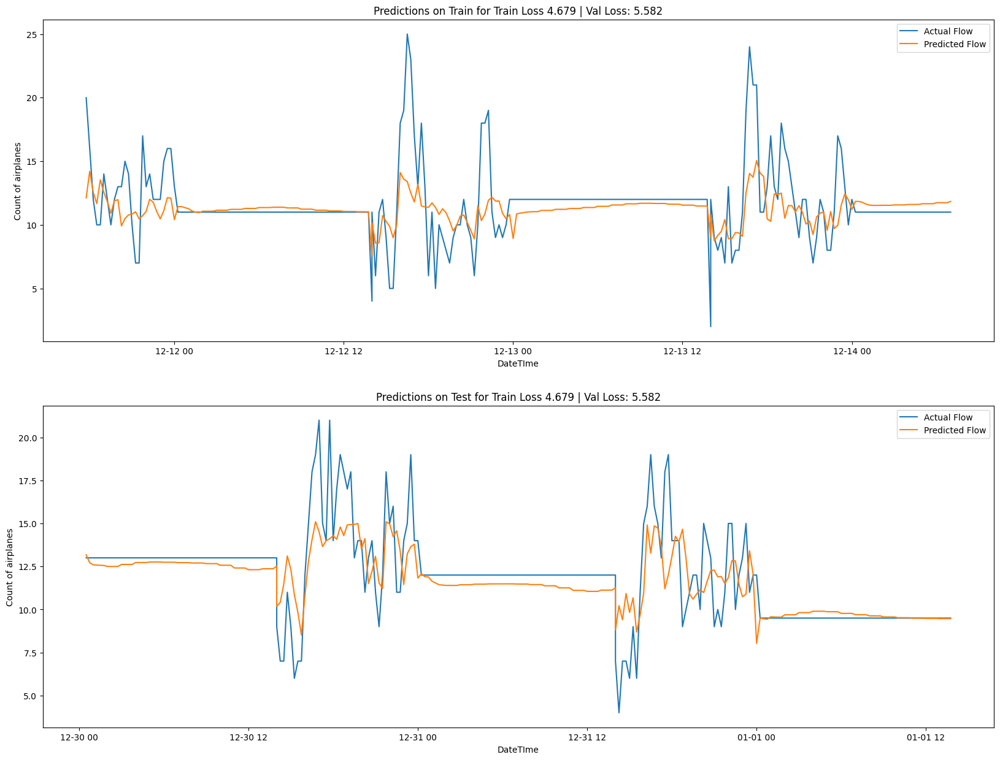


**********************************
Epoch: 73

Train Loss 4.652 | Val Loss: 5.706

**********************************
Epoch: 74

Train Loss 4.621 | Val Loss: 5.686

**********************************
Epoch: 75

Train Loss 4.594 | Val Loss: 5.976

**********************************
Epoch: 76

Train Loss 4.609 | Val Loss: 5.731

**********************************
Epoch: 77

Train Loss 4.547 | Val Loss: 5.569


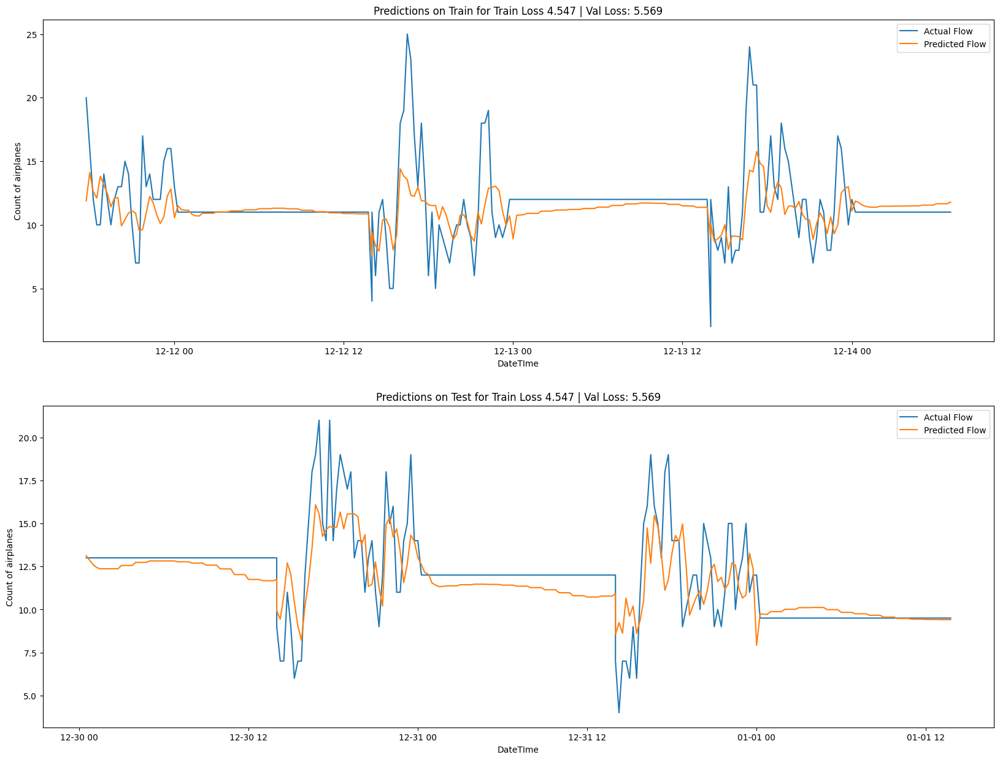


**********************************
Epoch: 78

Train Loss 4.751 | Val Loss: 5.813

**********************************
Epoch: 79

Train Loss 4.68 | Val Loss: 5.972

*********************************
Epoch: 80

Train Loss 4.629 | Val Loss: 5.703

**********************************
Epoch: 81

Train Loss 4.579 | Val Loss: 5.543


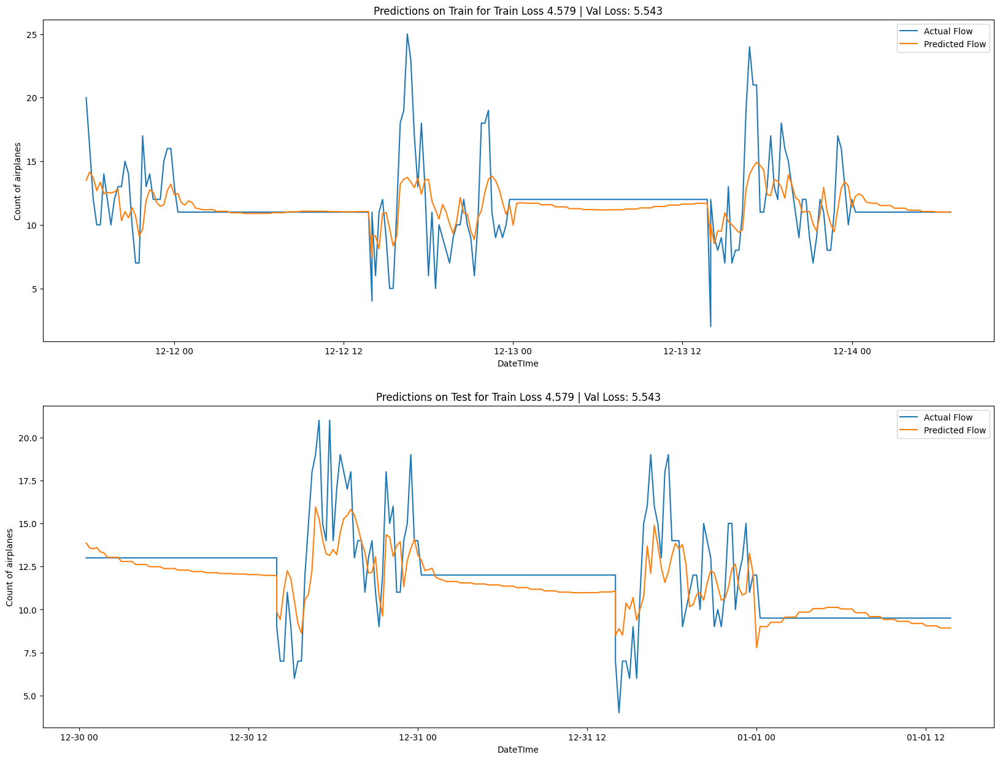


**********************************
Epoch: 82

Train Loss 4.528 | Val Loss: 5.455


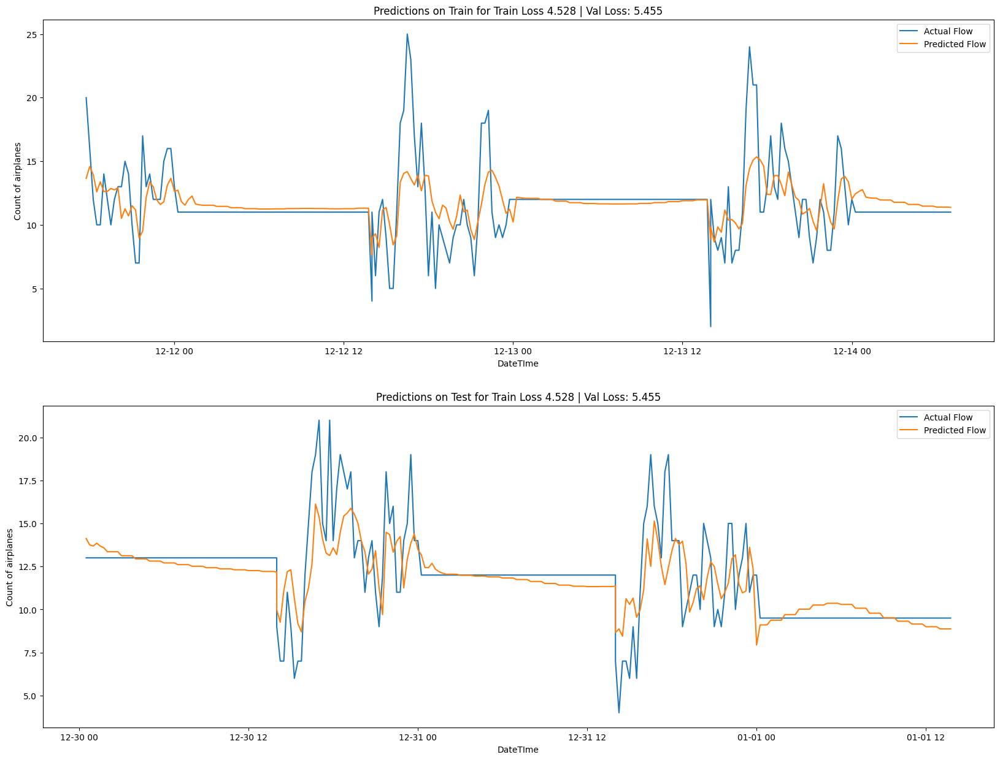


**********************************
Epoch: 83

Train Loss 4.488 | Val Loss: 5.406


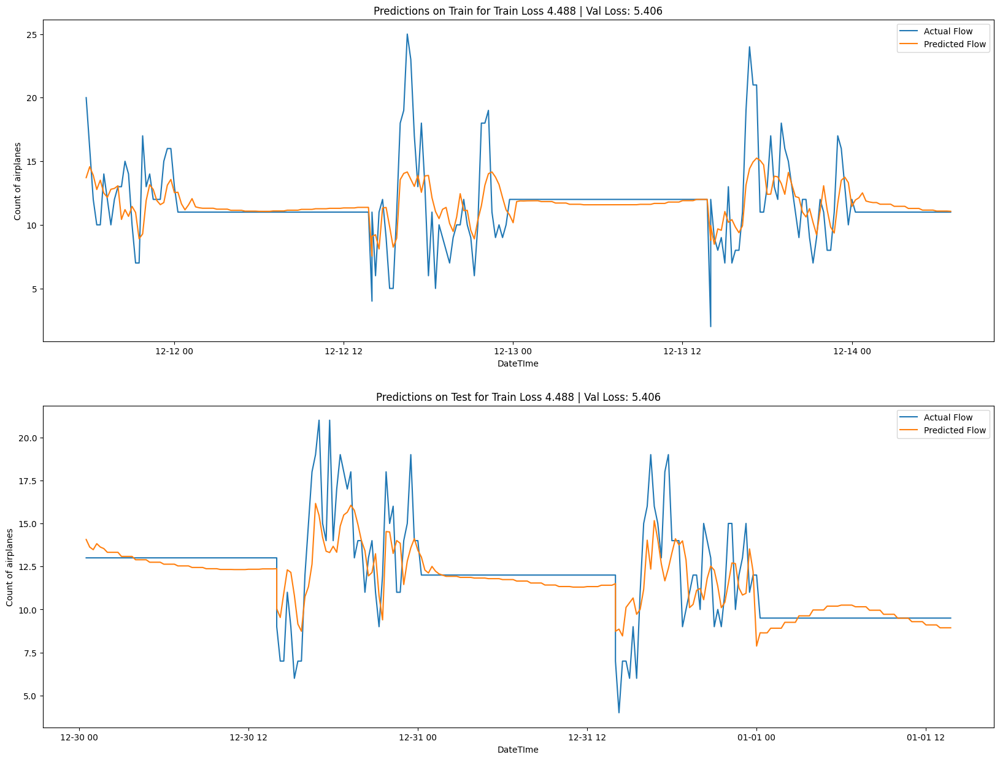


**********************************
Epoch: 84

Train Loss 4.466 | Val Loss: 5.442

**********************************
Epoch: 85

Train Loss 4.419 | Val Loss: 5.401


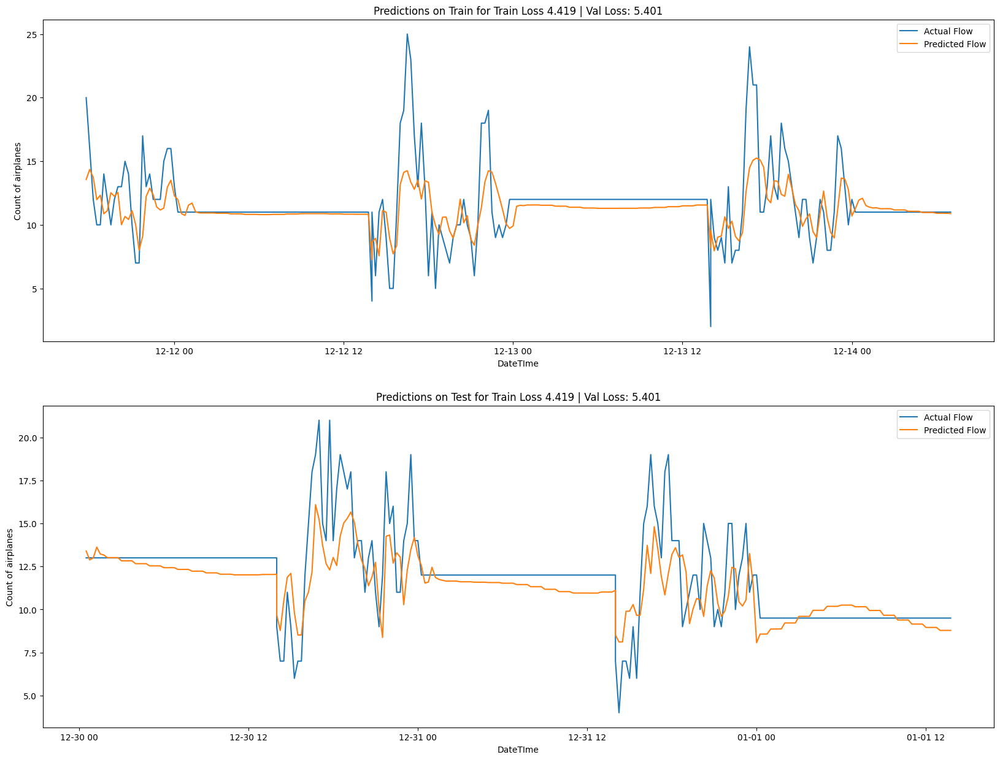


**********************************
Epoch: 86

Train Loss 4.38 | Val Loss: 5.247


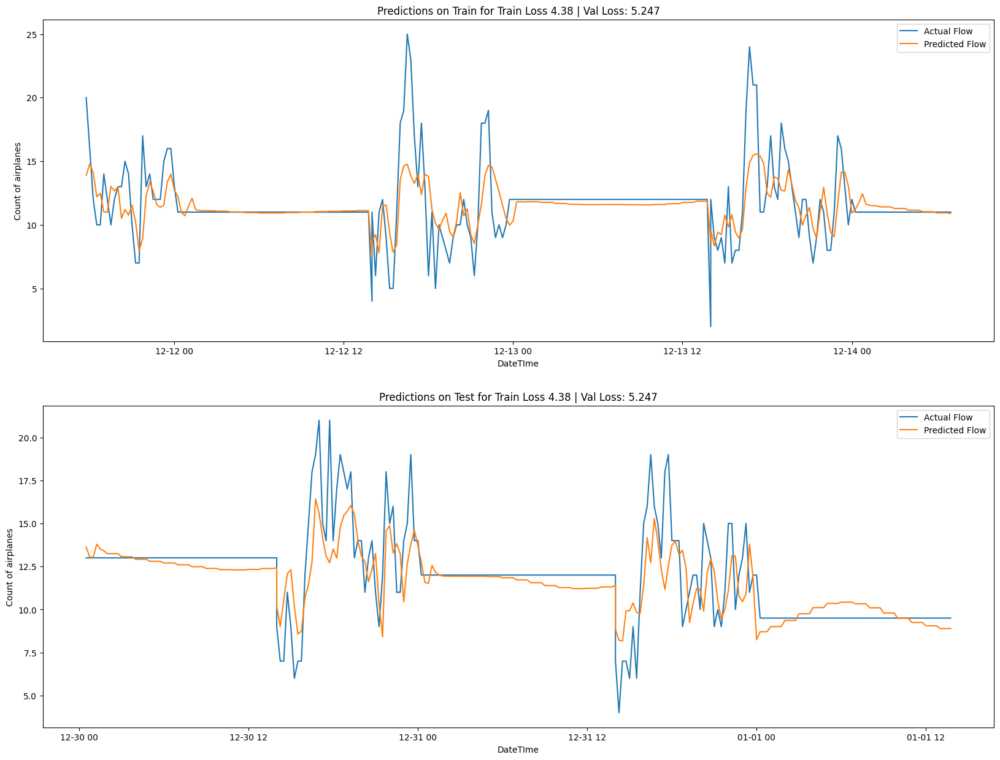


*********************************
Epoch: 87

Train Loss 4.365 | Val Loss: 5.229


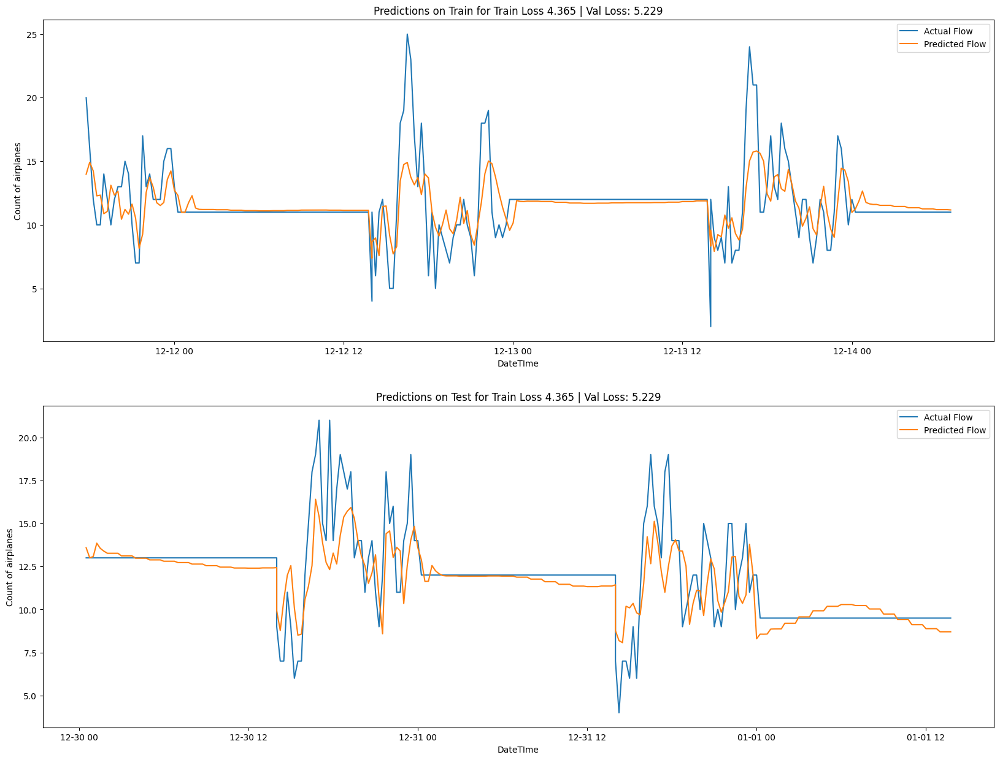


**********************************
Epoch: 88

Train Loss 4.326 | Val Loss: 5.281

**********************************
Epoch: 89

Train Loss 4.31 | Val Loss: 5.283

*********************************
Epoch: 90

Train Loss 4.29 | Val Loss: 5.288

*********************************
Epoch: 91

Train Loss 4.278 | Val Loss: 5.144


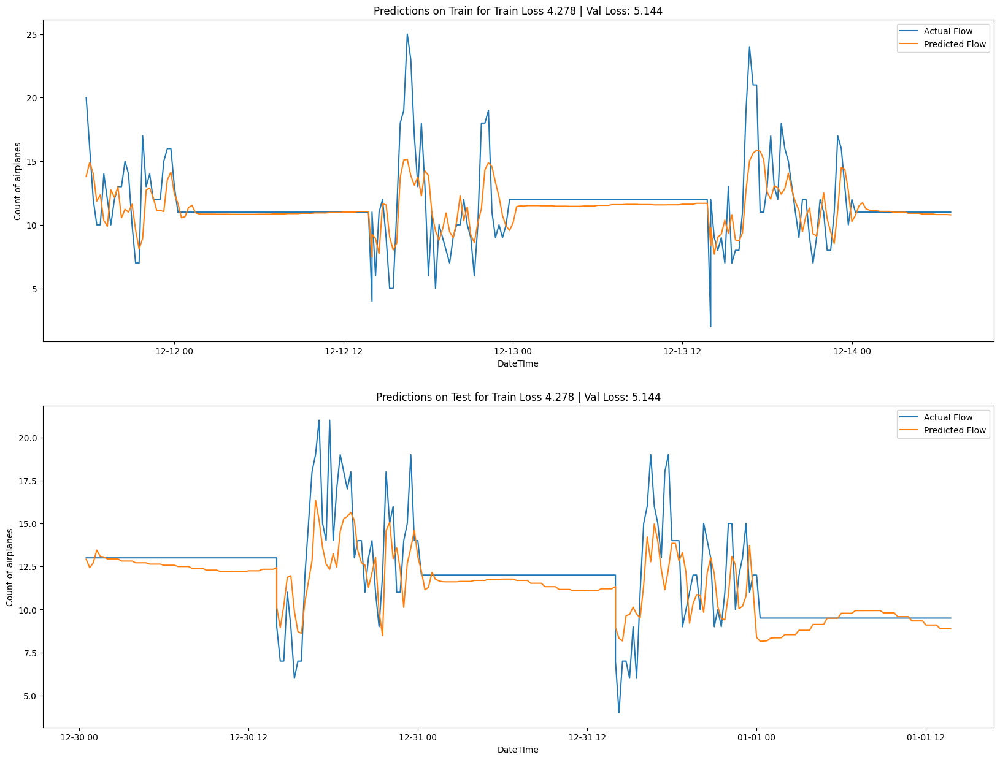


**********************************
Epoch: 92

Train Loss 4.349 | Val Loss: 5.304

**********************************
Epoch: 93

Train Loss 4.254 | Val Loss: 5.078


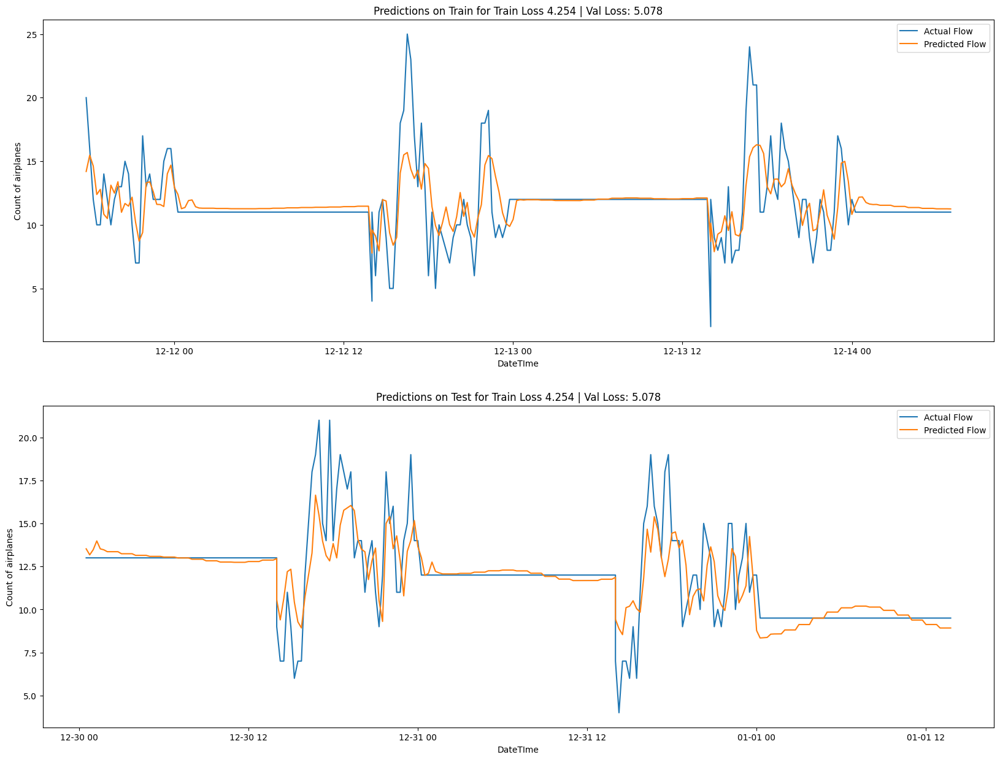


**********************************
Epoch: 94

Train Loss 4.24 | Val Loss: 5.077


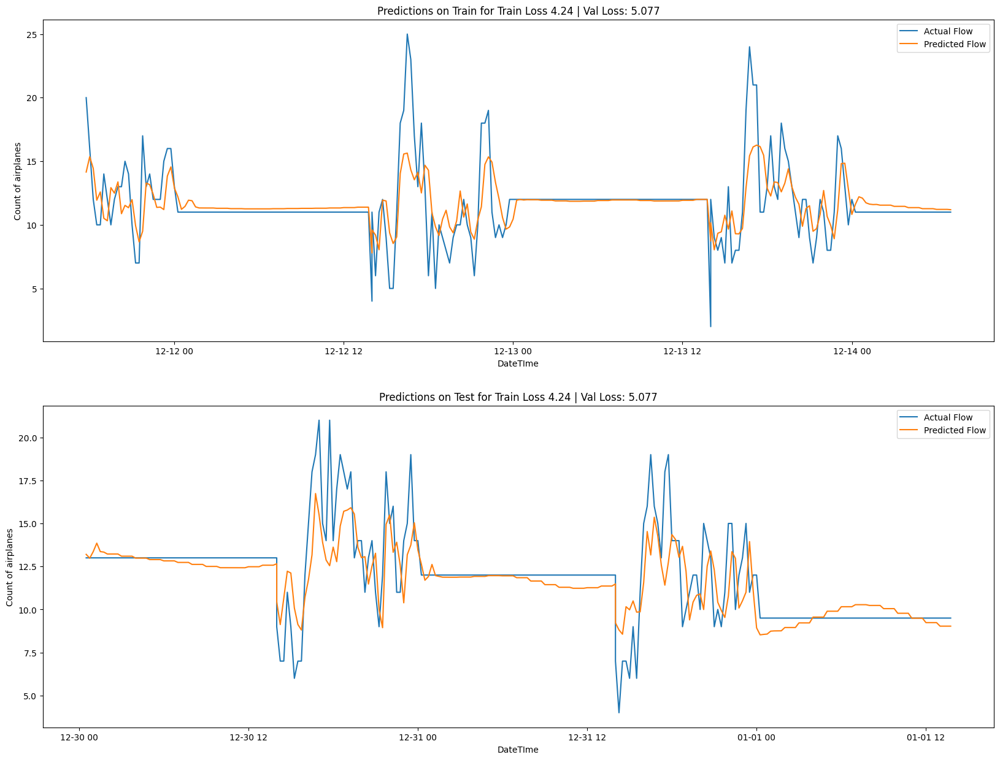


*********************************
Epoch: 95

Train Loss 4.235 | Val Loss: 5.065


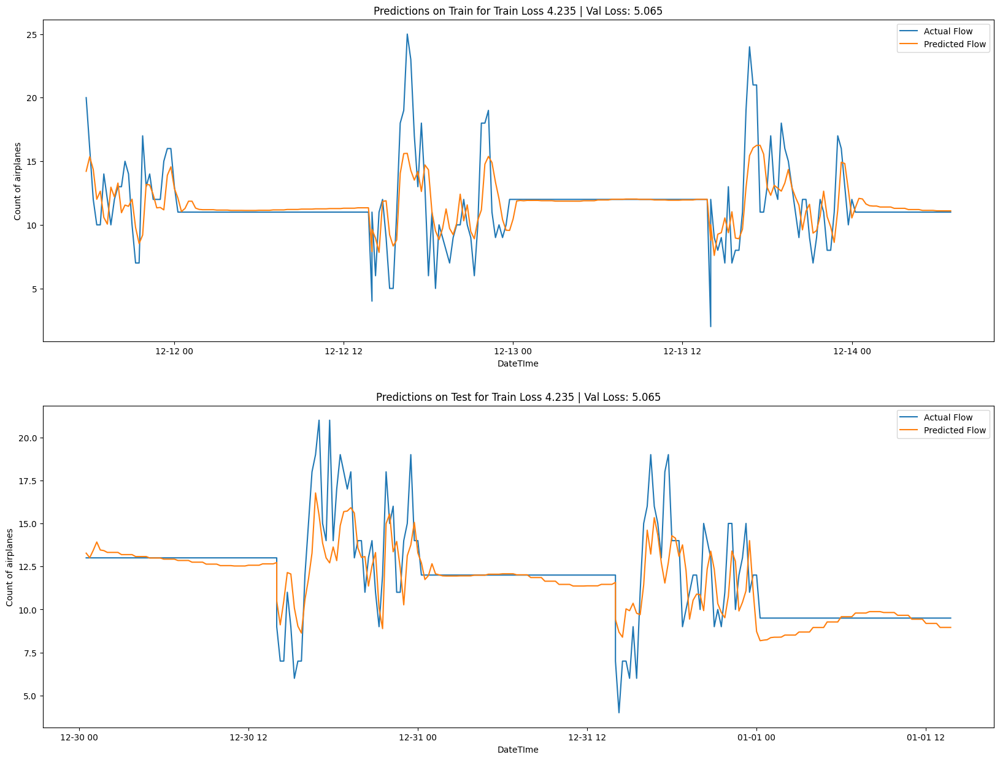


**********************************
Epoch: 96

Train Loss 4.206 | Val Loss: 5.323

**********************************
Epoch: 97

Train Loss 4.708 | Val Loss: 5.872

**********************************
Epoch: 98

Train Loss 4.653 | Val Loss: 5.543

**********************************
Epoch: 99

Train Loss 4.53 | Val Loss: 5.757

*********************************
Epoch: 100

Train Loss 4.446 | Val Loss: 5.391

**********************************
Epoch: 101

Train Loss 4.495 | Val Loss: 5.4

********************************
Epoch: 102

Train Loss 4.398 | Val Loss: 5.051


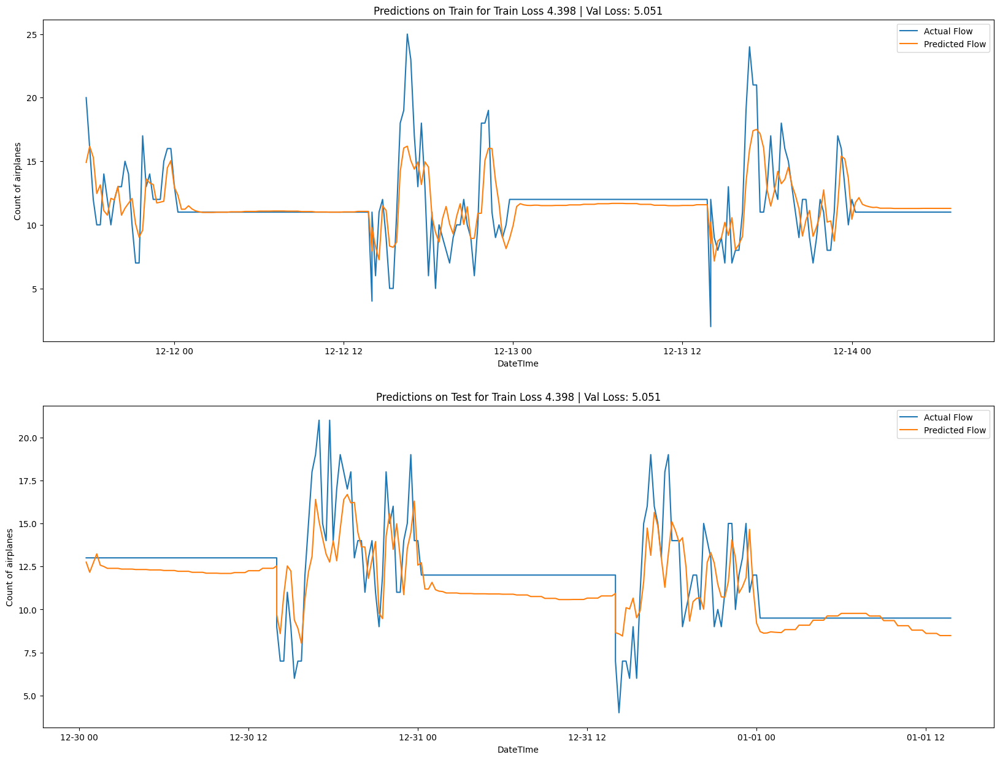


**********************************
Epoch: 103

Train Loss 4.288 | Val Loss: 5.084

**********************************
Epoch: 104

Train Loss 4.335 | Val Loss: 4.95


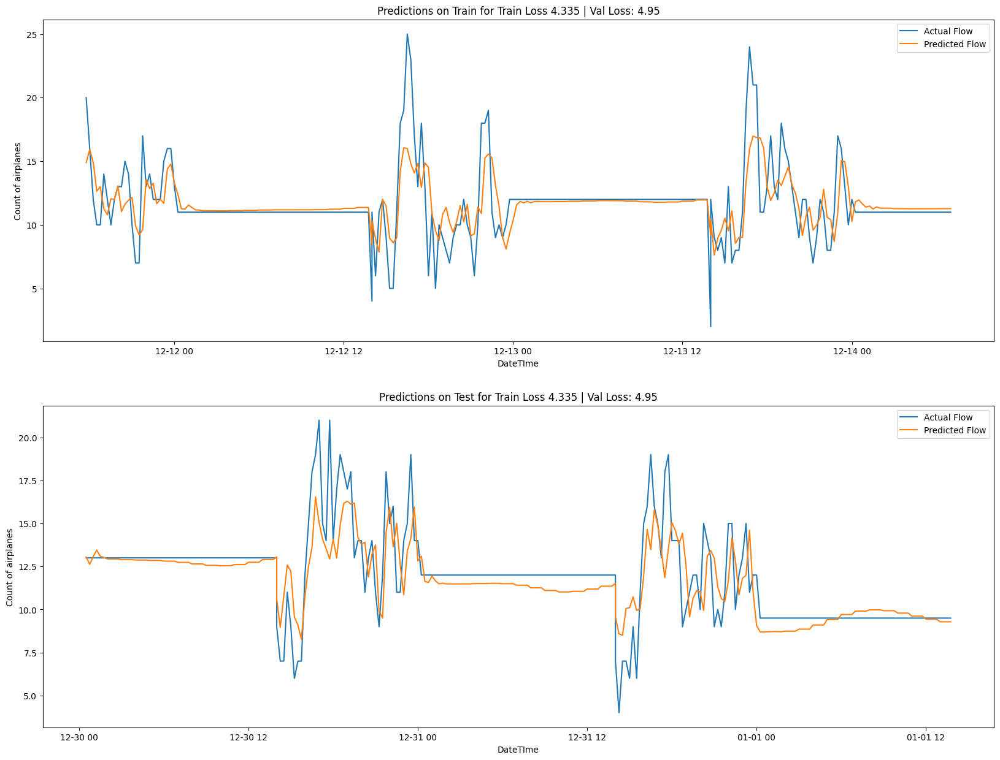


*********************************
Epoch: 105

Train Loss 4.332 | Val Loss: 5.79

*********************************
Epoch: 106

Train Loss 4.434 | Val Loss: 5.473

**********************************
Epoch: 107

Train Loss 4.371 | Val Loss: 5.534

**********************************
Epoch: 108

Train Loss 4.33 | Val Loss: 5.446

*********************************
Epoch: 109

Train Loss 4.299 | Val Loss: 5.29

*********************************
Epoch: 110

Train Loss 4.286 | Val Loss: 5.188

**********************************
Epoch: 111

Train Loss 4.261 | Val Loss: 5.315

**********************************
Epoch: 112

Train Loss 4.249 | Val Loss: 5.156

**********************************
Epoch: 113

Train Loss 4.216 | Val Loss: 5.319

**********************************
Epoch: 114

Train Loss 4.201 | Val Loss: 5.055

**********************************
Epoch: 115

Train Loss 4.197 | Val Loss: 5.108

**********************************
Epoch: 116

Train Loss 4.165 | Val Loss: 5.256

**********

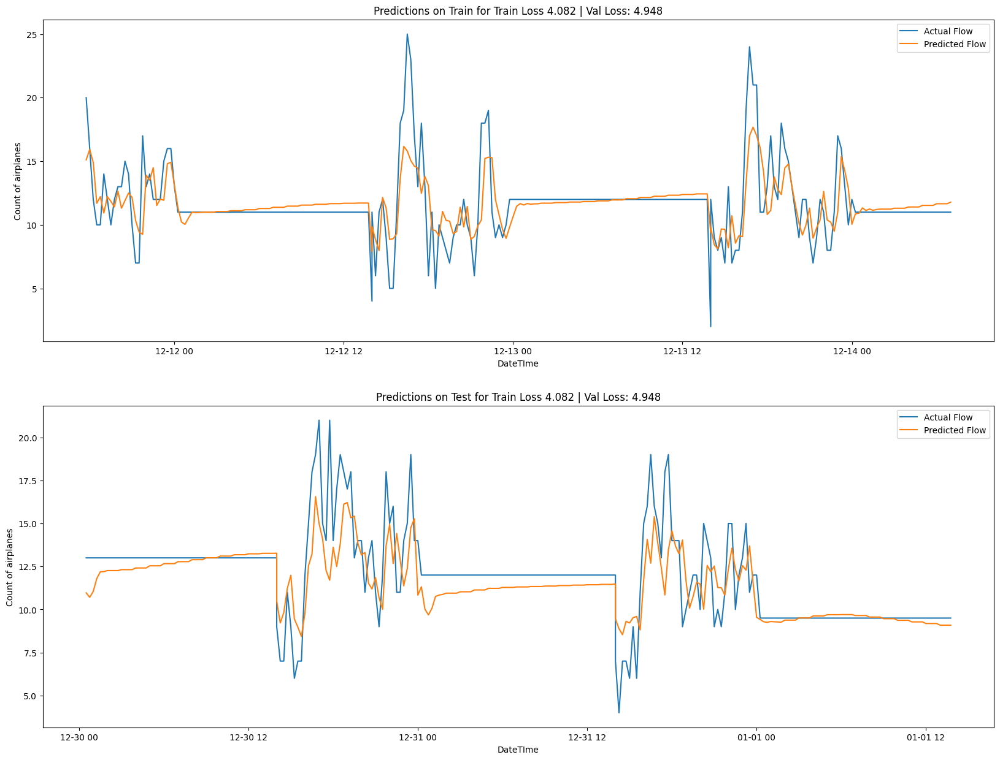


**********************************
Epoch: 124

Train Loss 4.091 | Val Loss: 4.92


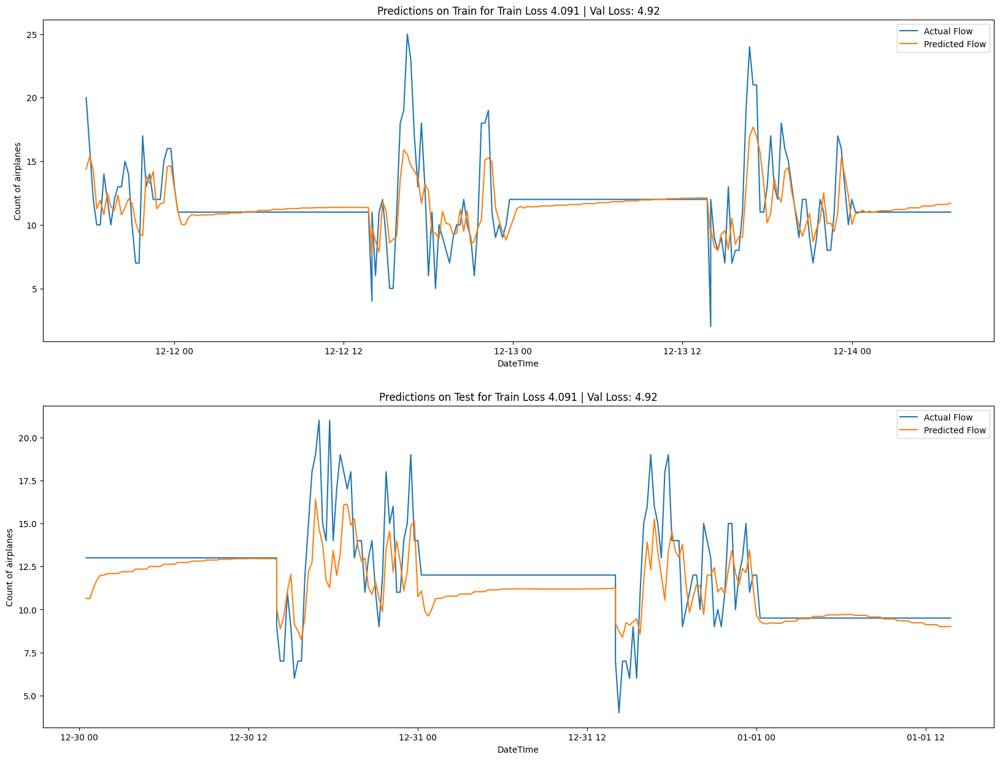


*********************************
Epoch: 125

Train Loss 4.085 | Val Loss: 5.475

**********************************
Epoch: 126

Train Loss 4.058 | Val Loss: 5.044

**********************************
Epoch: 127

Train Loss 4.062 | Val Loss: 5.144

**********************************
Epoch: 128

Train Loss 4.041 | Val Loss: 4.921

**********************************
Epoch: 129

Train Loss 4.022 | Val Loss: 5.179

**********************************
Epoch: 130

Train Loss 4.033 | Val Loss: 4.858


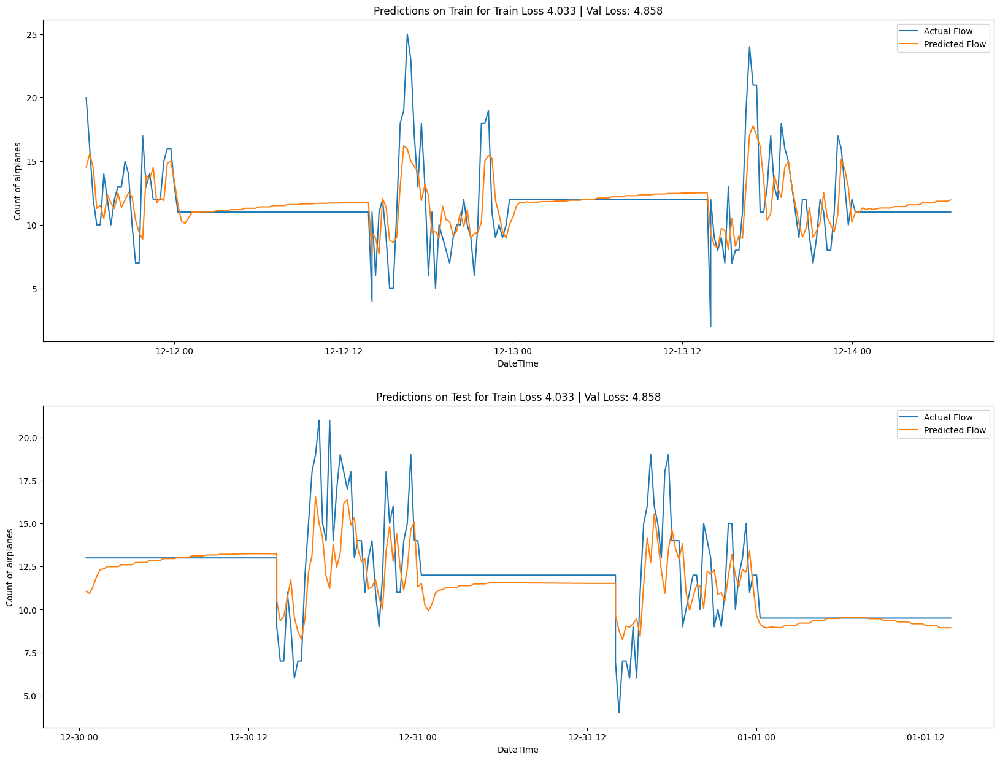


**********************************
Epoch: 131

Train Loss 4.018 | Val Loss: 4.967

**********************************
Epoch: 132

Train Loss 4.018 | Val Loss: 4.891

**********************************
Epoch: 133

Train Loss 4.017 | Val Loss: 5.147

**********************************
Epoch: 134

Train Loss 4.009 | Val Loss: 4.923

**********************************
Epoch: 135

Train Loss 3.99 | Val Loss: 4.913

*********************************
Epoch: 136

Train Loss 3.995 | Val Loss: 5.03

*********************************
Epoch: 137

Train Loss 3.979 | Val Loss: 4.87

*********************************
Epoch: 138

Train Loss 3.983 | Val Loss: 5.004

**********************************
Epoch: 139

Train Loss 3.981 | Val Loss: 5.11

*********************************
Epoch: 140

Train Loss 3.962 | Val Loss: 4.964

**********************************
Epoch: 141

Train Loss 3.989 | Val Loss: 4.961

**********************************
Epoch: 142

Train Loss 3.957 | Val Loss: 4.974

***********

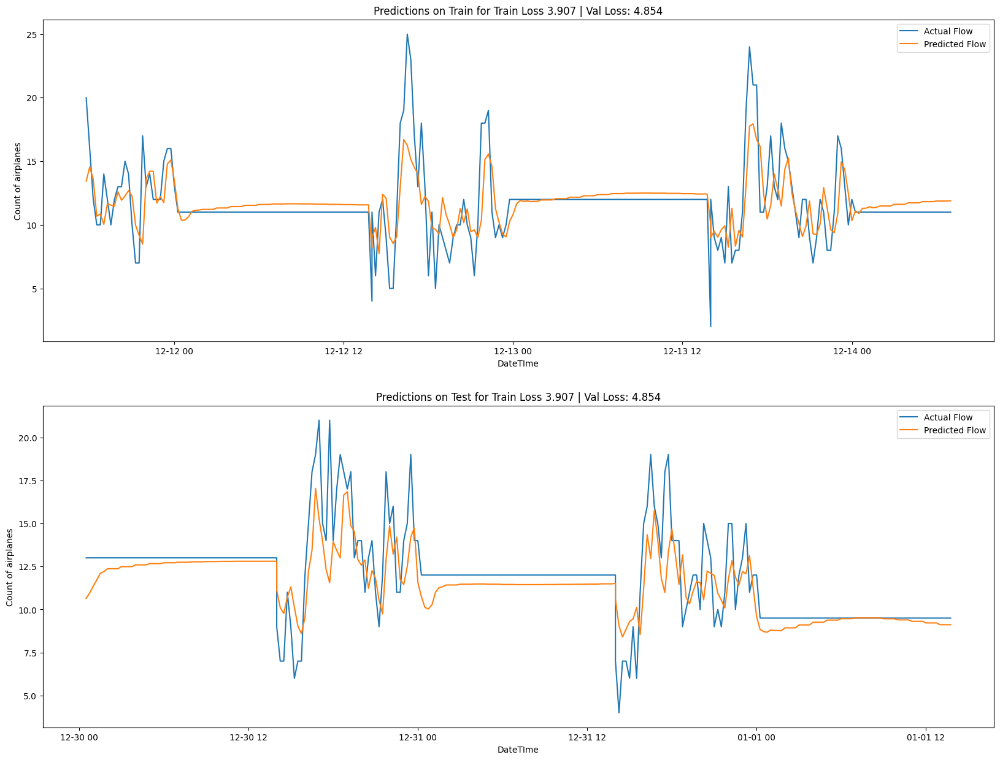


**********************************
Epoch: 155

Train Loss 3.918 | Val Loss: 5.39

*********************************
Epoch: 156

Train Loss 3.905 | Val Loss: 4.89

*********************************
Epoch: 157

Train Loss 3.898 | Val Loss: 4.845


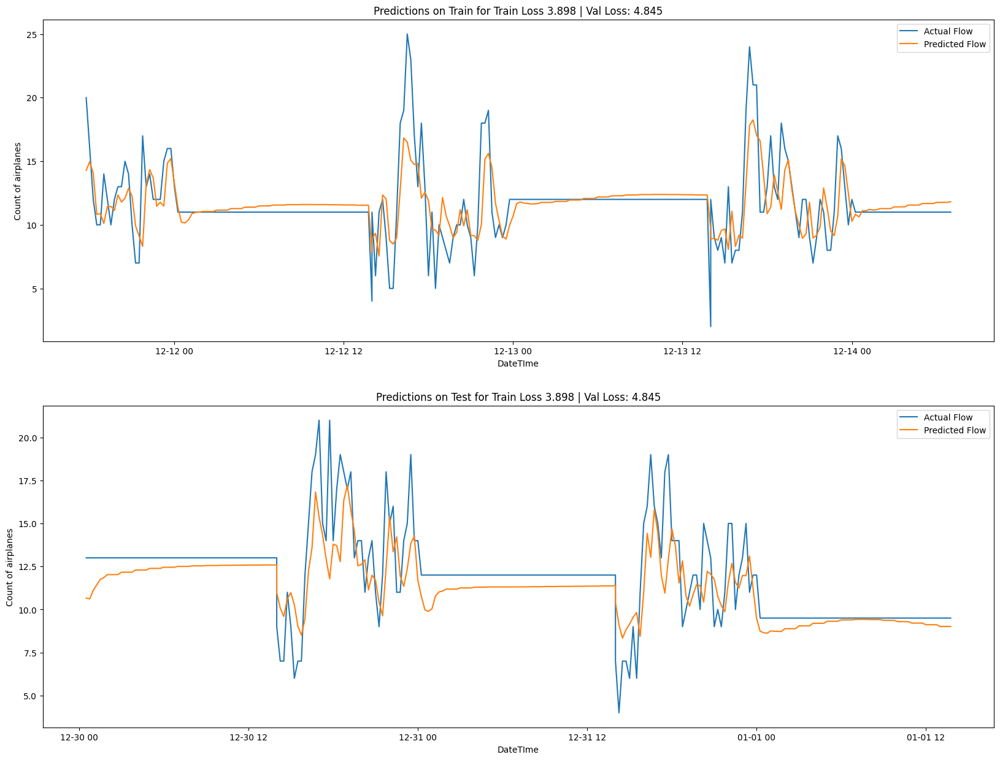


**********************************
Epoch: 158

Train Loss 3.899 | Val Loss: 4.964

**********************************
Epoch: 159

Train Loss 3.907 | Val Loss: 4.932

**********************************
Epoch: 160

Train Loss 3.894 | Val Loss: 4.882

**********************************
Epoch: 161

Train Loss 3.893 | Val Loss: 4.95

*********************************
Epoch: 162

Train Loss 3.875 | Val Loss: 5.048

**********************************
Epoch: 163

Train Loss 3.904 | Val Loss: 5.367

**********************************
Epoch: 164

Train Loss 3.893 | Val Loss: 4.903

**********************************
Epoch: 165

Train Loss 3.869 | Val Loss: 4.899

**********************************
Epoch: 166

Train Loss 3.877 | Val Loss: 4.905

**********************************
Epoch: 167

Train Loss 3.877 | Val Loss: 4.939

**********************************
Epoch: 168

Train Loss 3.866 | Val Loss: 5.343

**********************************
Epoch: 169

Train Loss 3.867 | Val Loss: 5.024

*****

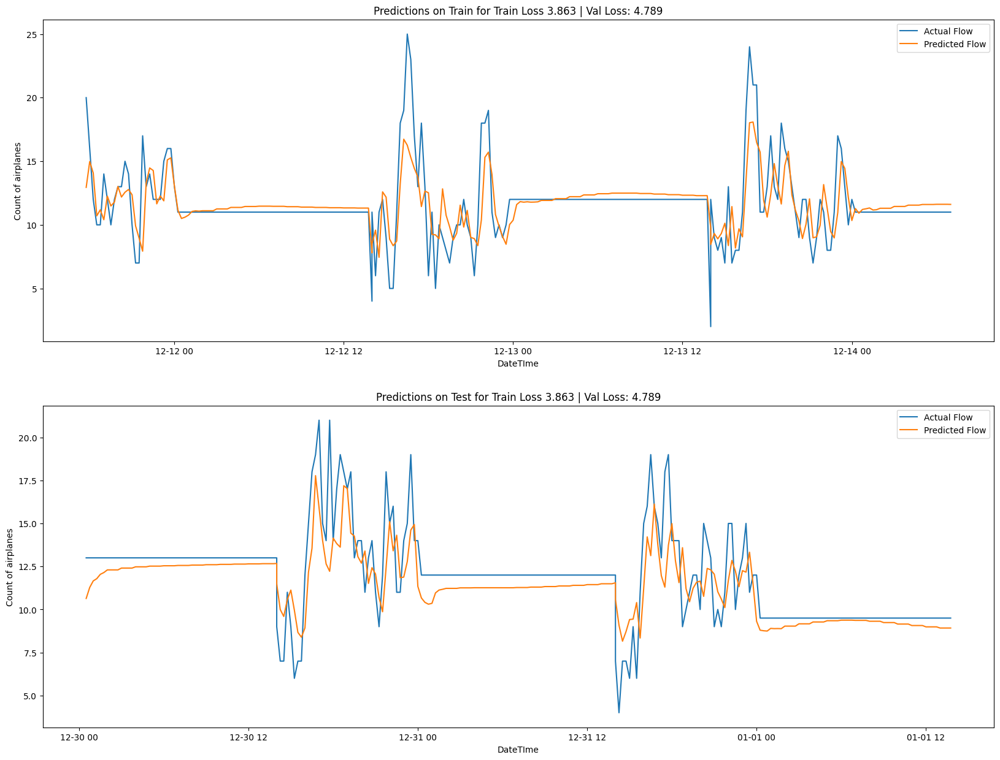


**********************************
Epoch: 185

Train Loss 3.862 | Val Loss: 4.954

**********************************
Epoch: 186

Train Loss 3.852 | Val Loss: 5.058

**********************************
Epoch: 187

Train Loss 3.843 | Val Loss: 5.167

**********************************
Epoch: 188

Train Loss 3.85 | Val Loss: 5.644

*********************************
Epoch: 189

Train Loss 3.841 | Val Loss: 5.03

*********************************
Epoch: 190

Train Loss 3.844 | Val Loss: 5.537

**********************************
Epoch: 191

Train Loss 3.851 | Val Loss: 4.961

**********************************
Epoch: 192

Train Loss 3.847 | Val Loss: 5.059

**********************************
Epoch: 193

Train Loss 3.841 | Val Loss: 5.602

**********************************
Epoch: 194

Train Loss 3.841 | Val Loss: 4.963

**********************************
Epoch: 195

Train Loss 3.835 | Val Loss: 4.779


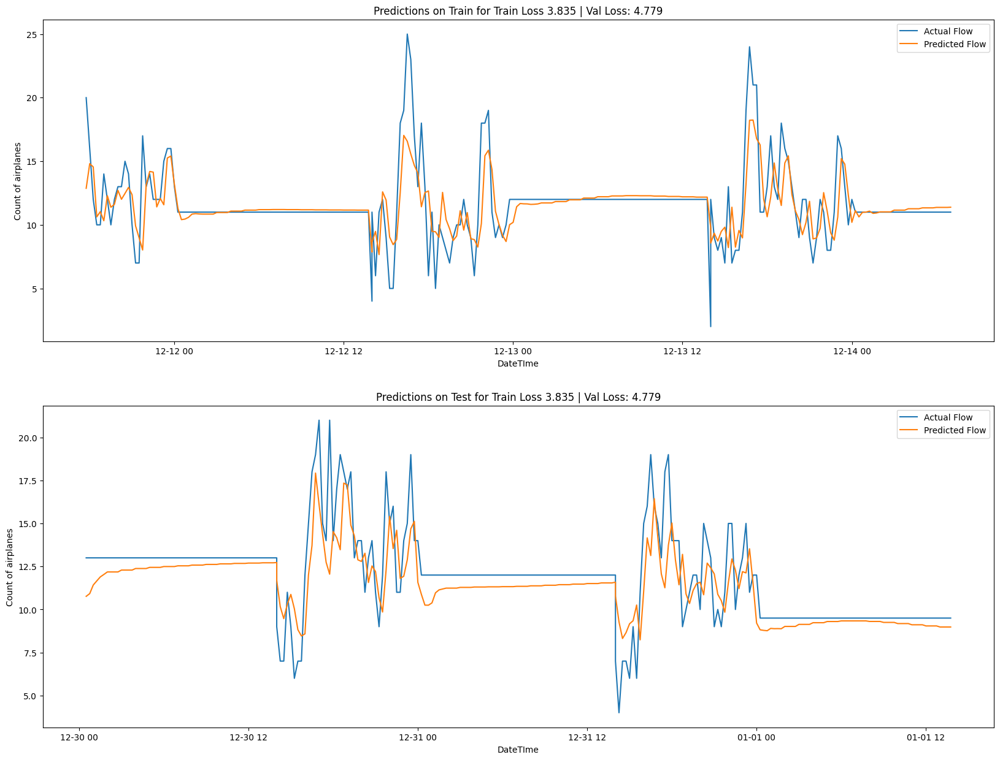


**********************************
Epoch: 196

Train Loss 3.846 | Val Loss: 4.892

**********************************
Epoch: 197

Train Loss 3.848 | Val Loss: 5.06

*********************************
Epoch: 198

Train Loss 3.845 | Val Loss: 5.157

**********************************
Epoch: 199

Train Loss 3.856 | Val Loss: 4.939

**********************************
Epoch: 200

Train Loss 3.851 | Val Loss: 4.903

**********************************
Epoch: 201

Train Loss 3.801 | Val Loss: 5.393

**********************************
Epoch: 202

Train Loss 3.788 | Val Loss: 5.741

**********************************
Epoch: 203

Train Loss 3.793 | Val Loss: 4.916

**********************************
Epoch: 204

Train Loss 3.787 | Val Loss: 4.946

**********************************
Epoch: 205

Train Loss 3.795 | Val Loss: 5.23

*********************************
Epoch: 206

Train Loss 3.79 | Val Loss: 5.413

*********************************
Epoch: 207

Train Loss 3.795 | Val Loss: 5.031

*********

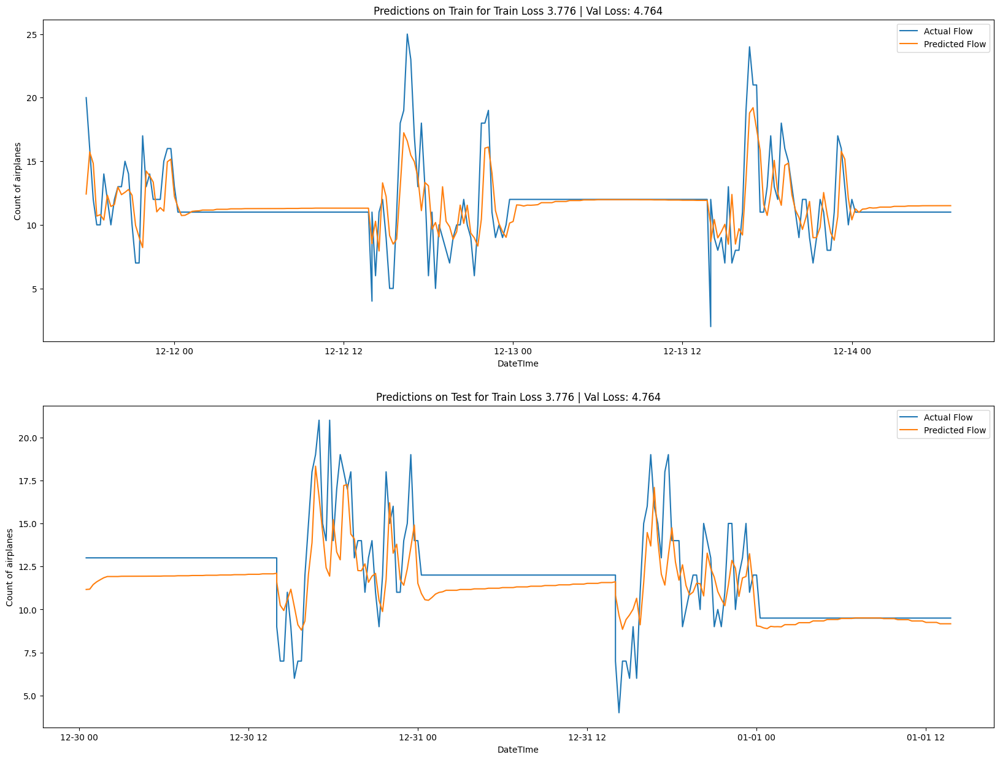


**********************************
Epoch: 292

Train Loss 3.744 | Val Loss: 4.74


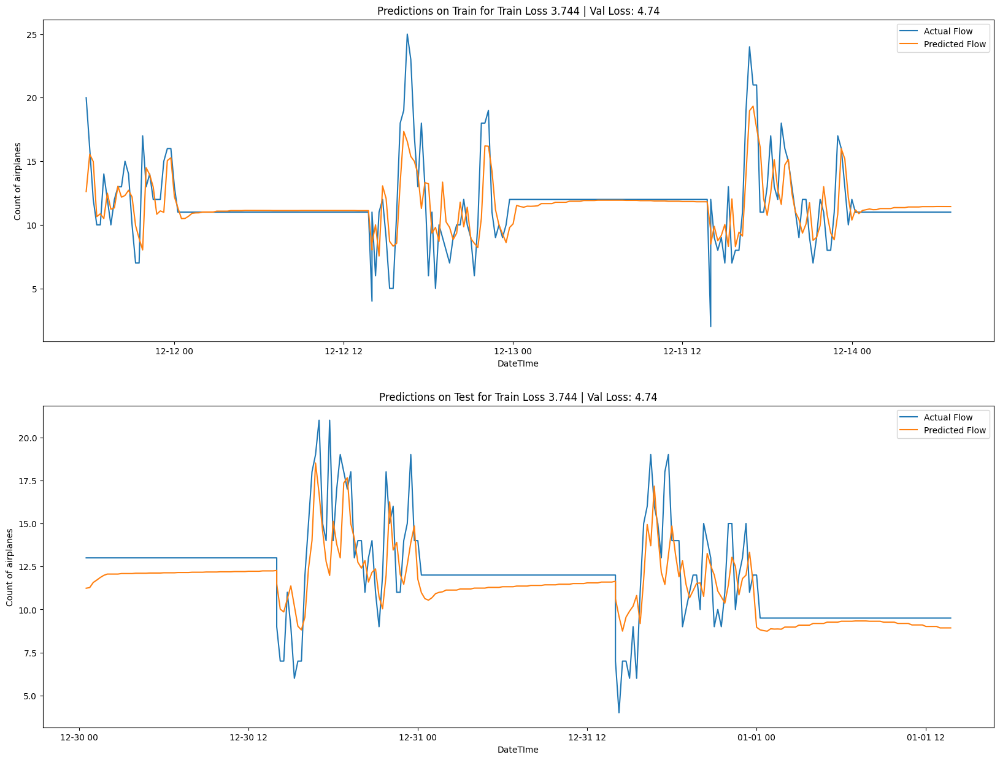


*********************************
Epoch: 293

Train Loss 3.758 | Val Loss: 4.991

**********************************
Epoch: 294

Train Loss 3.753 | Val Loss: 4.935

**********************************
Epoch: 295

Train Loss 3.761 | Val Loss: 5.087

**********************************
Epoch: 296

Train Loss 3.752 | Val Loss: 4.924

**********************************
Epoch: 297

Train Loss 3.753 | Val Loss: 4.81

*********************************
Epoch: 298

Train Loss 3.75 | Val Loss: 5.092

*********************************
Epoch: 299

Train Loss 3.754 | Val Loss: 4.831

**********************************
Epoch: 300

Train Loss 3.761 | Val Loss: 5.021

**********************************
Epoch: 301

Train Loss 3.76 | Val Loss: 5.016

*********************************
Epoch: 302

Train Loss 3.757 | Val Loss: 4.808

**********************************
Epoch: 303

Train Loss 3.749 | Val Loss: 5.077

**********************************
Epoch: 304

Train Loss 3.758 | Val Loss: 5.2

************

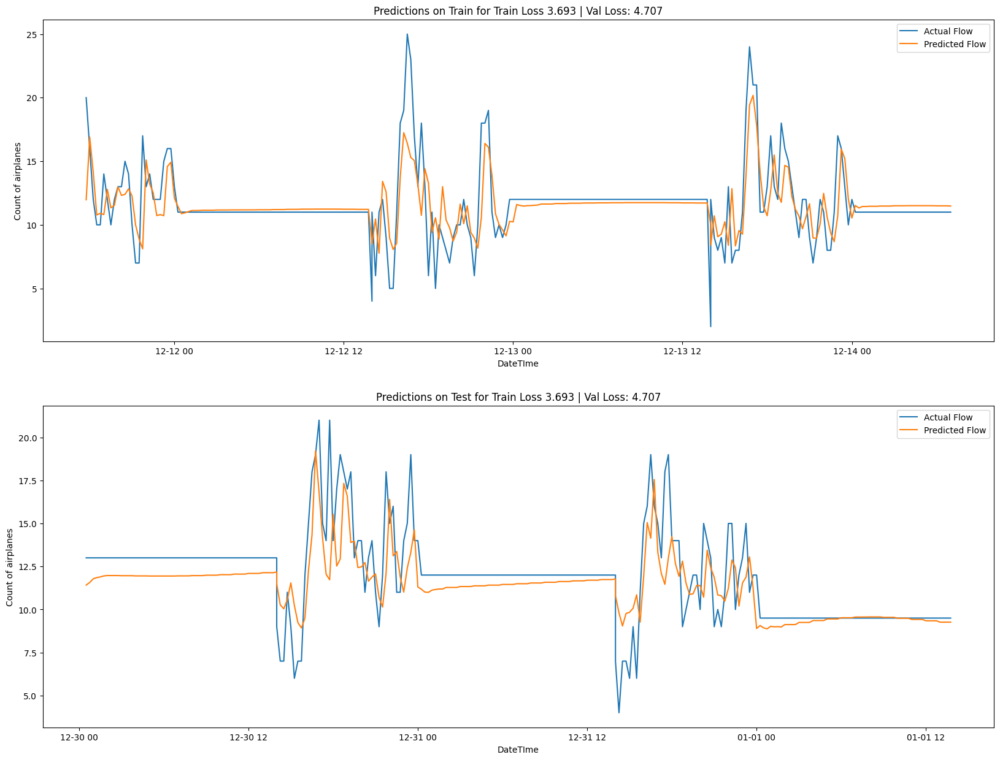


**********************************
Epoch: 452

Train Loss 3.692 | Val Loss: 4.936

**********************************
Epoch: 453

Train Loss 3.692 | Val Loss: 5.799

**********************************
Epoch: 454

Train Loss 3.696 | Val Loss: 4.924

**********************************
Epoch: 455

Train Loss 3.69 | Val Loss: 4.901

*********************************
Epoch: 456

Train Loss 3.694 | Val Loss: 4.853

**********************************
Epoch: 457

Train Loss 3.694 | Val Loss: 4.785

**********************************
Epoch: 458

Train Loss 3.696 | Val Loss: 4.712

**********************************
Epoch: 459

Train Loss 3.687 | Val Loss: 4.745

**********************************
Epoch: 460

Train Loss 3.689 | Val Loss: 4.81

*********************************
Epoch: 461

Train Loss 3.689 | Val Loss: 4.784

**********************************
Epoch: 462

Train Loss 3.692 | Val Loss: 4.918

**********************************
Epoch: 463

Train Loss 3.684 | Val Loss: 4.743

*******

In [25]:
model = LSTM(1, 4, 1)
model.to(device)
best_model = model
display(model)

loss_function = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
scheduler = StepLR(optimizer, step_size=200, gamma=0.5)
# scheduler = CosineAnnealingLR(optimizer, T_max=num_epochs)

datapoints = [250, 2500, 10000]
start = -(datapoints[0] - 1)
end = -1

min_loss = inf

# for epoch in range(num_epochs):
#     train_loss = round(train_one_epoch(),3)
#     val_loss = round(validate_one_epoch(),3)
    
#     title = f'Train Loss {train_loss} | Val Loss: {val_loss}'
#     print(title)
    
    
#     if val_loss < min_loss:
#         min_loss = val_loss
#         best_model = model
        
#         plot_datapoints(start,end,title, model)
#     print('\n'+'*'*len(title))

# Usage example
loss_history,best_lstm = train_and_evaluate(model,num_epochs,start,end)  # Example values for arguments
print("Loss history:", loss_history)

Se analizan las predicciones en el set de entrenamiento y de prueba para el mejor modelo obtenido

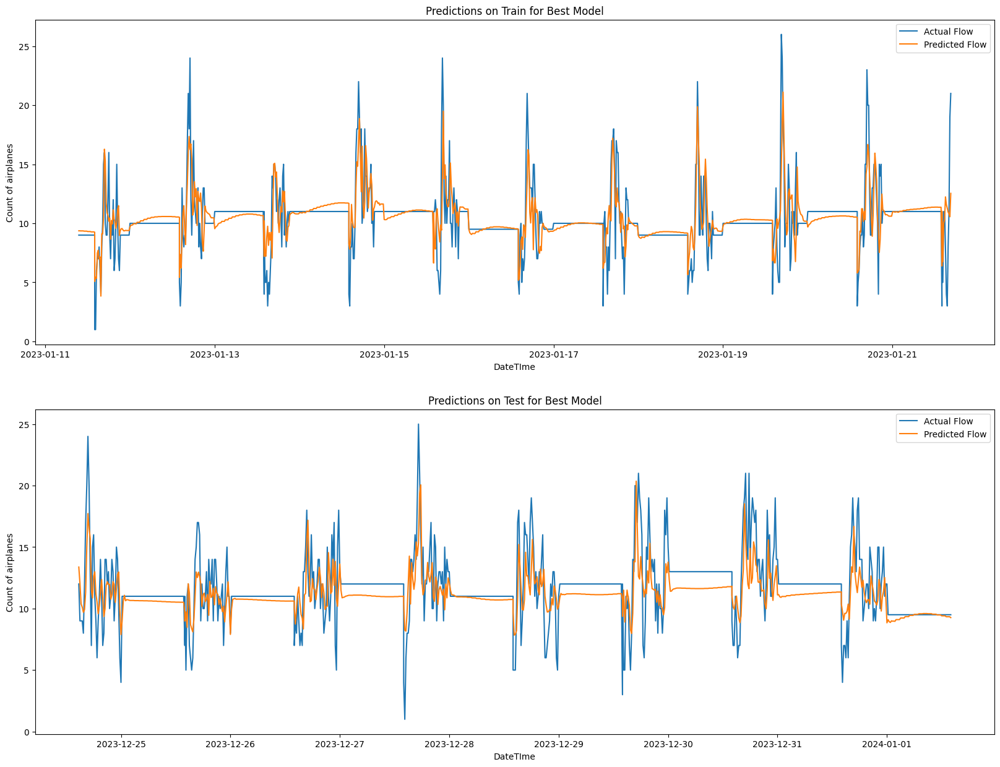

In [ ]:
plot_datapoints(1000,2000,"Best Model", best_model)


Train Loss 43.487 | Val Loss: 22.035


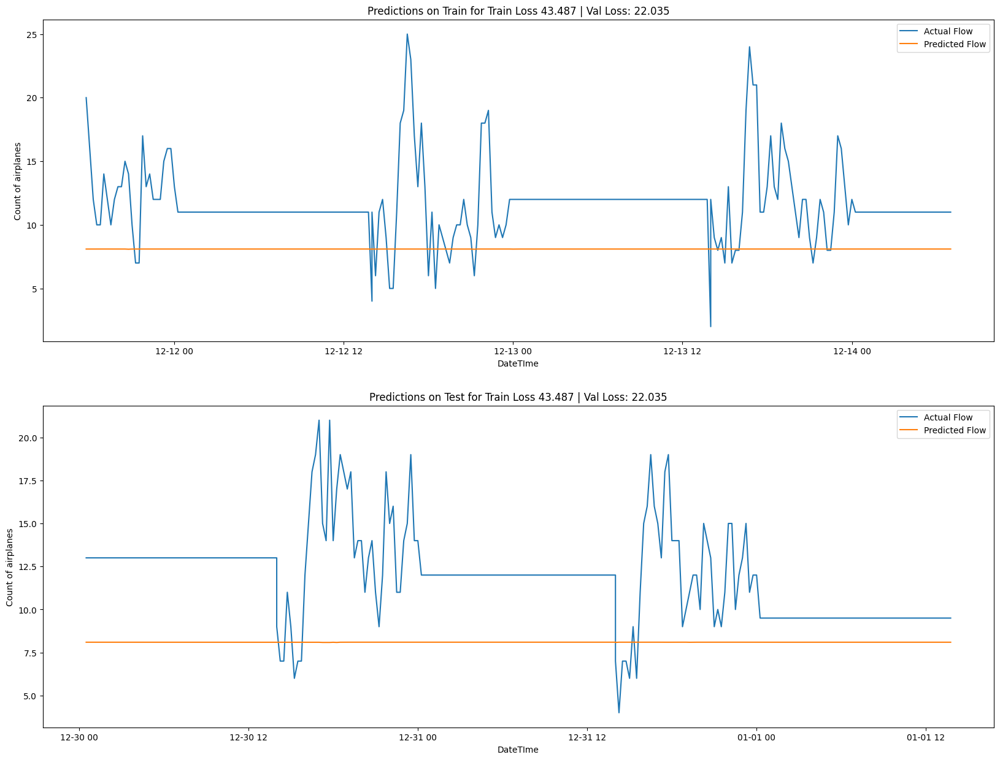


************************************
Epoch: 2

Train Loss 7.111 | Val Loss: 10.957


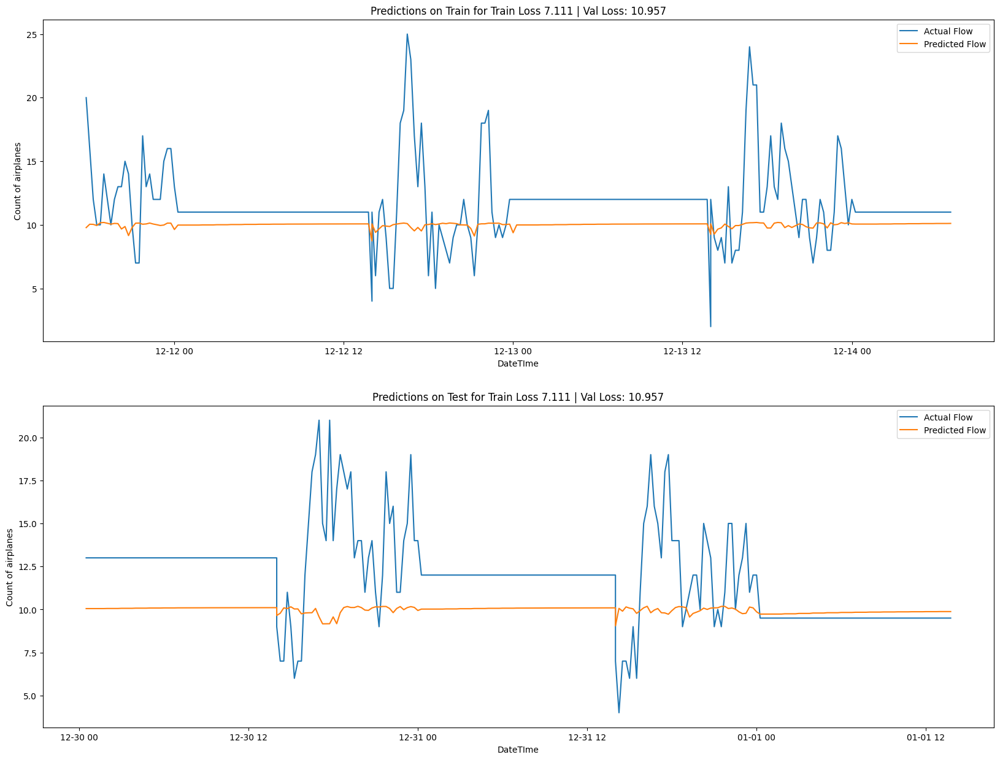


***********************************
Epoch: 3

Train Loss 5.889 | Val Loss: 8.723


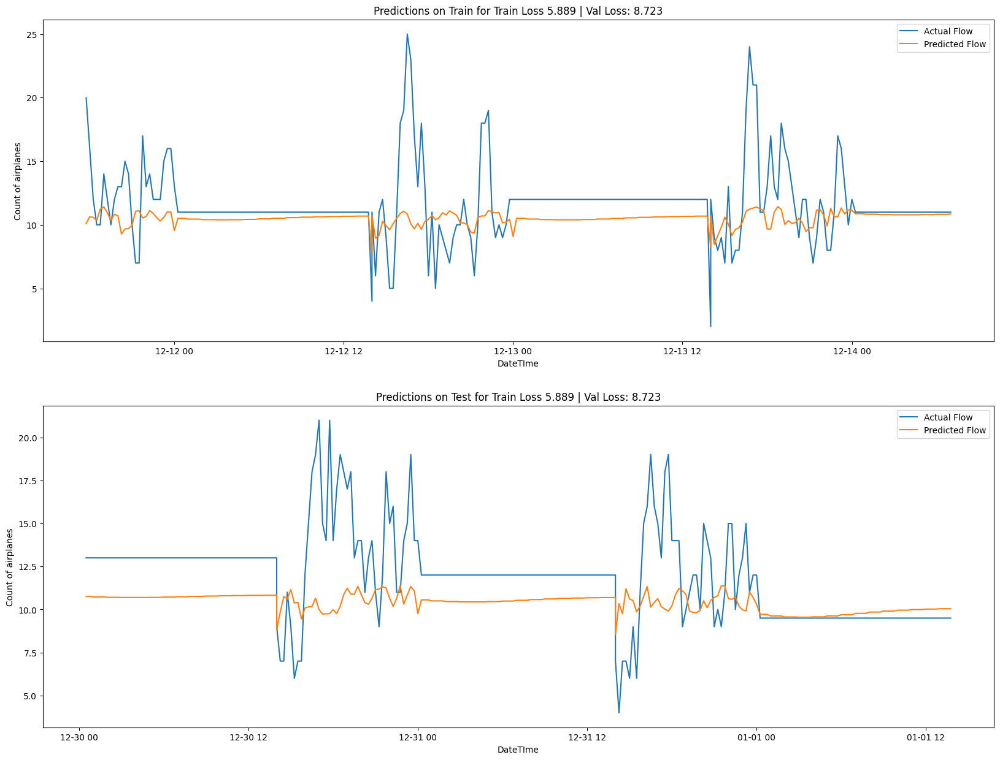


**********************************
Epoch: 4

Train Loss 5.551 | Val Loss: 7.807


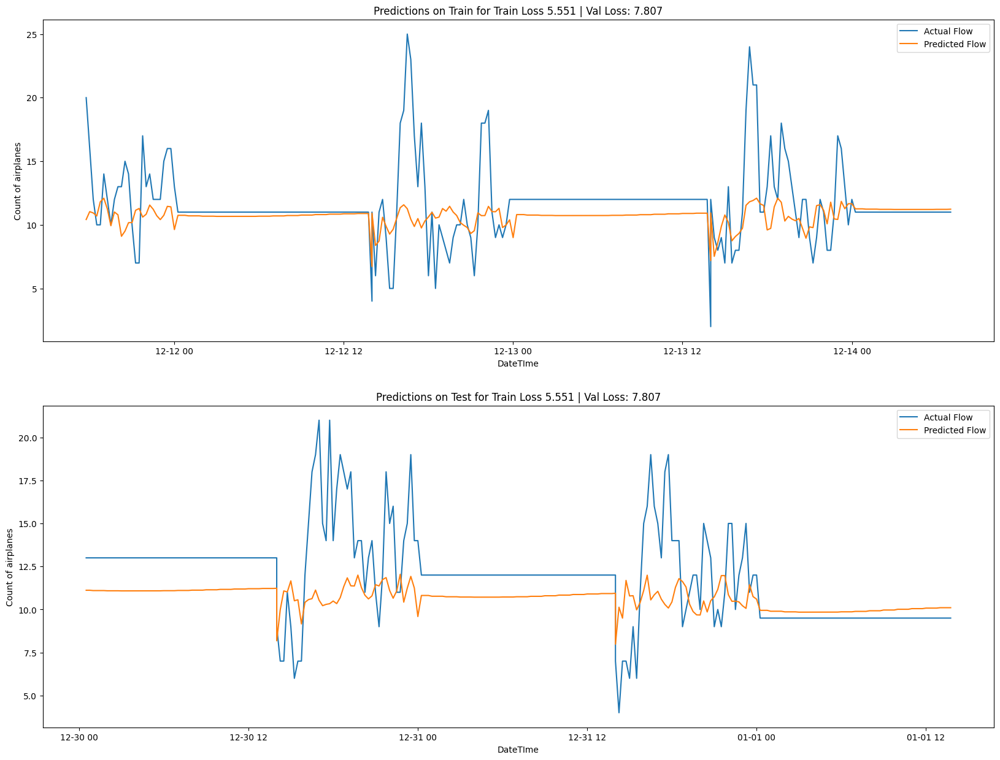


**********************************
Epoch: 5

Train Loss 5.426 | Val Loss: 7.195


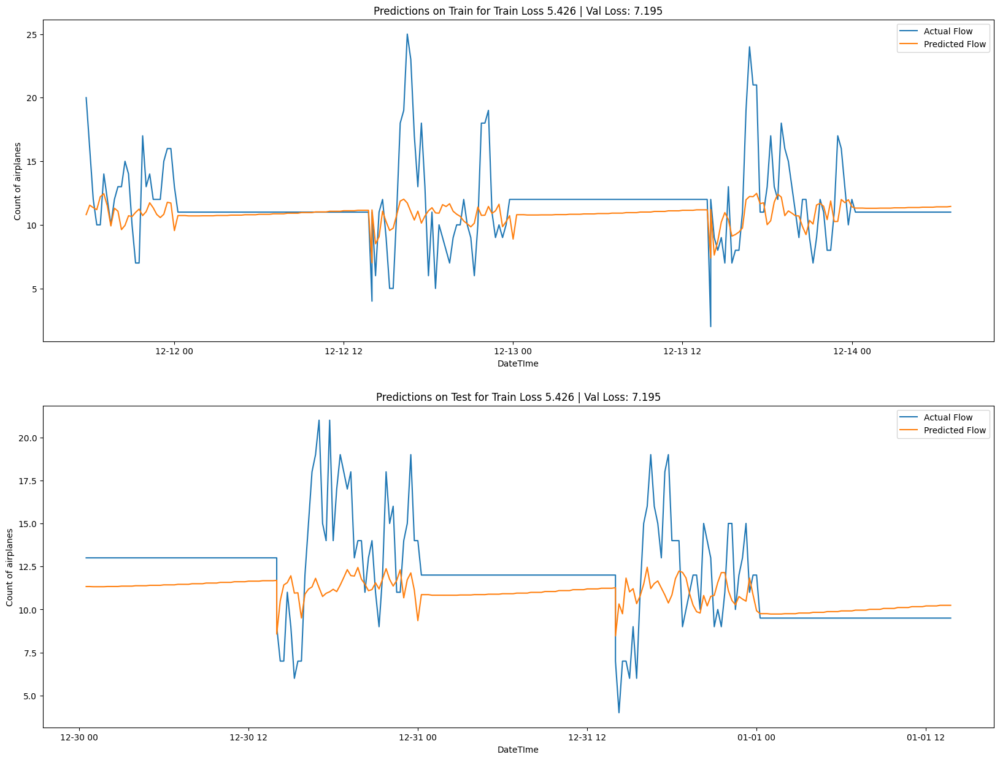


**********************************
Epoch: 6

Train Loss 5.37 | Val Loss: 6.991


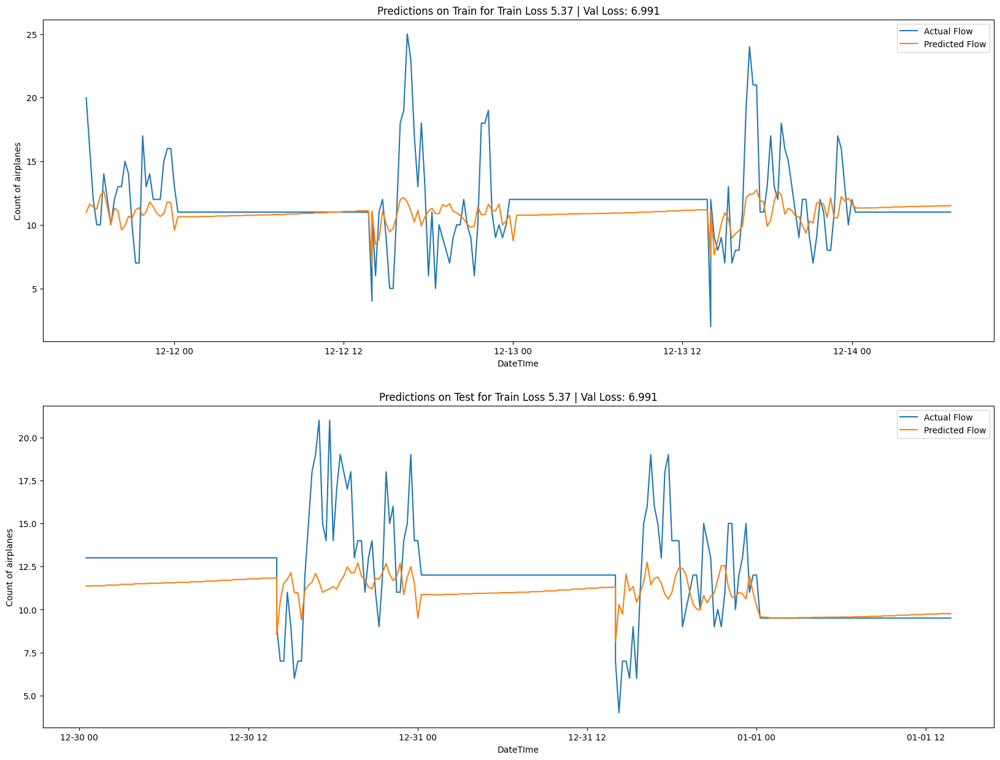


*********************************
Epoch: 7

Train Loss 5.334 | Val Loss: 6.803


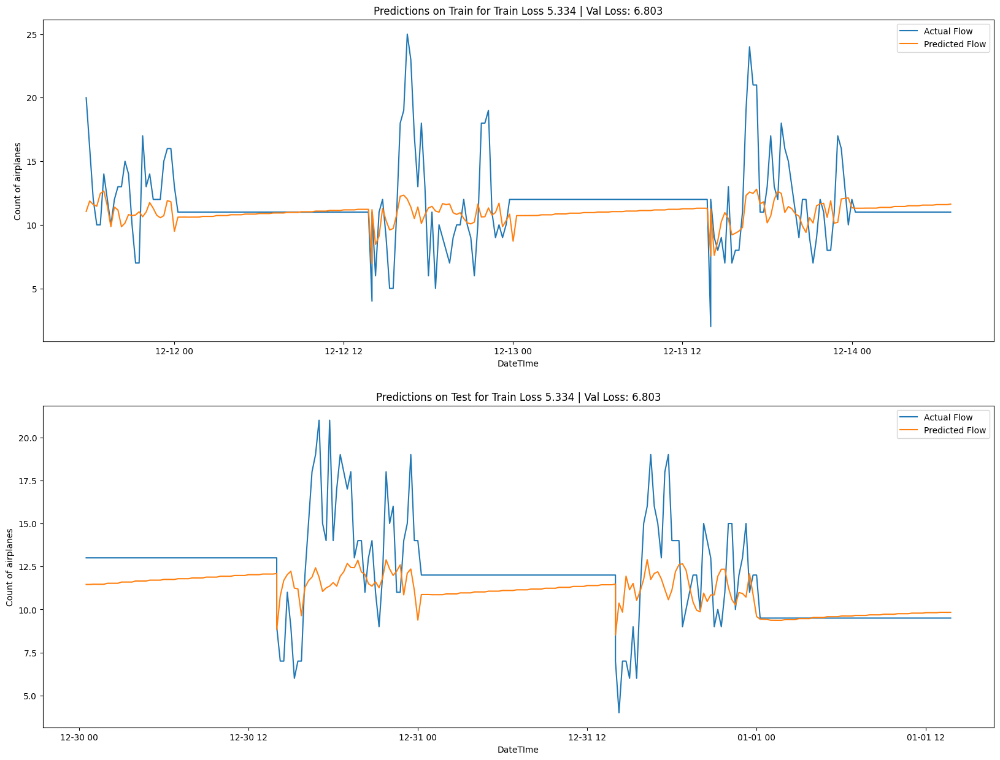


**********************************
Epoch: 8

Train Loss 5.303 | Val Loss: 6.829

**********************************
Epoch: 9

Train Loss 5.288 | Val Loss: 6.854

**********************************
Epoch: 10

Train Loss 5.271 | Val Loss: 6.833

**********************************
Epoch: 11

Train Loss 5.263 | Val Loss: 6.398


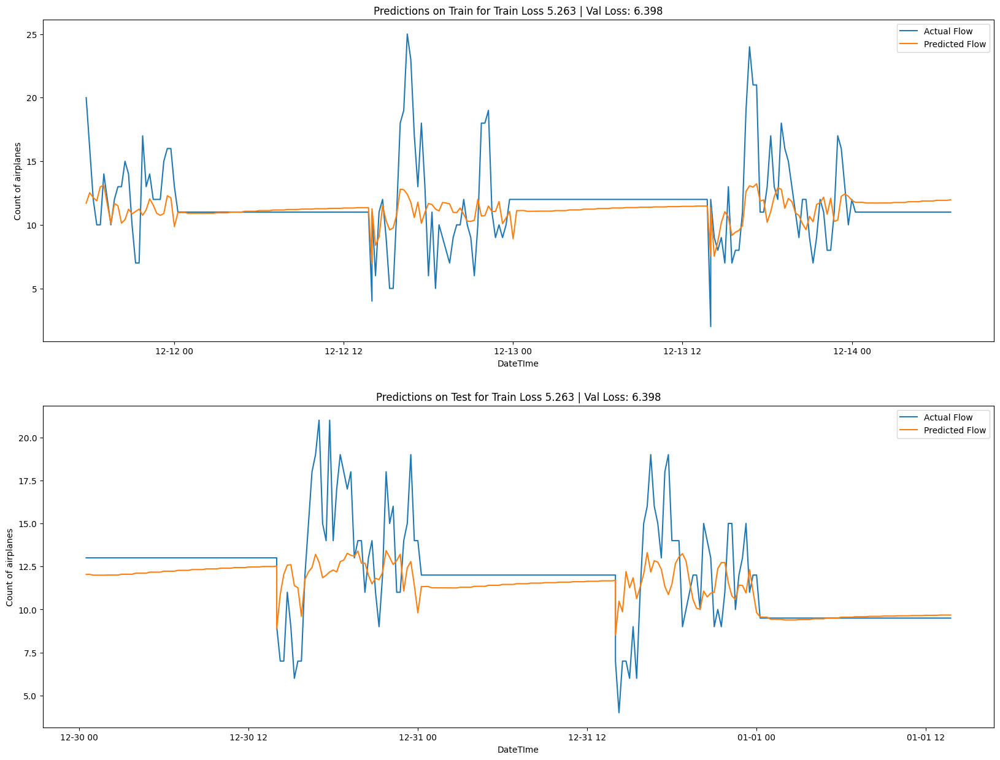


**********************************
Epoch: 12

Train Loss 5.24 | Val Loss: 6.562

*********************************
Epoch: 13

Train Loss 5.227 | Val Loss: 6.323


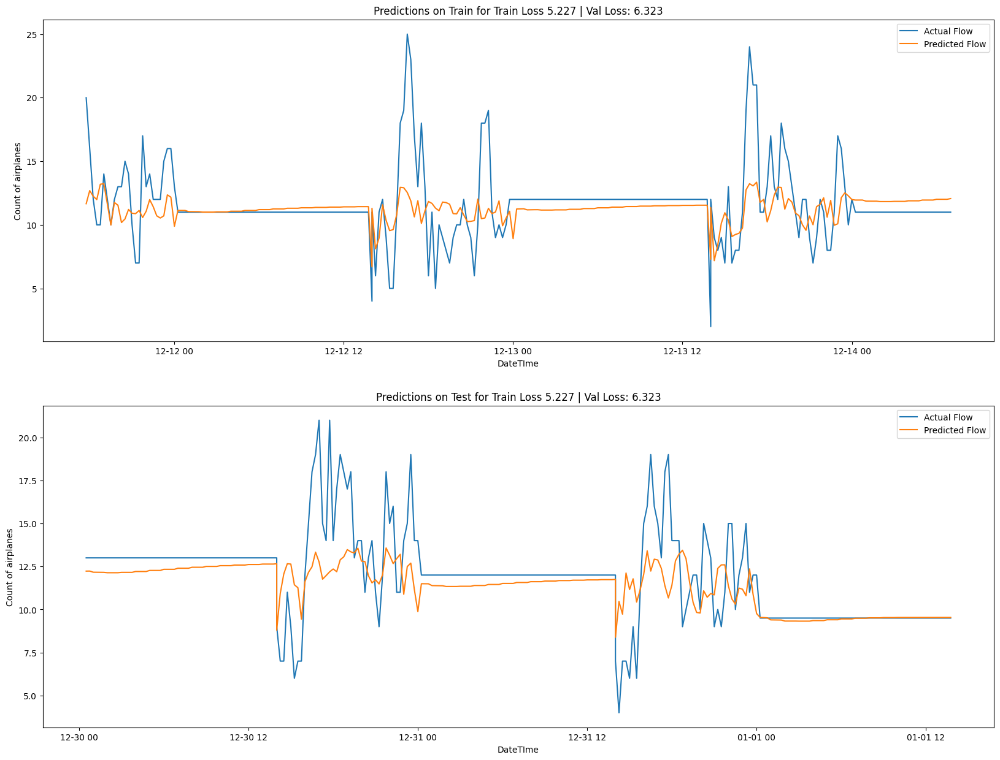


**********************************
Epoch: 14

Train Loss 5.215 | Val Loss: 6.36

*********************************
Epoch: 15

Train Loss 5.19 | Val Loss: 6.404

*********************************
Epoch: 16

Train Loss 5.169 | Val Loss: 6.564

**********************************
Epoch: 17

Train Loss 5.16 | Val Loss: 6.297


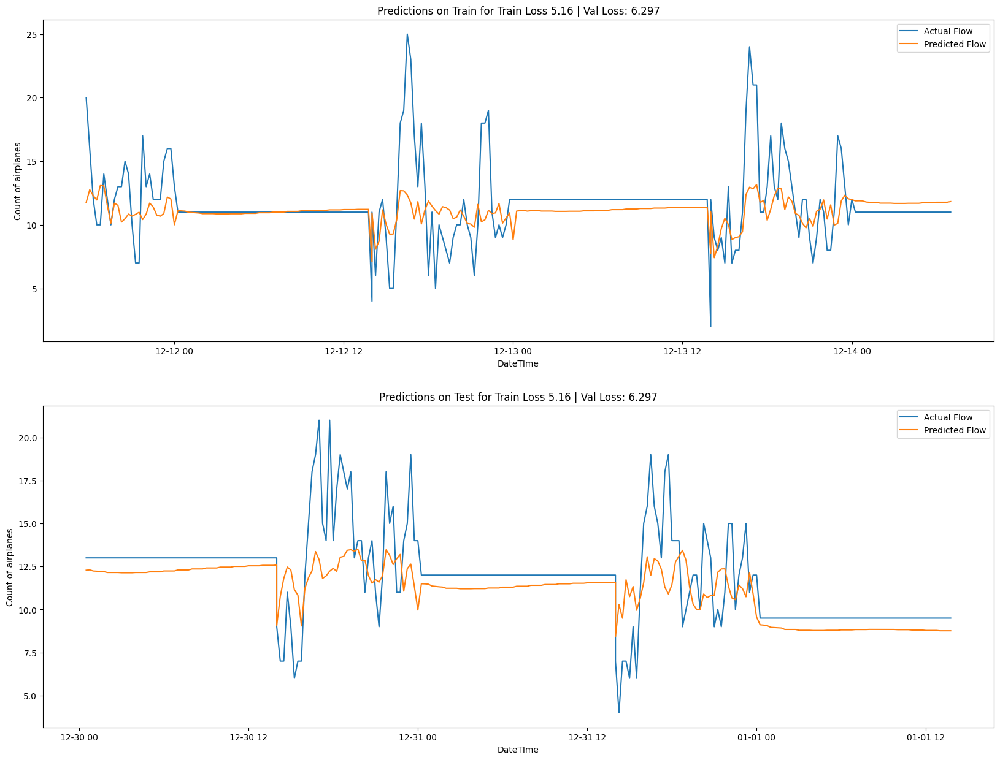


*********************************
Epoch: 18

Train Loss 5.127 | Val Loss: 6.375

**********************************
Epoch: 19

Train Loss 5.111 | Val Loss: 6.173


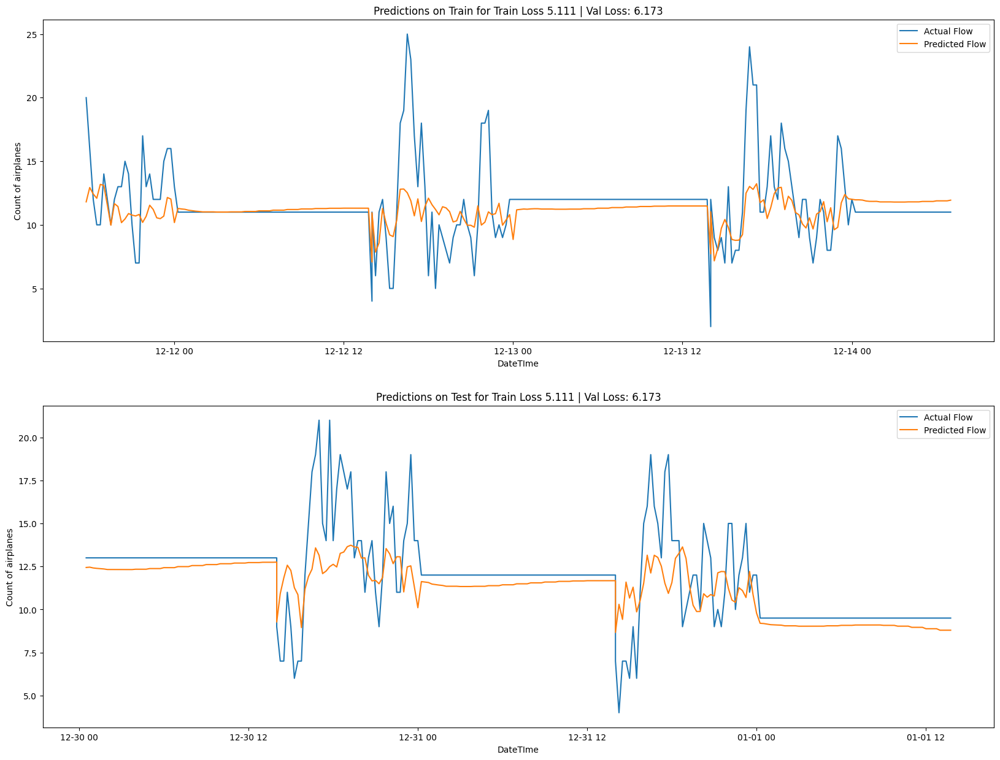


**********************************
Epoch: 20

Train Loss 5.072 | Val Loss: 6.124


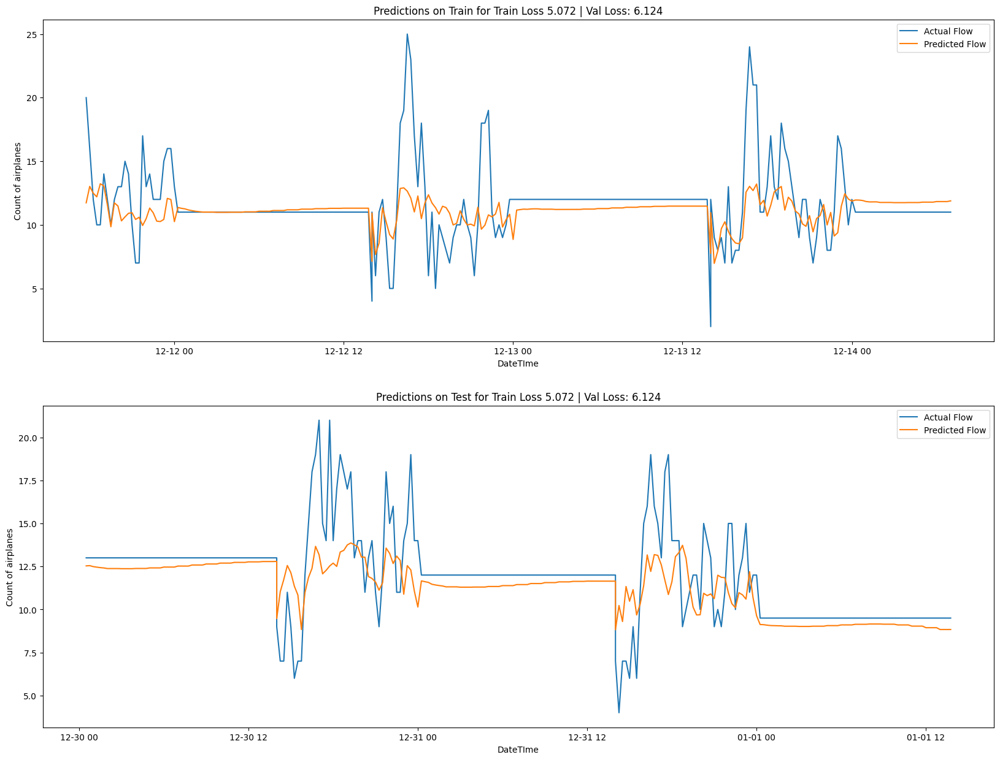


**********************************
Epoch: 21

Train Loss 5.034 | Val Loss: 5.988


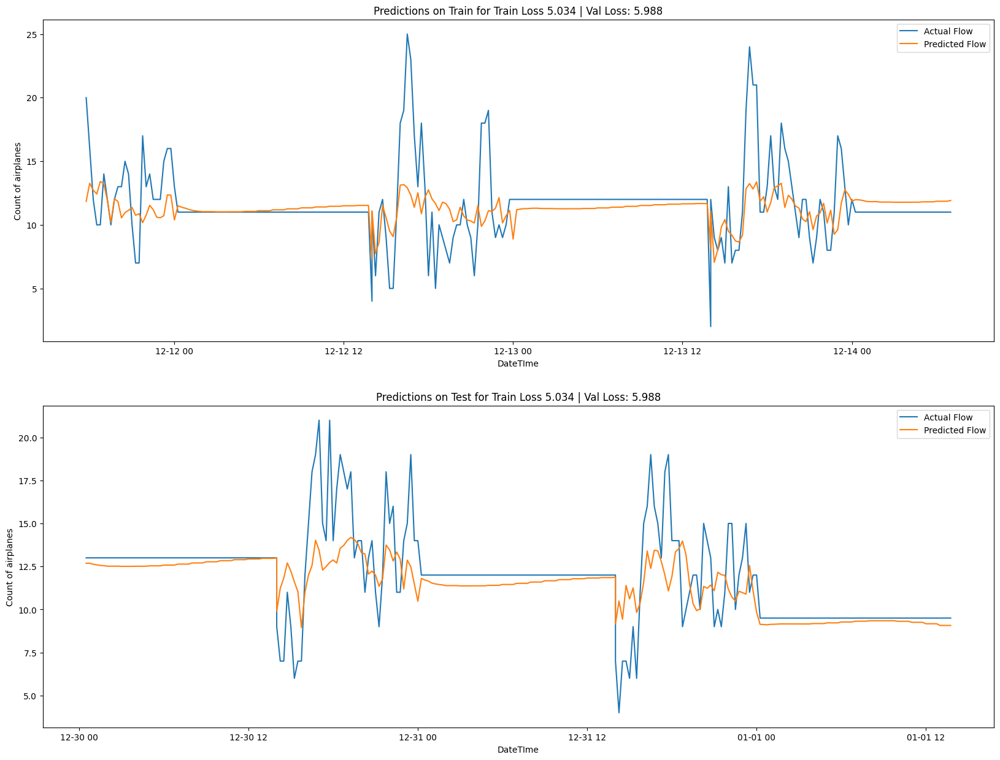


**********************************
Epoch: 22

Train Loss 4.984 | Val Loss: 5.932


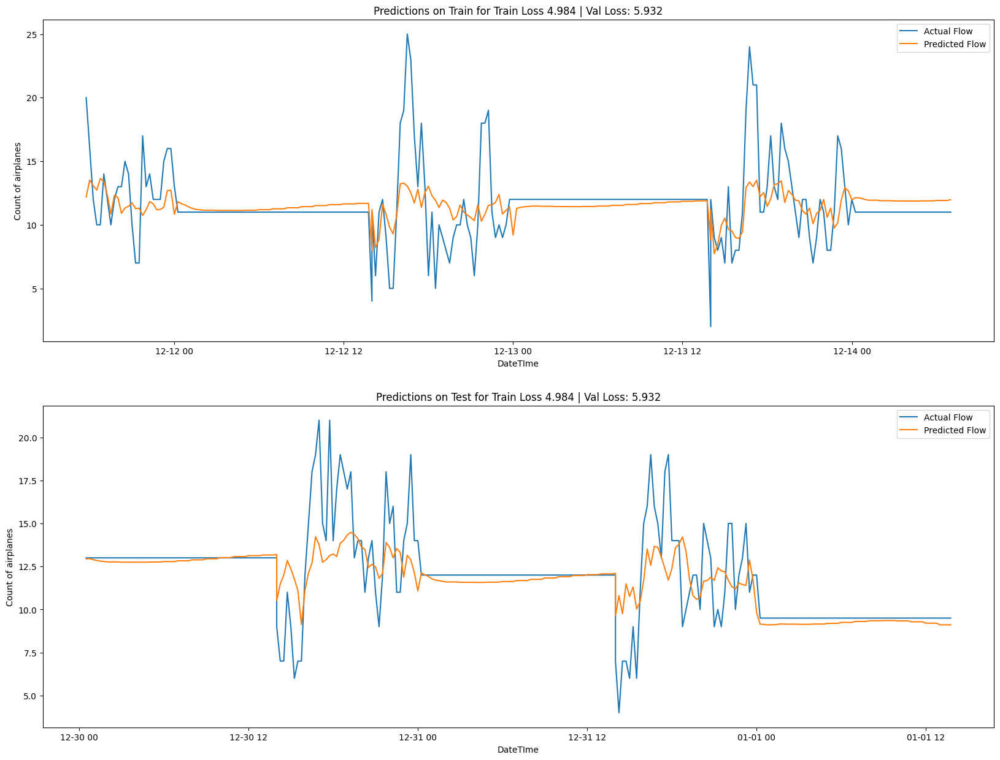


**********************************
Epoch: 23

Train Loss 4.942 | Val Loss: 5.923


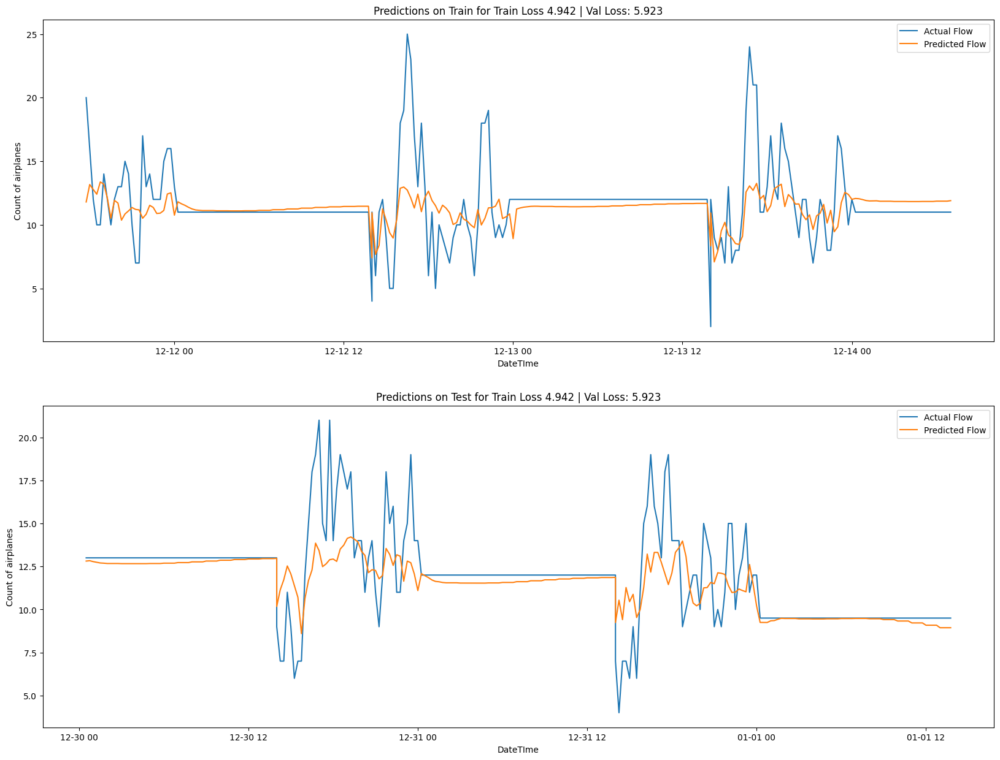


**********************************
Epoch: 24

Train Loss 4.922 | Val Loss: 5.901


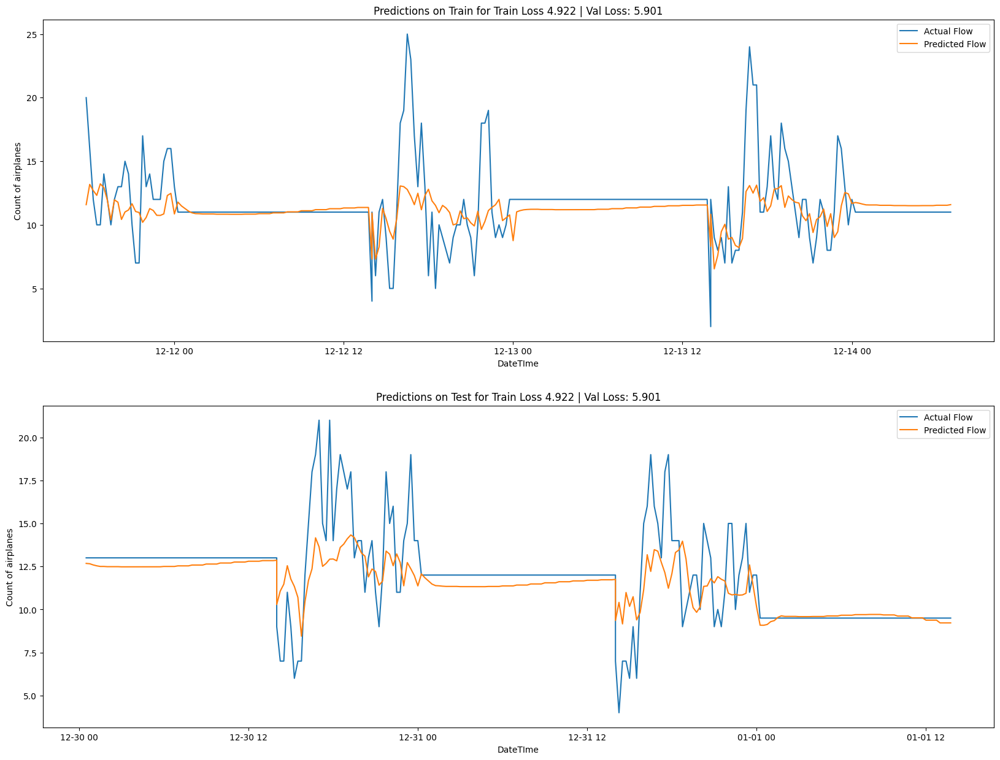


**********************************
Epoch: 25

Train Loss 4.899 | Val Loss: 5.855


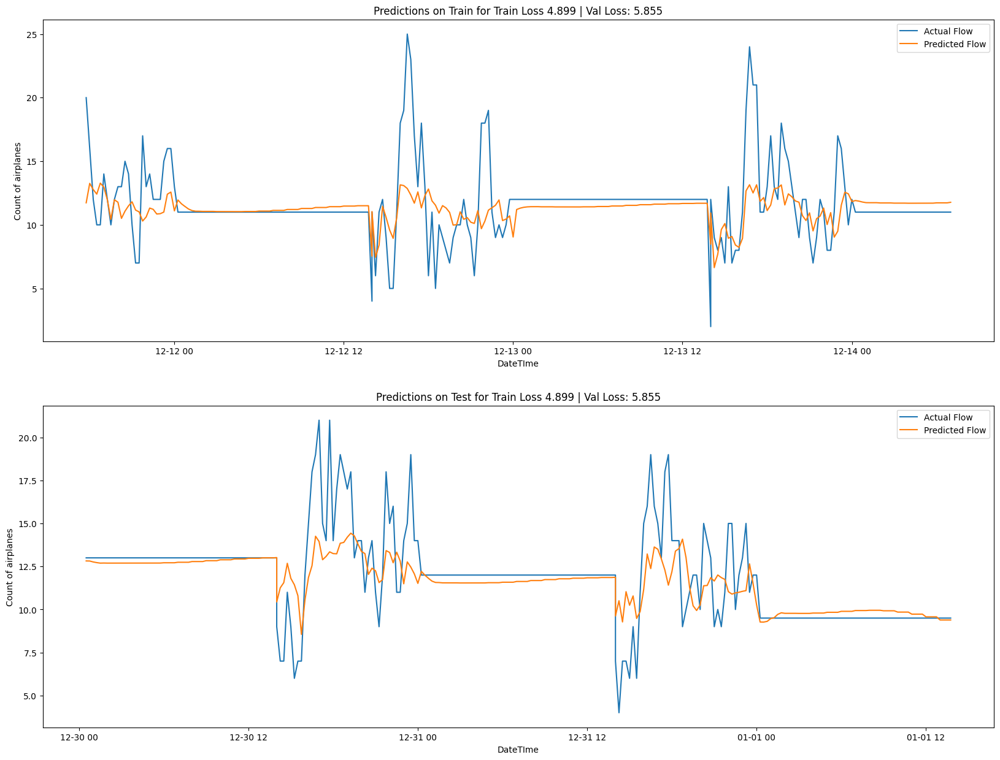


**********************************
Epoch: 26

Train Loss 4.887 | Val Loss: 5.836


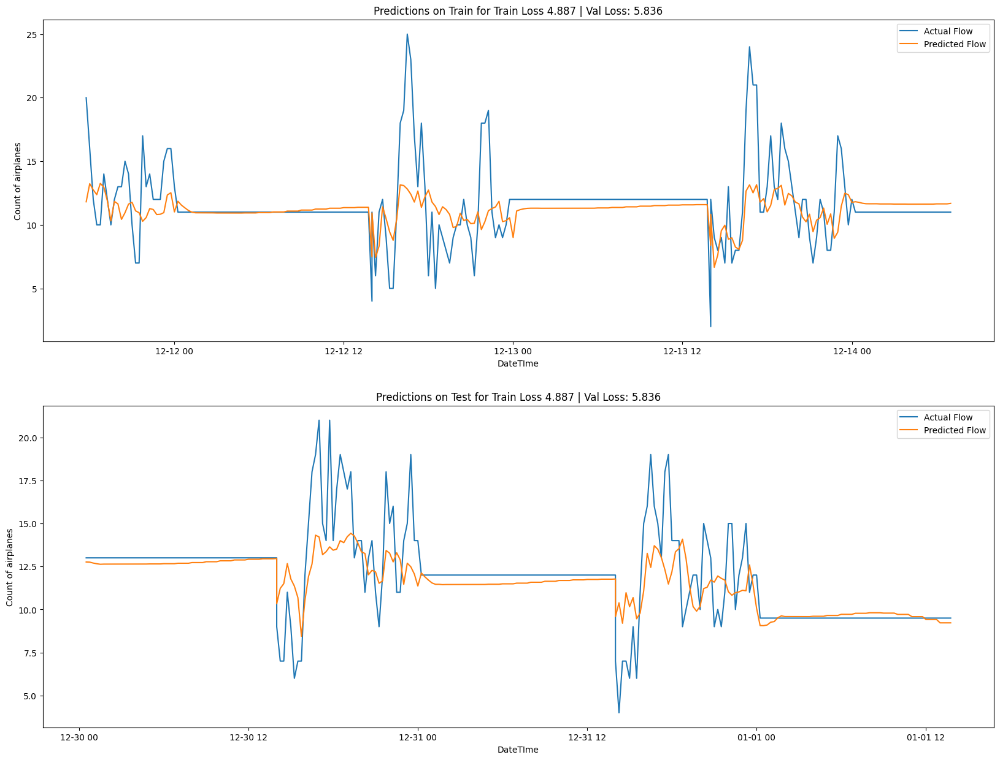


**********************************
Epoch: 27

Train Loss 4.898 | Val Loss: 5.941

**********************************
Epoch: 28

Train Loss 4.861 | Val Loss: 5.908

**********************************
Epoch: 29

Train Loss 4.835 | Val Loss: 5.839

**********************************
Epoch: 30

Train Loss 4.832 | Val Loss: 5.71


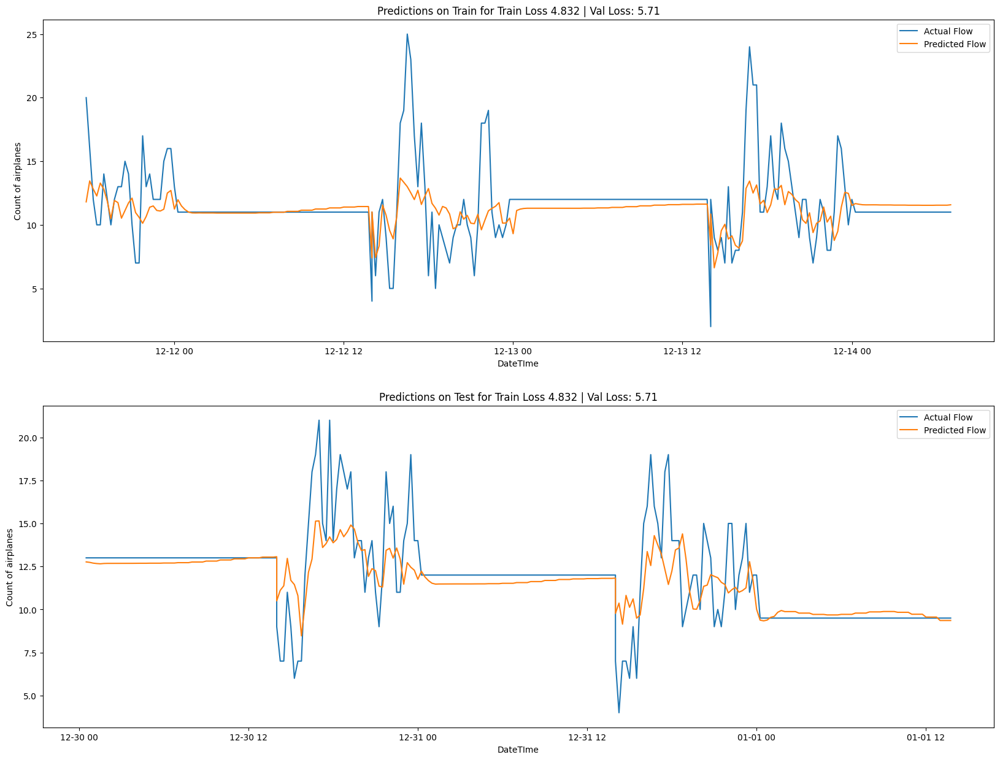


*********************************
Epoch: 31

Train Loss 4.815 | Val Loss: 5.823

**********************************
Epoch: 32

Train Loss 4.798 | Val Loss: 5.84

*********************************
Epoch: 33

Train Loss 4.794 | Val Loss: 5.57


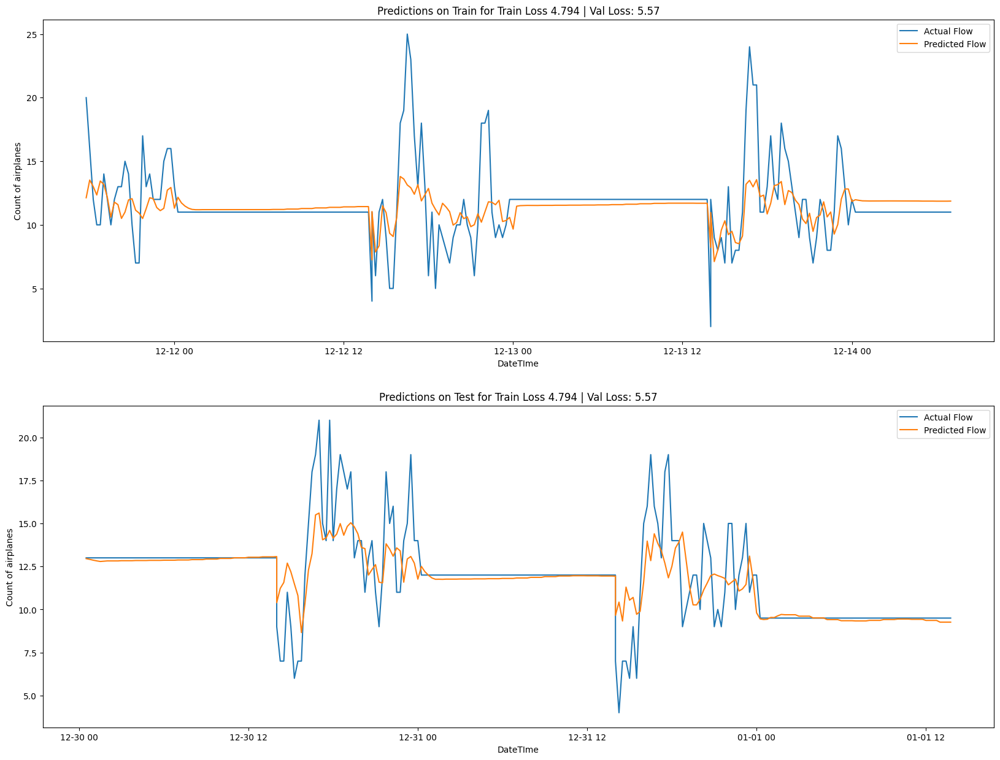


*********************************
Epoch: 34

Train Loss 4.774 | Val Loss: 5.675

**********************************
Epoch: 35

Train Loss 4.766 | Val Loss: 5.587

**********************************
Epoch: 36

Train Loss 4.761 | Val Loss: 5.663

**********************************
Epoch: 37

Train Loss 4.748 | Val Loss: 5.512


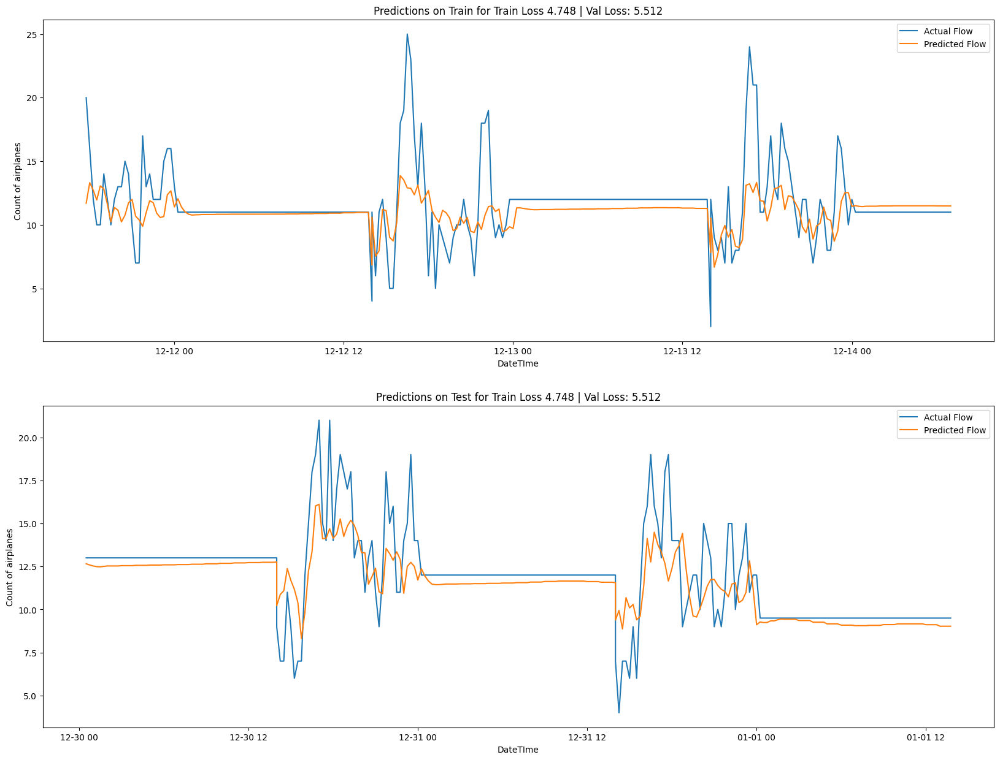


**********************************
Epoch: 38

Train Loss 4.74 | Val Loss: 5.649

*********************************
Epoch: 39

Train Loss 4.73 | Val Loss: 5.662

*********************************
Epoch: 40

Train Loss 4.739 | Val Loss: 5.547

**********************************
Epoch: 41

Train Loss 4.735 | Val Loss: 5.566

**********************************
Epoch: 42

Train Loss 4.723 | Val Loss: 5.65

*********************************
Epoch: 43

Train Loss 4.741 | Val Loss: 5.654

**********************************
Epoch: 44

Train Loss 4.725 | Val Loss: 5.583

**********************************
Epoch: 45

Train Loss 4.718 | Val Loss: 5.636

**********************************
Epoch: 46

Train Loss 4.705 | Val Loss: 5.62

*********************************
Epoch: 47

Train Loss 4.703 | Val Loss: 5.639

**********************************
Epoch: 48

Train Loss 4.706 | Val Loss: 5.564

**********************************
Epoch: 49

Train Loss 4.703 | Val Loss: 5.78

************************

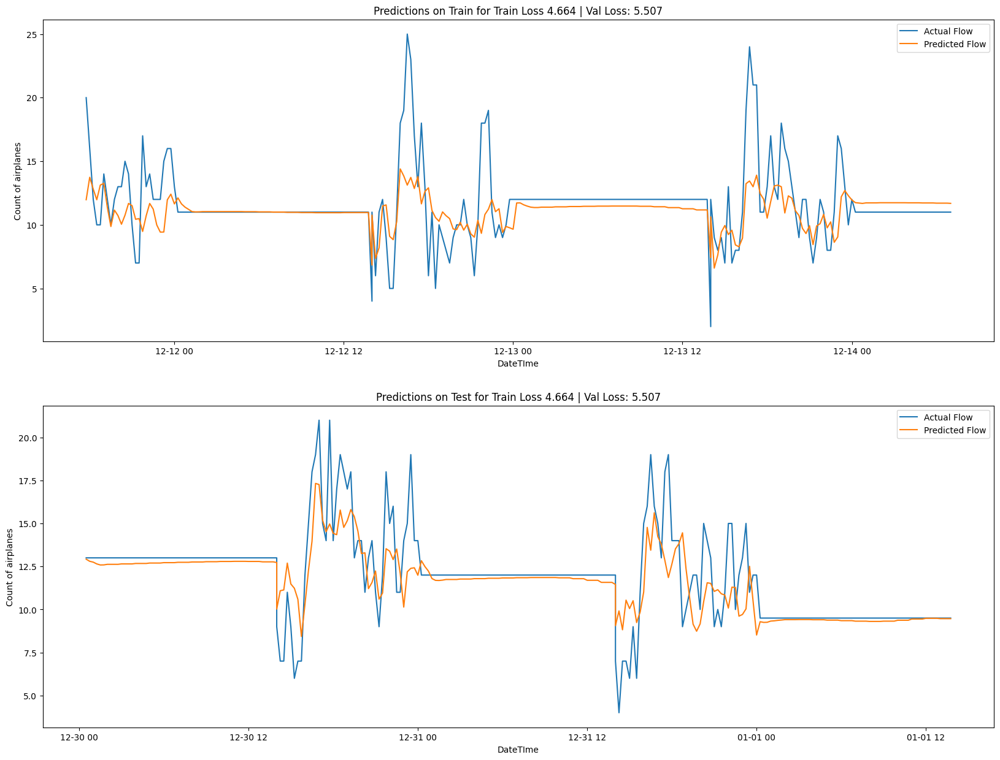


**********************************
Epoch: 57

Train Loss 4.652 | Val Loss: 5.517

**********************************
Epoch: 58

Train Loss 4.656 | Val Loss: 5.556

**********************************
Epoch: 59

Train Loss 4.639 | Val Loss: 5.632

**********************************
Epoch: 60

Train Loss 4.638 | Val Loss: 5.77

*********************************
Epoch: 61

Train Loss 4.626 | Val Loss: 5.609

**********************************
Epoch: 62

Train Loss 4.626 | Val Loss: 5.615

**********************************
Epoch: 63

Train Loss 4.623 | Val Loss: 5.806

**********************************
Epoch: 64

Train Loss 4.611 | Val Loss: 5.583

**********************************
Epoch: 65

Train Loss 4.601 | Val Loss: 5.617

**********************************
Epoch: 66

Train Loss 4.591 | Val Loss: 5.643

**********************************
Epoch: 67

Train Loss 4.571 | Val Loss: 5.588

**********************************
Epoch: 68

Train Loss 4.583 | Val Loss: 5.565

*****************

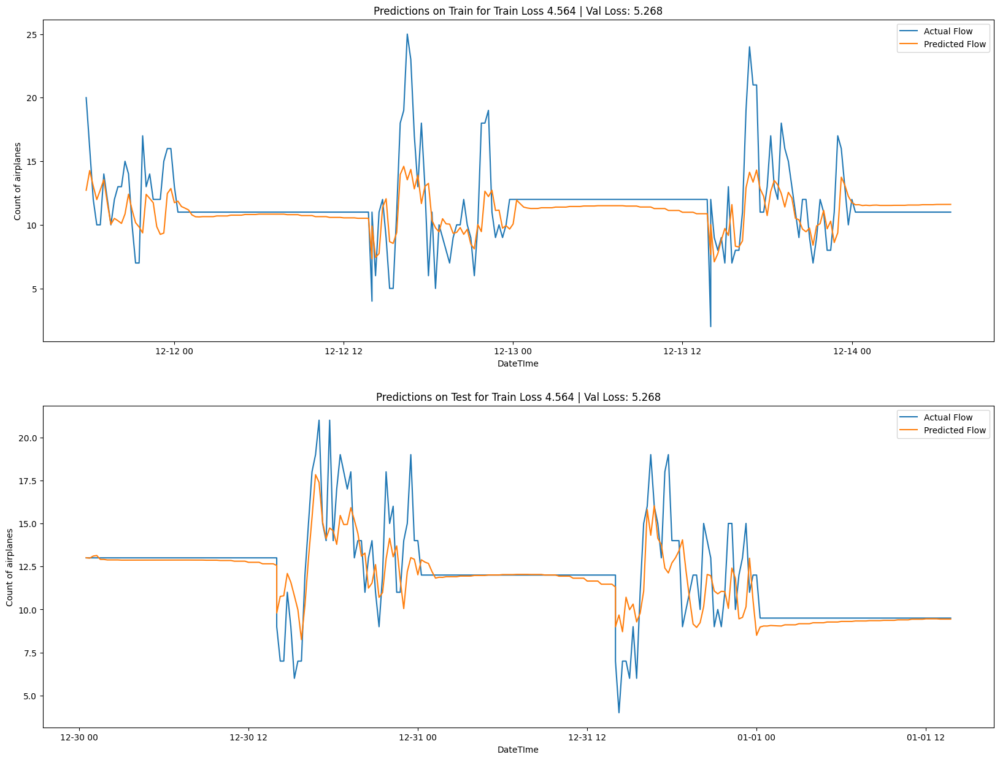


**********************************
Epoch: 70

Train Loss 4.54 | Val Loss: 5.409

*********************************
Epoch: 71

Train Loss 4.524 | Val Loss: 5.252


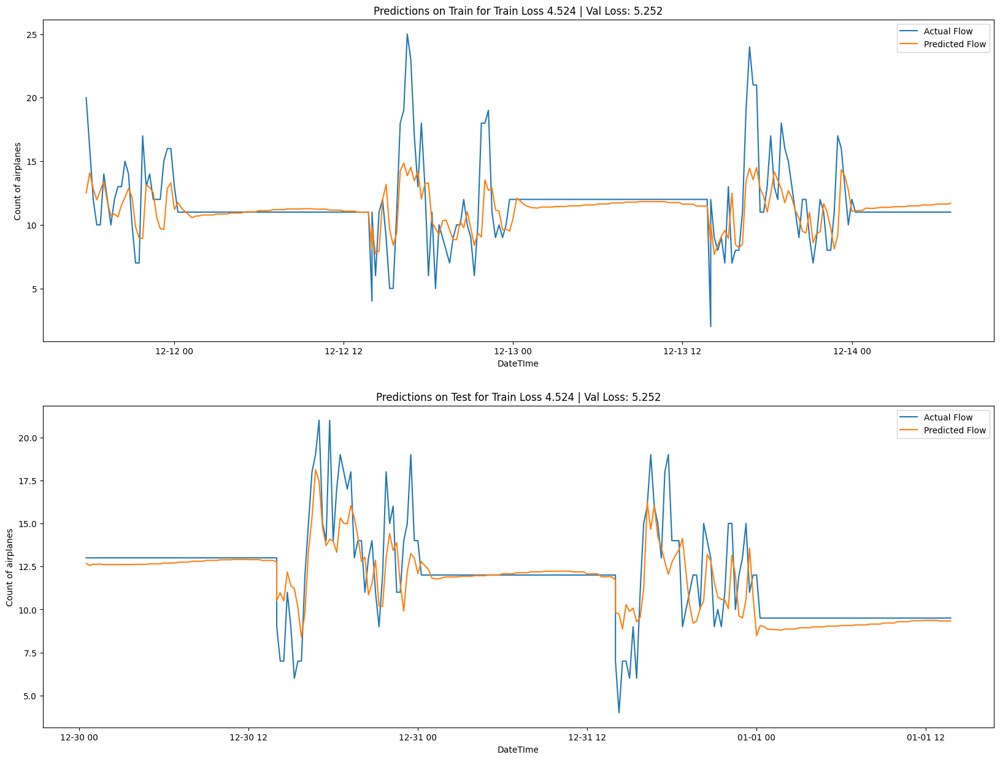


**********************************
Epoch: 72

Train Loss 4.487 | Val Loss: 5.145


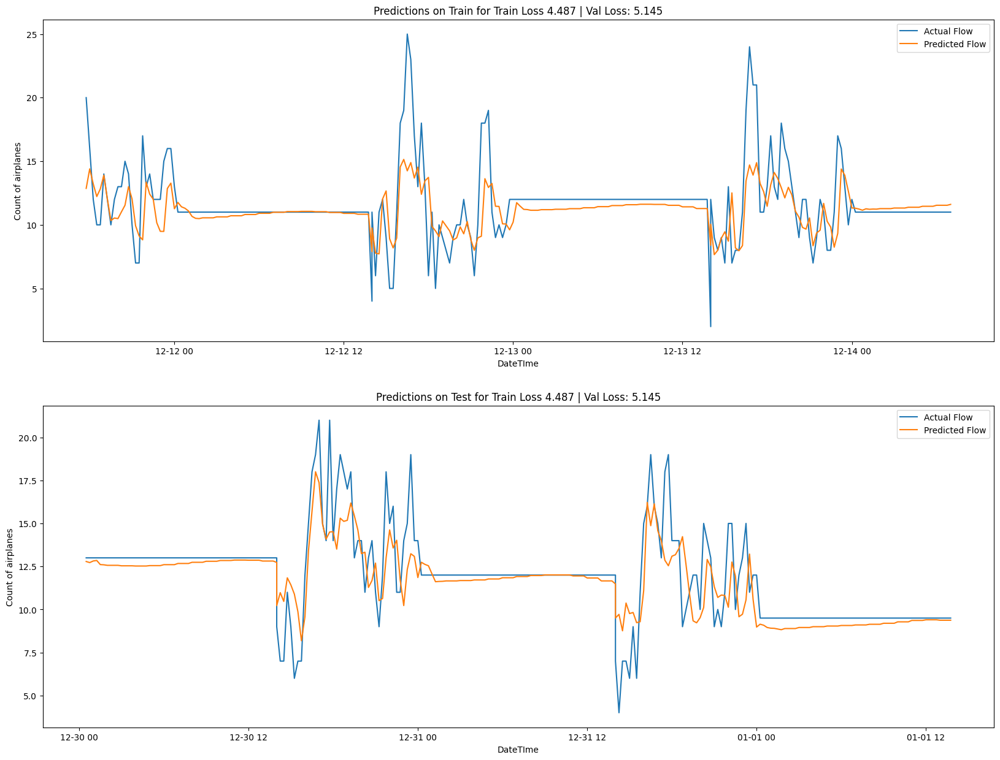


**********************************
Epoch: 73

Train Loss 4.475 | Val Loss: 5.489

**********************************
Epoch: 74

Train Loss 4.458 | Val Loss: 5.049


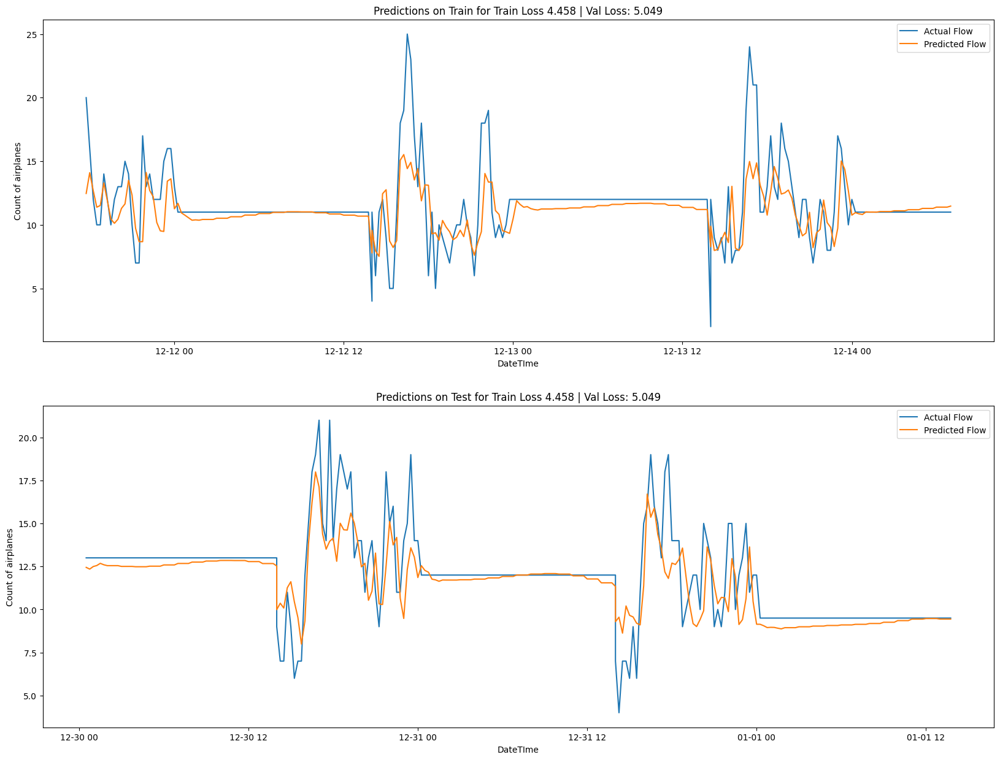


**********************************
Epoch: 75

Train Loss 4.434 | Val Loss: 5.185

**********************************
Epoch: 76

Train Loss 4.424 | Val Loss: 5.105

**********************************
Epoch: 77

Train Loss 4.414 | Val Loss: 5.138

**********************************
Epoch: 78

Train Loss 4.392 | Val Loss: 5.323

**********************************
Epoch: 79

Train Loss 4.382 | Val Loss: 5.102

**********************************
Epoch: 80

Train Loss 4.379 | Val Loss: 5.322

**********************************
Epoch: 81

Train Loss 4.356 | Val Loss: 5.308

**********************************
Epoch: 82

Train Loss 4.354 | Val Loss: 5.197

**********************************
Epoch: 83

Train Loss 4.356 | Val Loss: 4.91


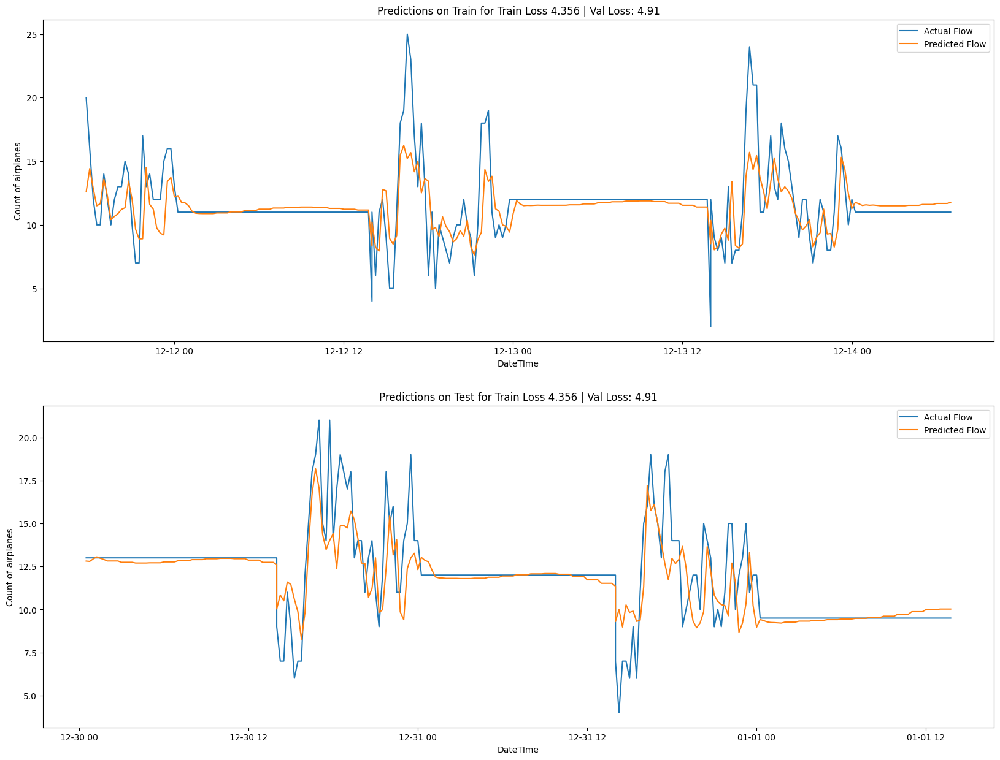


*********************************
Epoch: 84

Train Loss 4.339 | Val Loss: 5.593

**********************************
Epoch: 85

Train Loss 4.336 | Val Loss: 4.836


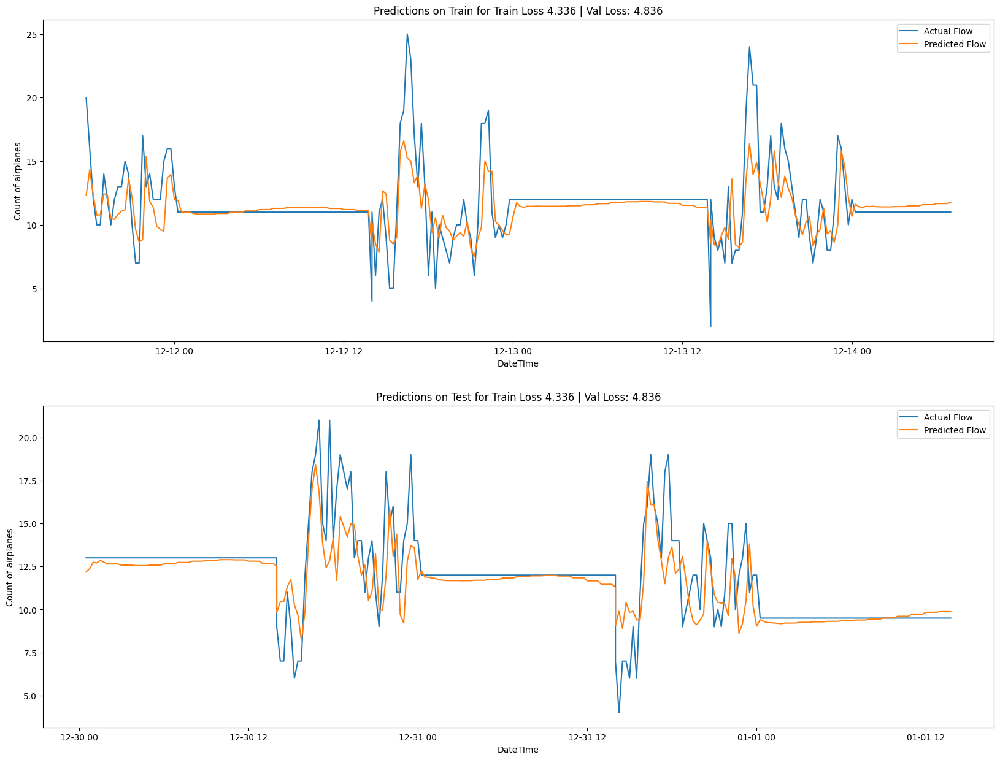


**********************************
Epoch: 86

Train Loss 4.319 | Val Loss: 4.871

**********************************
Epoch: 87

Train Loss 4.32 | Val Loss: 4.874

*********************************
Epoch: 88

Train Loss 4.31 | Val Loss: 5.368

*********************************
Epoch: 89

Train Loss 4.299 | Val Loss: 5.123

**********************************
Epoch: 90

Train Loss 4.303 | Val Loss: 5.073

**********************************
Epoch: 91

Train Loss 4.298 | Val Loss: 5.19

*********************************
Epoch: 92

Train Loss 4.305 | Val Loss: 4.912

**********************************
Epoch: 93

Train Loss 4.28 | Val Loss: 5.647

*********************************
Epoch: 94

Train Loss 4.289 | Val Loss: 5.146

**********************************
Epoch: 95

Train Loss 4.28 | Val Loss: 4.883

*********************************
Epoch: 96

Train Loss 4.281 | Val Loss: 5.143

**********************************
Epoch: 97

Train Loss 4.276 | Val Loss: 4.96

**************************

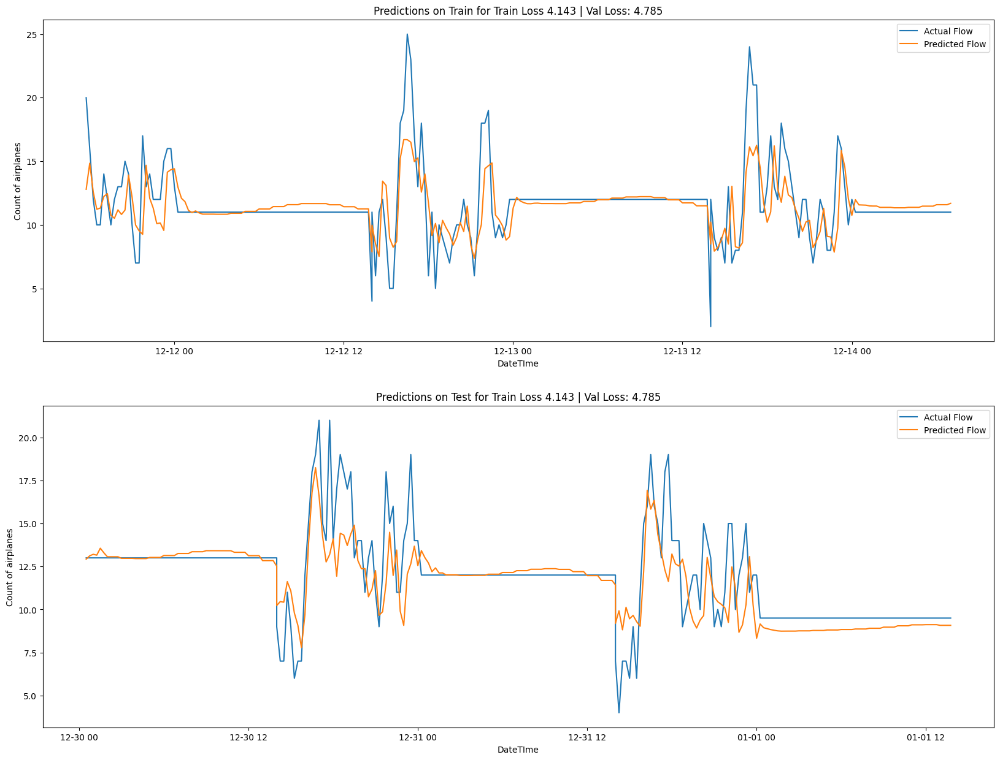


**********************************
Epoch: 138

Train Loss 4.159 | Val Loss: 5.253

**********************************
Epoch: 139

Train Loss 4.151 | Val Loss: 4.902

**********************************
Epoch: 140

Train Loss 4.146 | Val Loss: 4.952

**********************************
Epoch: 141

Train Loss 4.137 | Val Loss: 4.966

**********************************
Epoch: 142

Train Loss 4.163 | Val Loss: 5.076

**********************************
Epoch: 143

Train Loss 4.14 | Val Loss: 4.891

*********************************
Epoch: 144

Train Loss 4.139 | Val Loss: 5.415

**********************************
Epoch: 145

Train Loss 4.137 | Val Loss: 4.897

**********************************
Epoch: 146

Train Loss 4.144 | Val Loss: 5.102

**********************************
Epoch: 147

Train Loss 4.14 | Val Loss: 5.245

*********************************
Epoch: 148

Train Loss 4.131 | Val Loss: 4.787

**********************************
Epoch: 149

Train Loss 4.15 | Val Loss: 5.115

********

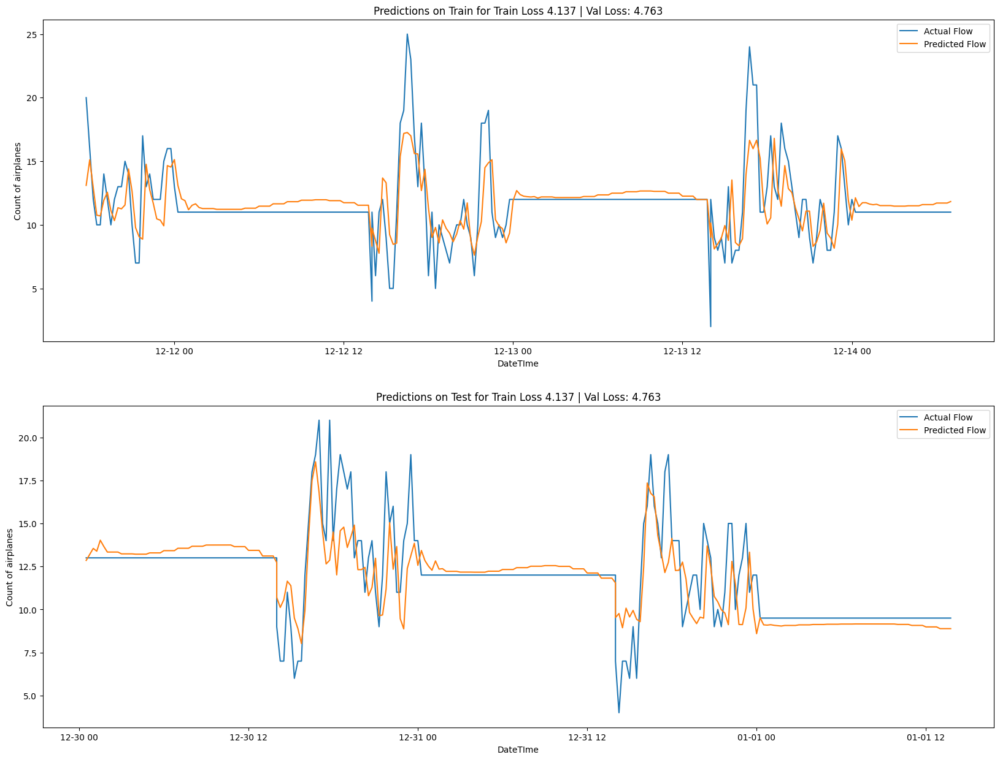


**********************************
Epoch: 153

Train Loss 4.143 | Val Loss: 5.263

**********************************
Epoch: 154

Train Loss 4.128 | Val Loss: 5.106

**********************************
Epoch: 155

Train Loss 4.125 | Val Loss: 4.95

*********************************
Epoch: 156

Train Loss 4.137 | Val Loss: 4.942

**********************************
Epoch: 157

Train Loss 4.134 | Val Loss: 4.952

**********************************
Epoch: 158

Train Loss 4.132 | Val Loss: 4.999

**********************************
Epoch: 159

Train Loss 4.119 | Val Loss: 5.23

*********************************
Epoch: 160

Train Loss 4.136 | Val Loss: 4.883

**********************************
Epoch: 161

Train Loss 4.125 | Val Loss: 5.107

**********************************
Epoch: 162

Train Loss 4.13 | Val Loss: 5.127

*********************************
Epoch: 163

Train Loss 4.124 | Val Loss: 4.864

**********************************
Epoch: 164

Train Loss 4.117 | Val Loss: 5.154

*********

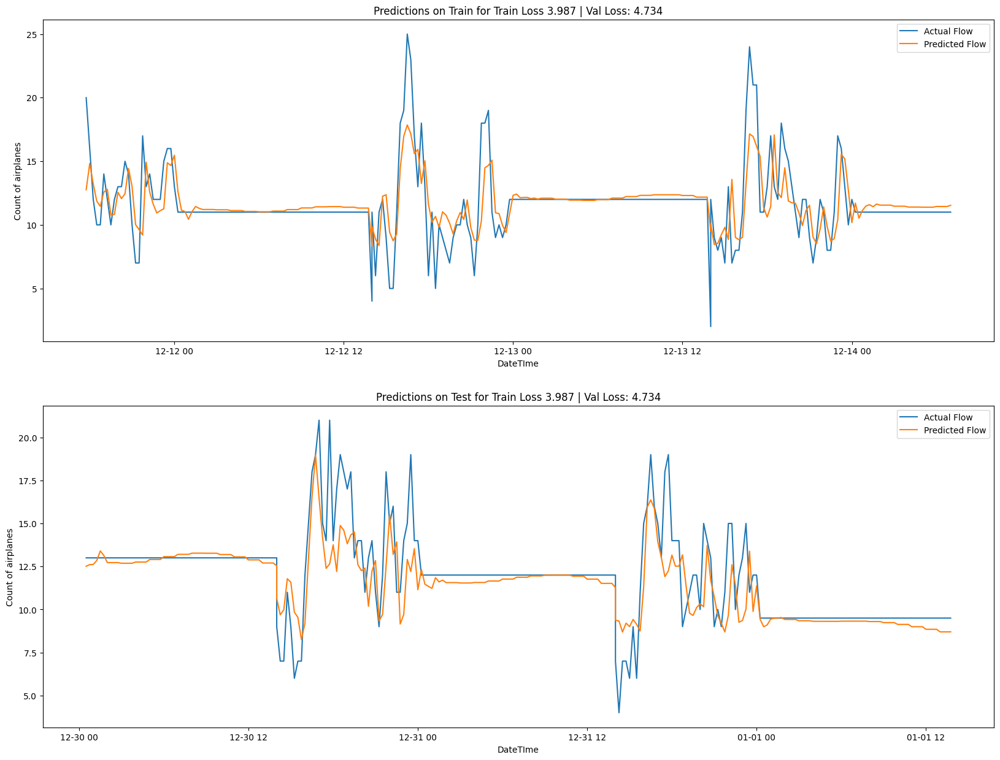


**********************************
Epoch: 394

Train Loss 3.978 | Val Loss: 4.886

**********************************
Epoch: 395

Train Loss 3.98 | Val Loss: 4.878

*********************************
Epoch: 396

Train Loss 3.977 | Val Loss: 4.946

**********************************
Epoch: 397

Train Loss 3.988 | Val Loss: 5.008

**********************************
Epoch: 398

Train Loss 3.983 | Val Loss: 4.89

*********************************
Epoch: 399

Train Loss 3.977 | Val Loss: 4.9

********************************
Epoch: 400

Train Loss 4.011 | Val Loss: 4.803

**********************************
Epoch: 401

Train Loss 3.954 | Val Loss: 4.851

**********************************
Epoch: 402

Train Loss 3.948 | Val Loss: 4.799

**********************************
Epoch: 403

Train Loss 3.943 | Val Loss: 4.914

**********************************
Epoch: 404

Train Loss 3.948 | Val Loss: 4.837

**********************************
Epoch: 405

Train Loss 3.946 | Val Loss: 4.753

***********

In [27]:
model = GRU(1, 4, 1)
model.to(device)
best_model = model
display(model)

# learning_rate = 0.001
# num_epochs = 300
loss_function = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
scheduler = StepLR(optimizer, step_size=200, gamma=0.5)
# scheduler = CosineAnnealingLR(optimizer, T_max=num_epochs)

datapoints = [250, 2500, 10000]
start = -(datapoints[0] - 1)
end = -1

min_loss = inf

# Usage example
loss_history,best_lstm = train_and_evaluate(model,num_epochs,start,end)  # Example values for arguments
print("Loss history:", loss_history)

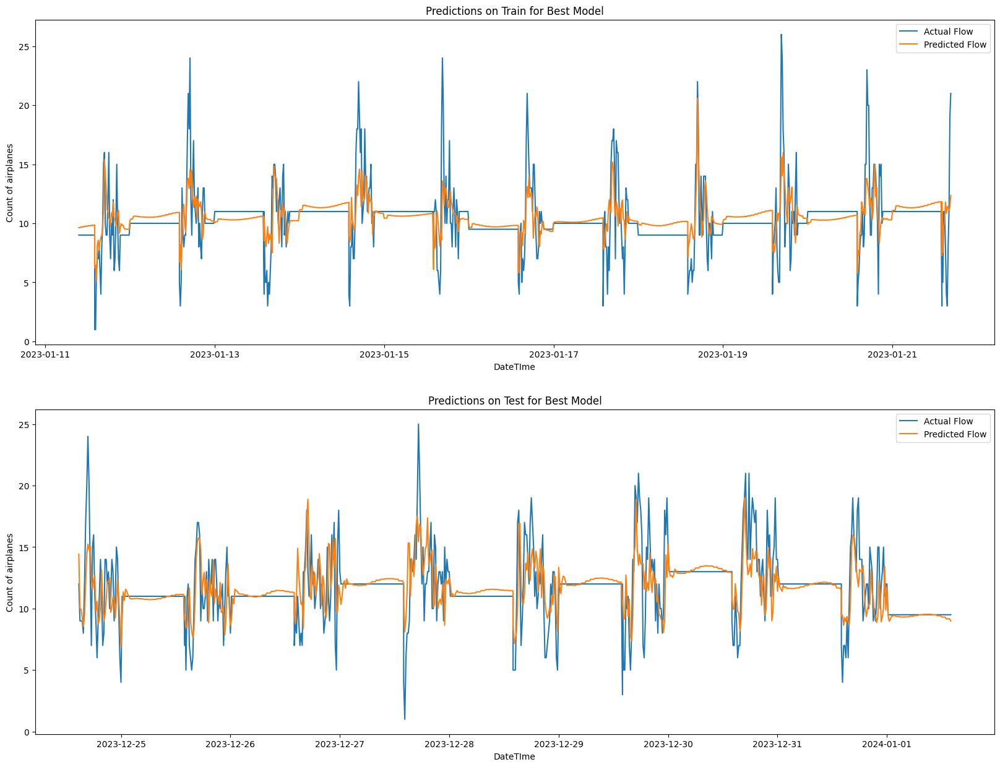

In [28]:
plot_datapoints(1000,2000,"Best Model", best_model)

En este caso se obtuvieron mejores resultados para LSTM (```MSE_min = 4.707```) respecto a GRU (```MSE_min = 4.734```)